## Import

In [1]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [2]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [3]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "mass_smaller_14"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [4]:
override = True
use_preds = False
save = True
show = True

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


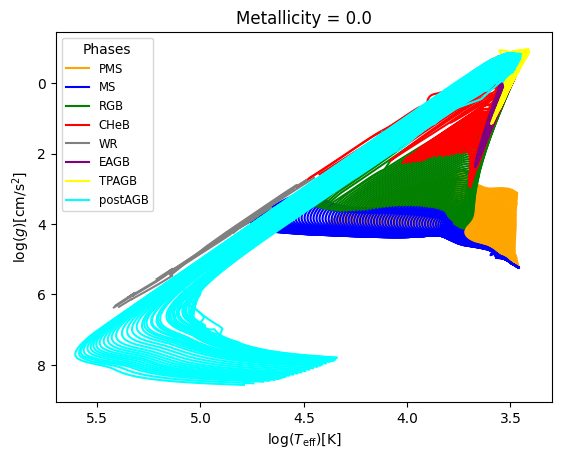

In [5]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

In [6]:
print_uniques("star_mass", iso_df)
# print_uniques_count("star_mass", iso_df)

star_mass : 1467117 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
630600,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
630601,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
630602,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
630603,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


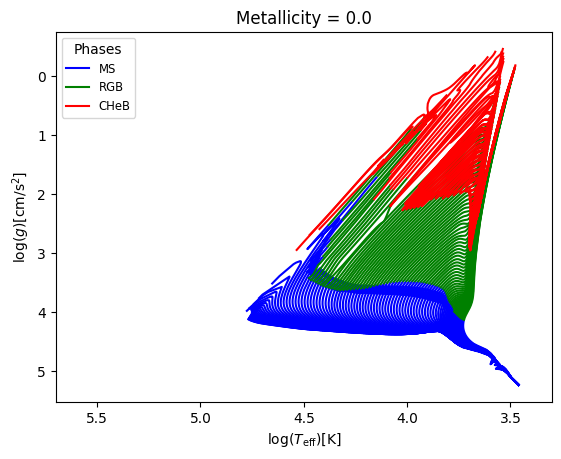

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_uniques("star_mass", phase_filtered_iso_df)
# print_uniques_count("star_mass", phase_filtered_iso_df)

star_mass : 630605 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.00,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.00,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.00,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.05,4.482577,4.350883,0.0,-0.25,12.925175,0.596074
4,5.05,4.485667,4.349692,0.0,-0.25,13.105490,0.600130
...,...,...,...,...,...,...,...
519286,10.30,3.602322,1.827453,3.0,0.50,0.866616,1.274247
519287,10.30,3.600999,1.809405,3.0,0.50,0.866614,1.283270
519288,10.30,3.599710,1.791489,3.0,0.50,0.866612,1.292228
519289,10.30,3.598418,1.773621,3.0,0.50,0.866610,1.301161


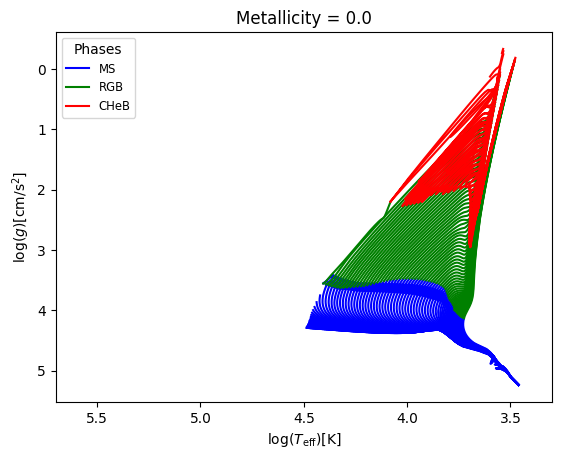

In [9]:
phase_mass_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3], "star_mass" : ("<", 14)})
display(phase_mass_filtered_iso_df)
data_visualiser_phase_age_filtered = Data_visualiser(phase_mass_filtered_iso_df, physical_model)
data_visualiser_phase_age_filtered.plot_Kiel([], [0.0])

In [10]:
print_all_uniques(phase_mass_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.4629, Median : 8.5

log_Teff  : Range : 3.34 - 4.6345, Mean : 3.9346, Median : 3.8644

log_g  : Range : -1.08 - 5.4331, Mean : 3.5485, Median : 3.9492

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 13.9995, Mean : 3.398, Median : 2.0471

log_R  : Range : -1.0 - 3.0828, Mean : 0.6067, Median : 0.5386



In [11]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_mass_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 4.634489491902143
Median value in train data for the log_Teff parameter: 3.8641118622993966
Mean value in train data for the log_Teff parameter: 3.9345581069095505

Range in train data for the log_g parameter : -1.0828963170617296 - 5.433094523832443
Median value in train data for the log_g parameter: 3.9484790508590737
Mean value in train data for the log_g parameter: 3.548006174763417

Range in train data for the log_R parameter : -0.9974747647513328 - 3.082068881511837
Median value in train data for the log_R parameter: 0.5381900688843242
Mean value in train data for the log_R parameter: 0.6069651248403705

Testing set statistics:
Range in test data for the log_Teff parameter : 3.344711147414537 - 4.633956017110521
Median value in test data for the log_Teff parameter: 3.865317881638998
Mean value in test data for the log_Teff parameter: 3.9346904482232112

Range in test data for the log_g p

## Model training

### Linear regression

In [12]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.747039363314733
  RMSE :  0.15761081054257312
  MAE :  0.13580161922596984
  MedAE :  0.13978939113477917
  CORR :  0.8653632874170336
  MAX_ER :  0.768320162252929
  Percentiles : 
    75th percentile :  0.19273889185852244
    90th percentile :  0.23076871650676428
    95th percentile :  0.24862071570336544
    99th percentile :  0.33349199100312465

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.678145364875463
  RMSE :  0.1425795815725404
  MAE :  0.10823384825289754
  MedAE :  0.08910971836591064
  CORR :  0.8251398762758946
  MAX_ER :  0.7251774774018651
  Percentiles : 
    75th percentile :  0.14465574145607152
    90th percentile :  0.20896386442017845
    9

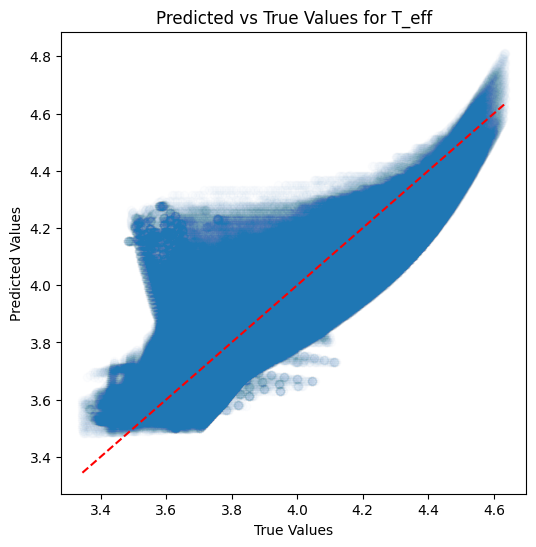

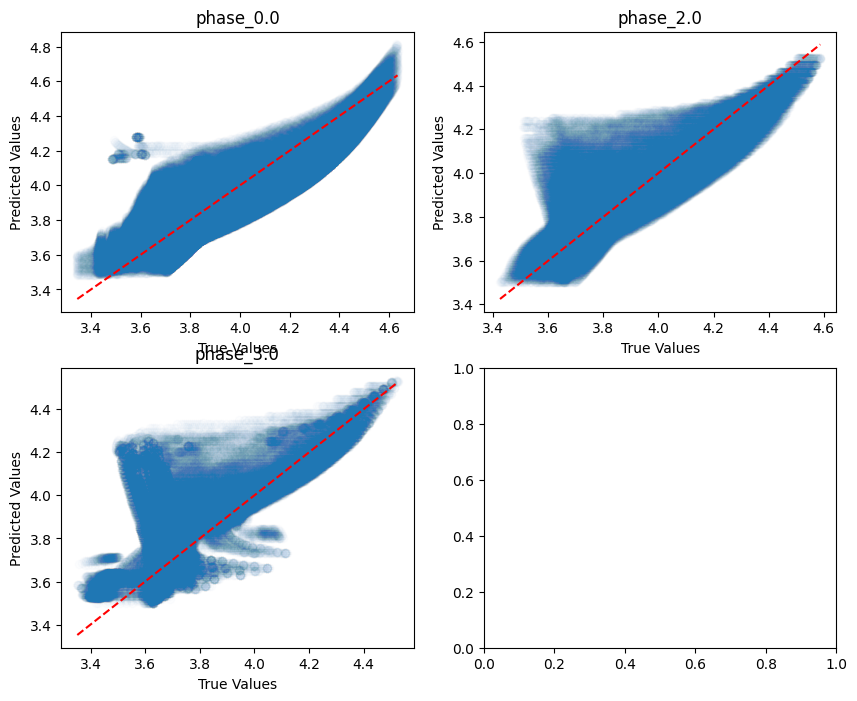

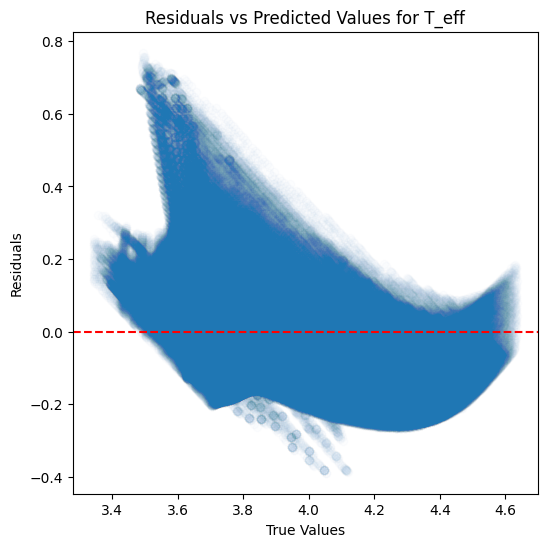

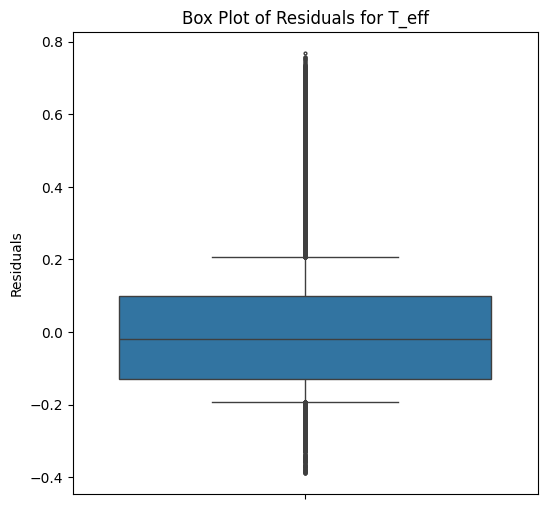

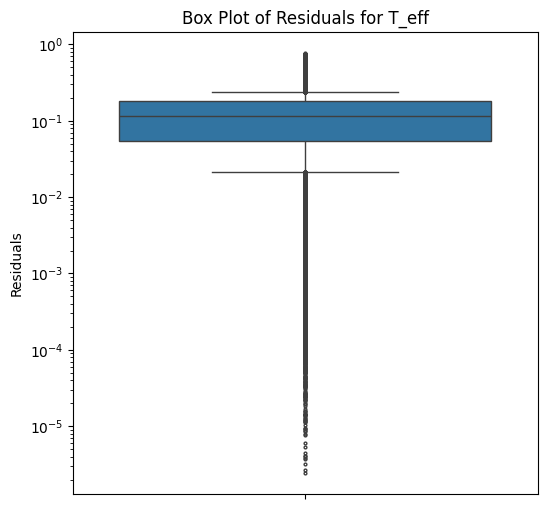

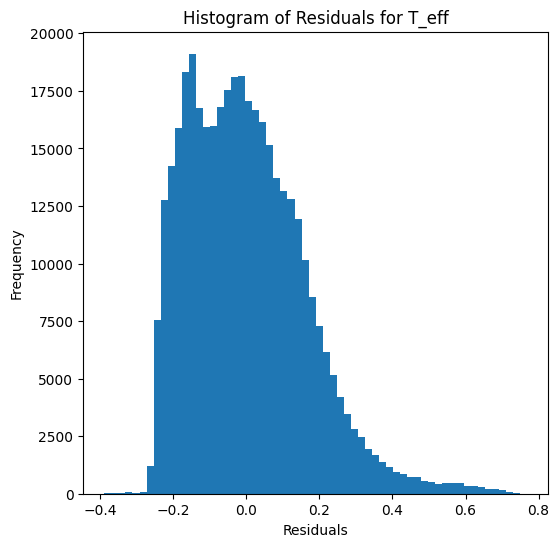

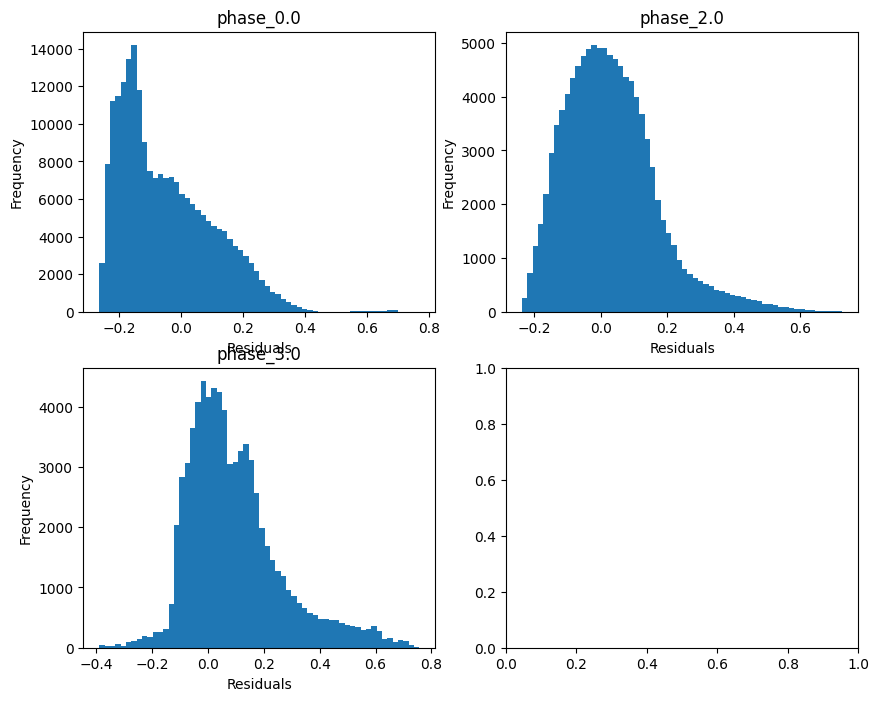

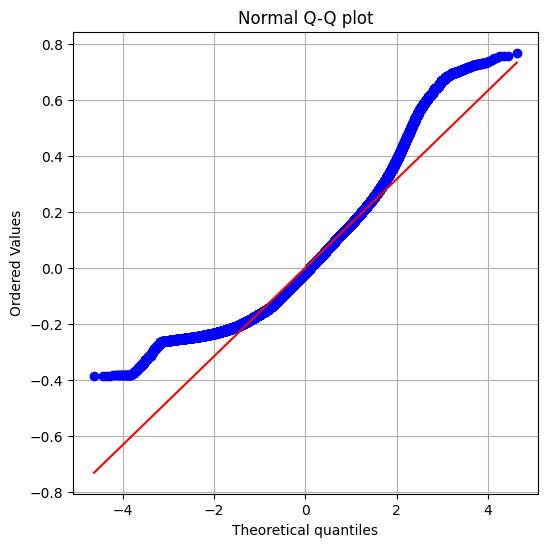

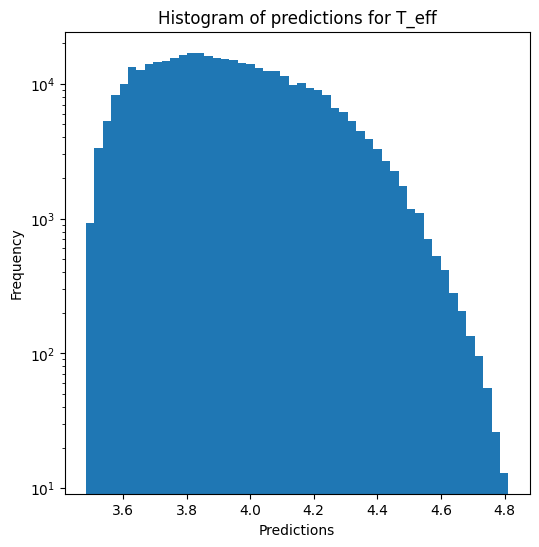

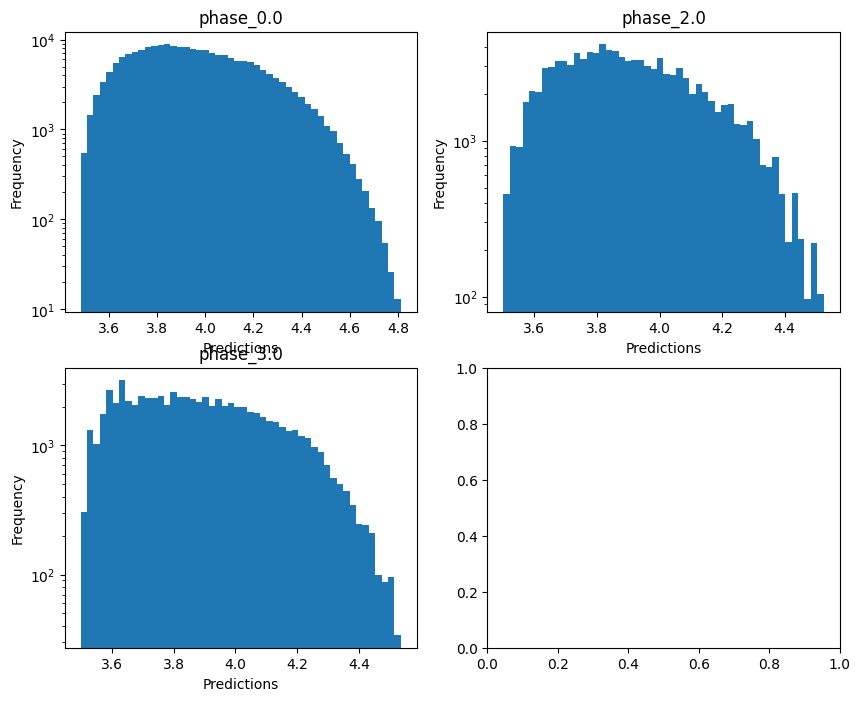

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -0.844565358746435
  RMSE :  0.9286347190739513
  MAE :  0.765535156791094
  MedAE :  0.6407871161164493
  CORR :  0.45563954743444723
  MAX_ER :  3.1294577680887707
  Percentiles : 
    75th percentile :  1.0952907627306185
    90th percentile :  1.571793091151871
    95th percentile :  1.789109710296607
    99th percentile :  2.1271342021587927

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.11325394232664077
  RMSE :  1.053791841121688
  MAE :  0.8311594809036305
  MedAE :  0.679899347479342
  CORR :  0.36751055359689394
  MAX_ER :  2.7626946775415644
  Percentiles : 
    75th percentile :  1.2504419314985973
    90th percentile :  1.8059837957430032
    95th percentile :  2.1267820734527163
    99th percentile :  2.528160543717586

log_g results for the phase cate

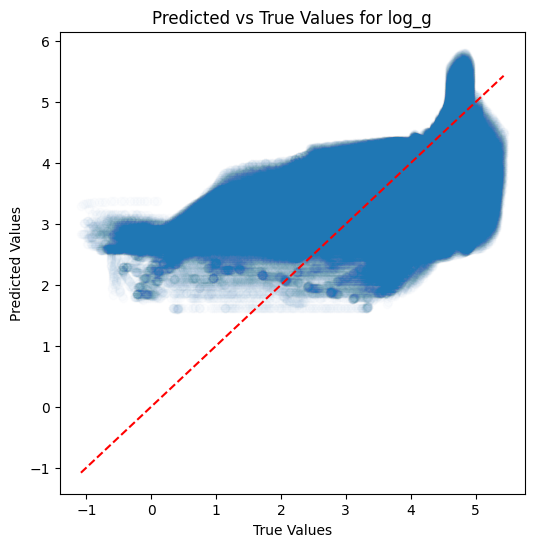

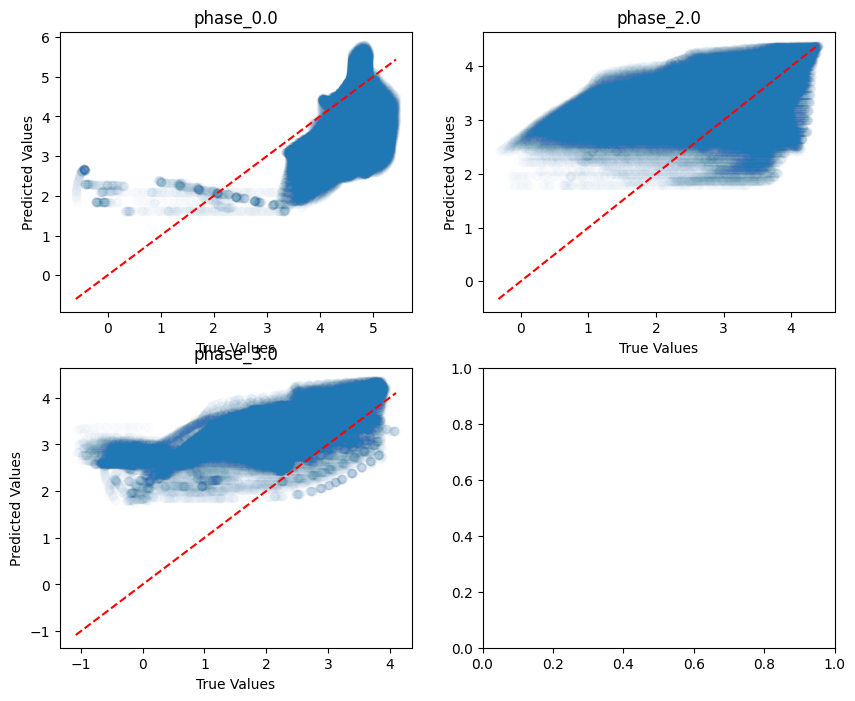

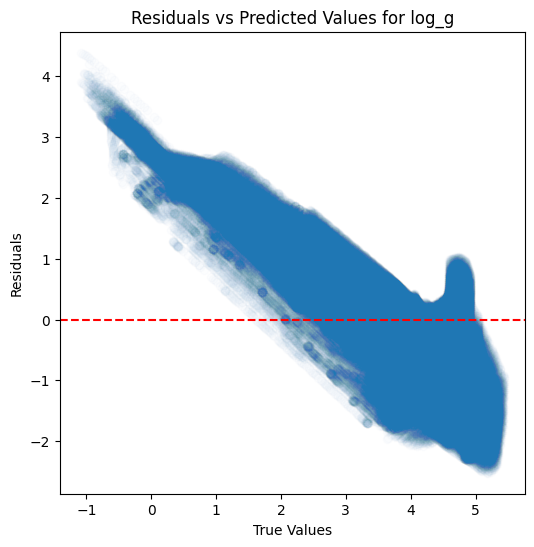

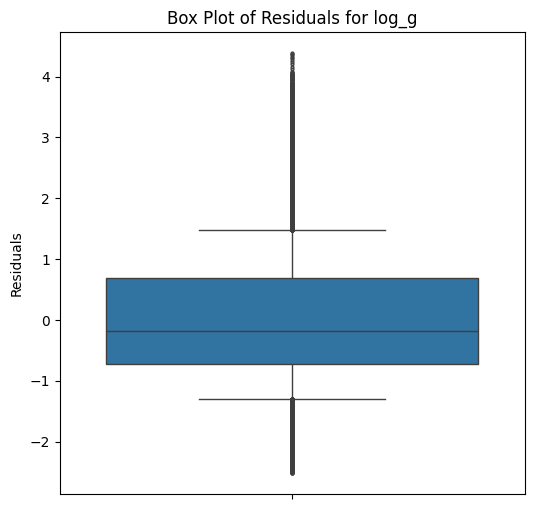

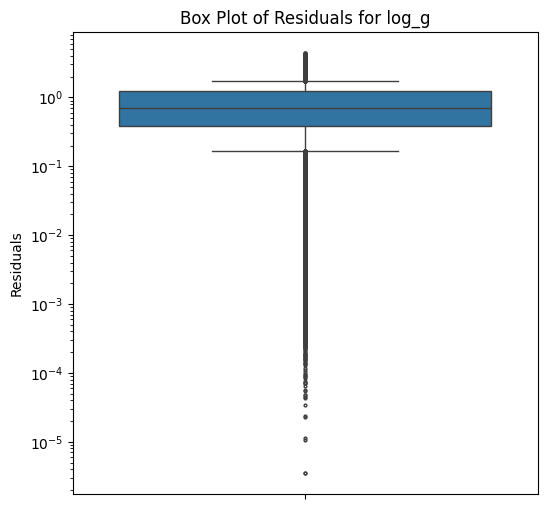

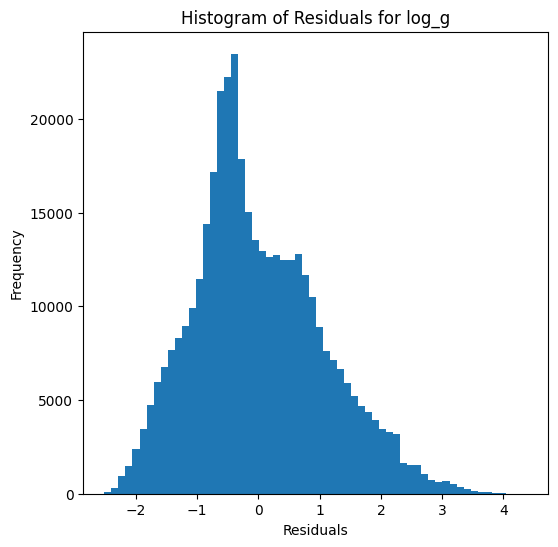

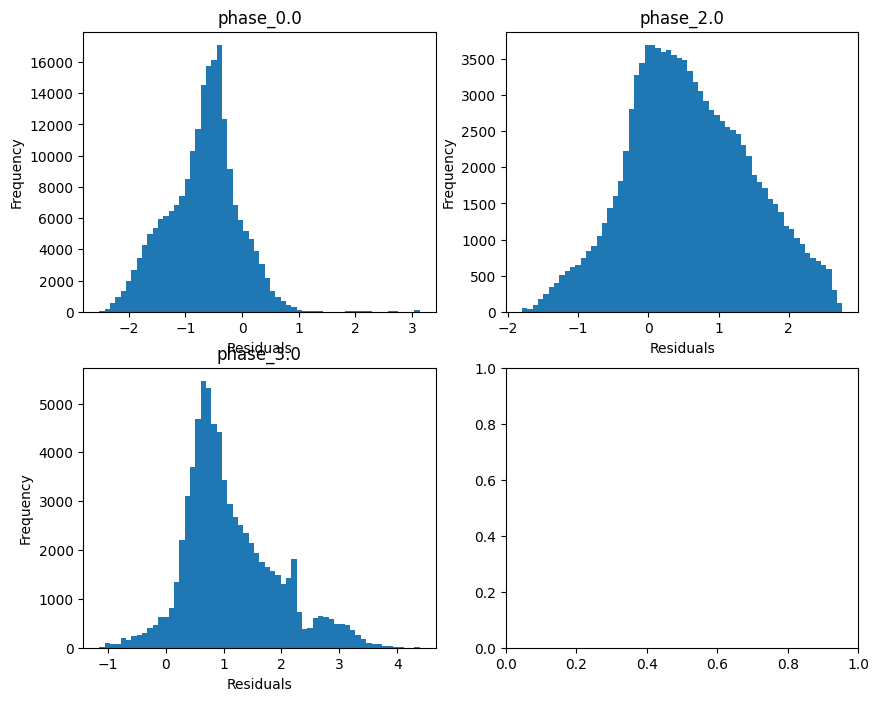

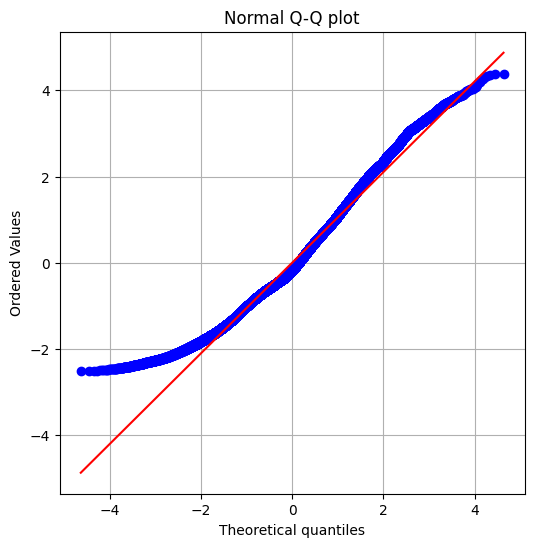

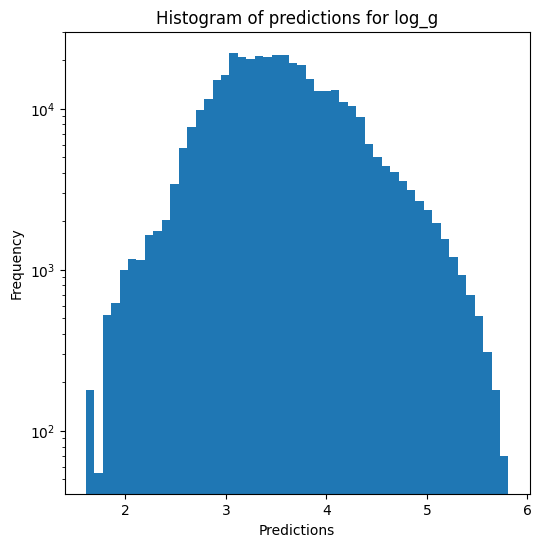

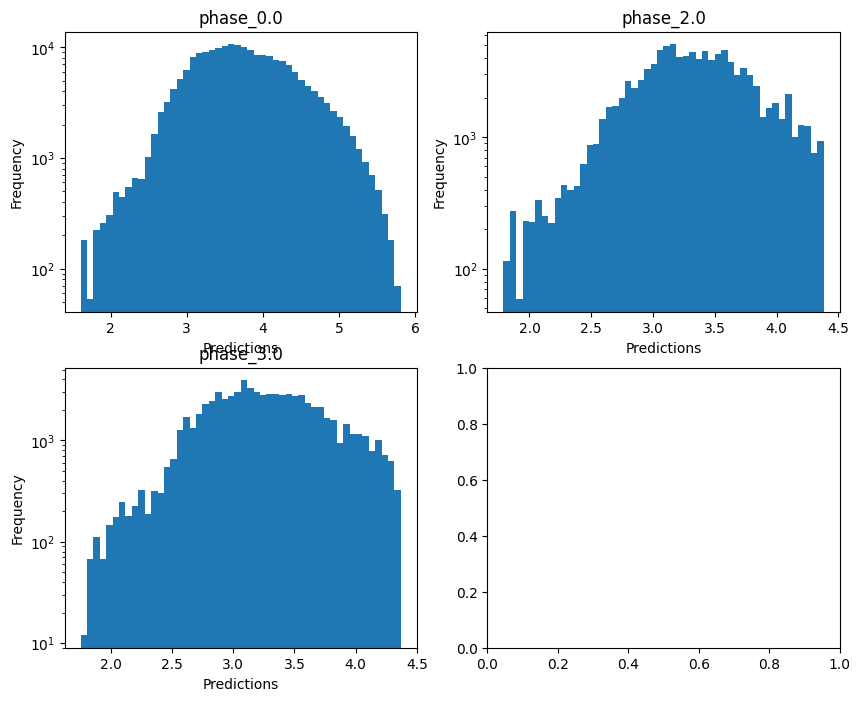


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.22469211359168928
  RMSE :  0.533991763855799
  MAE :  0.4147907438752489
  MedAE :  0.3093117031782123
  CORR :  0.5947013137402104
  MAX_ER :  1.678428520759245
  Percentiles : 
    75th percentile :  0.628780364835683
    90th percentile :  0.9266574756385142
    95th percentile :  1.08406630411735
    99th percentile :  1.3445139919490368

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.059961009862141035
  RMSE :  0.5647528895900393
  MAE :  0.45569229987341914
  MedAE :  0.39116932581827224
  CORR :  0.4195772079058465
  MAX_ER :  1.4086579713850993
  Percentiles : 
    75th percentile :  0.6853303345470114
    90th percentile :  0.9499009872918787
    95th percentile :  1.0988162621596302
    99th percentile :  1.2904790596903428

radius results for the phase category with a va

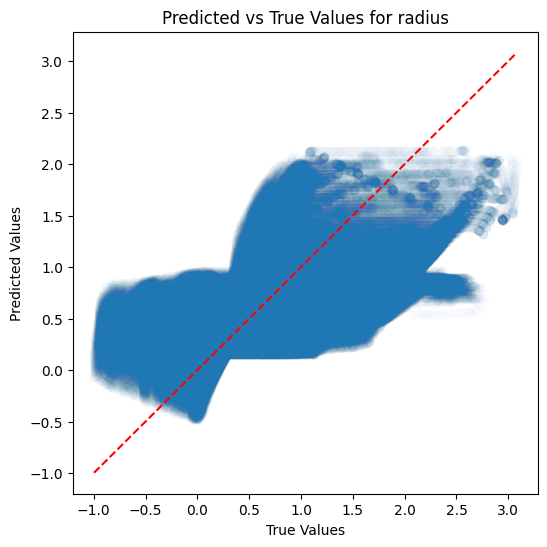

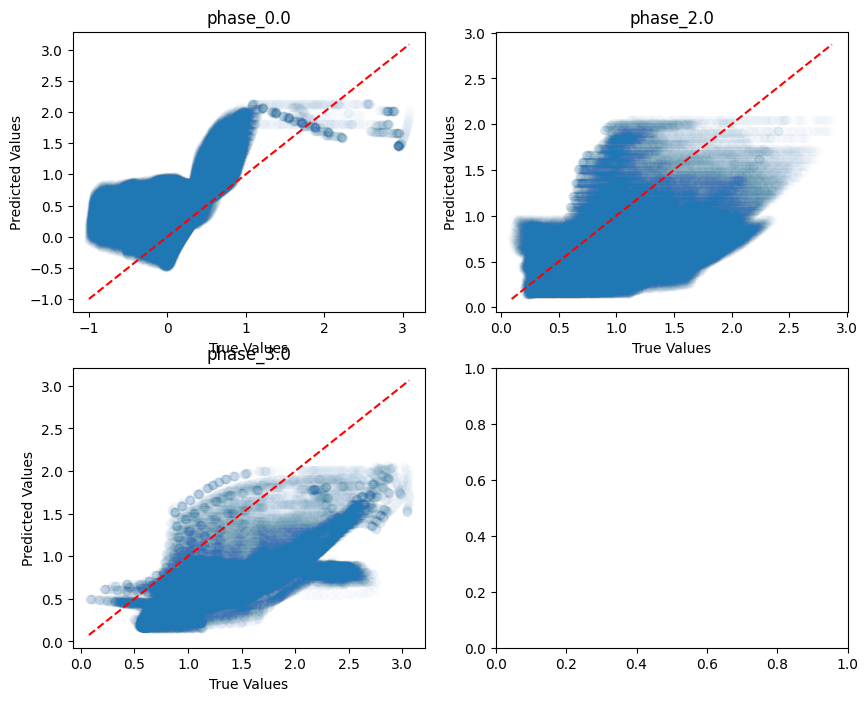

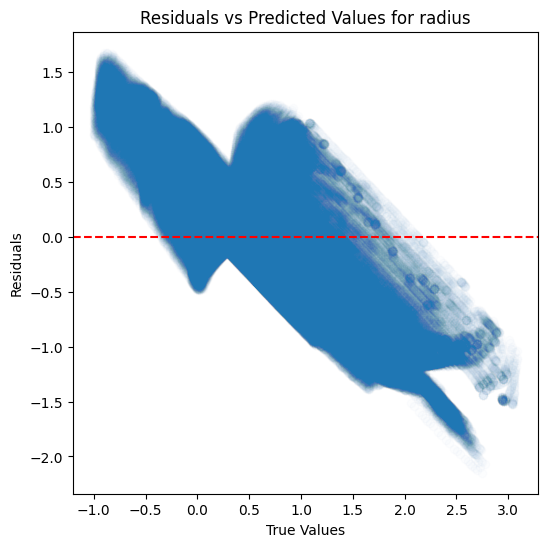

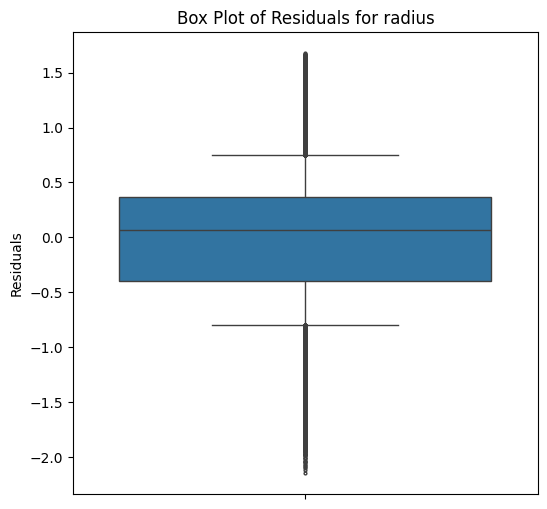

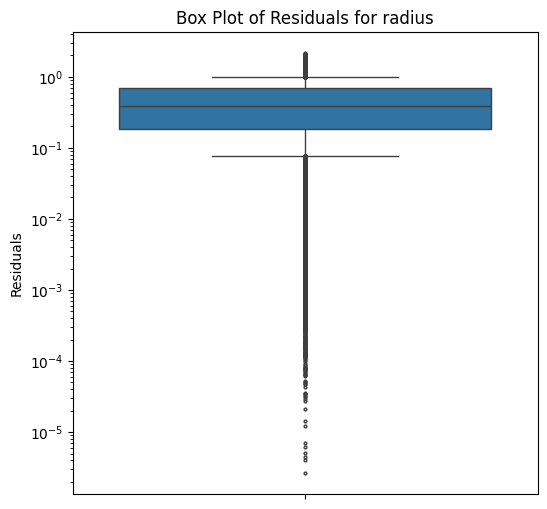

...

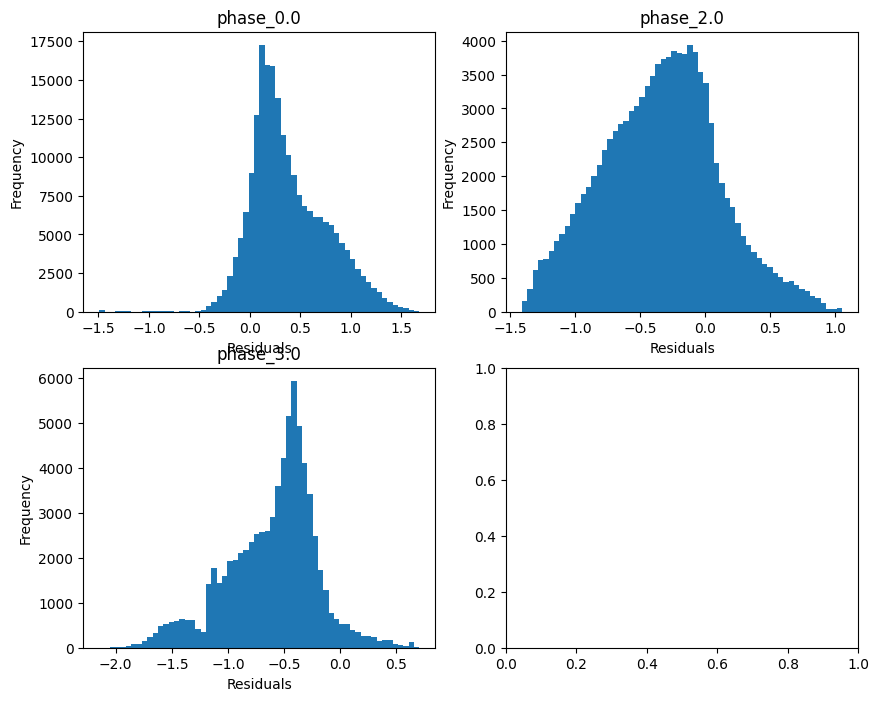

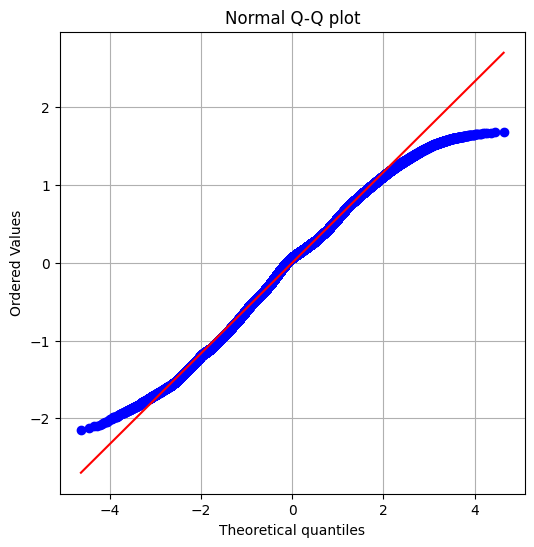

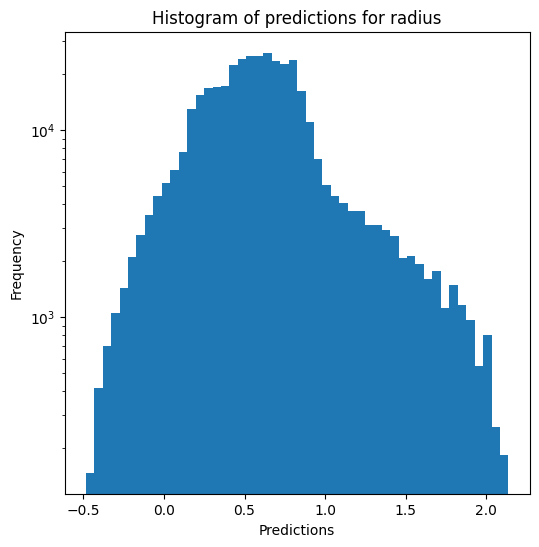

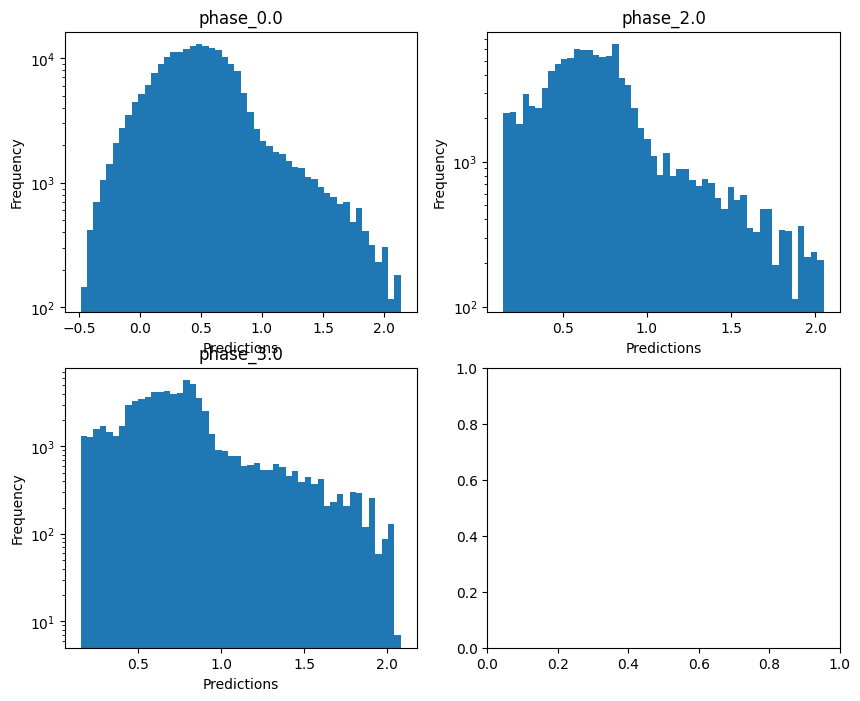

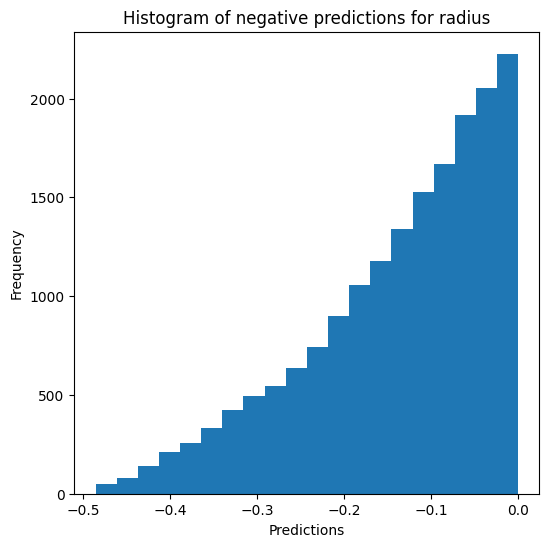

Saving predictions and results...


In [13]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show) # override=False, use_preds=True

### Decision tree

In [14]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9709861003655472
  RMSE :  0.05092038278952443
  MAE :  0.007022143569611827
  MedAE :  0.001017559950717839
  CORR :  0.9856973695816112
  MAX_ER :  0.9170521162841481
  Percentiles : 
    75th percentile :  0.002227784325176785
    90th percentile :  0.003986074355180414
    95th percentile :  0.00728678243183757
    99th percentile :  0.1945712253358436

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9289015548502558
  RMSE :  0.06550062570134839
  MAE :  0.026735508628631603
  MedAE :  0.003703973033716501
  CORR :  0.9641799379657123
  MAX_ER :  0.8297717313302497
  Percentiles : 
    75th percentile :  0.014503692629853626
    90th percentile :  0.0938191664918

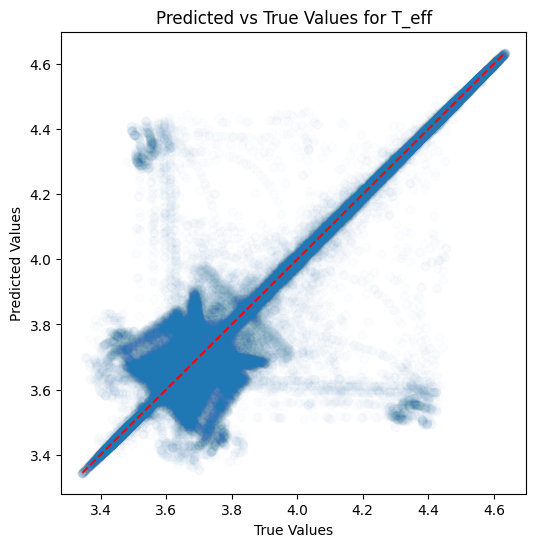

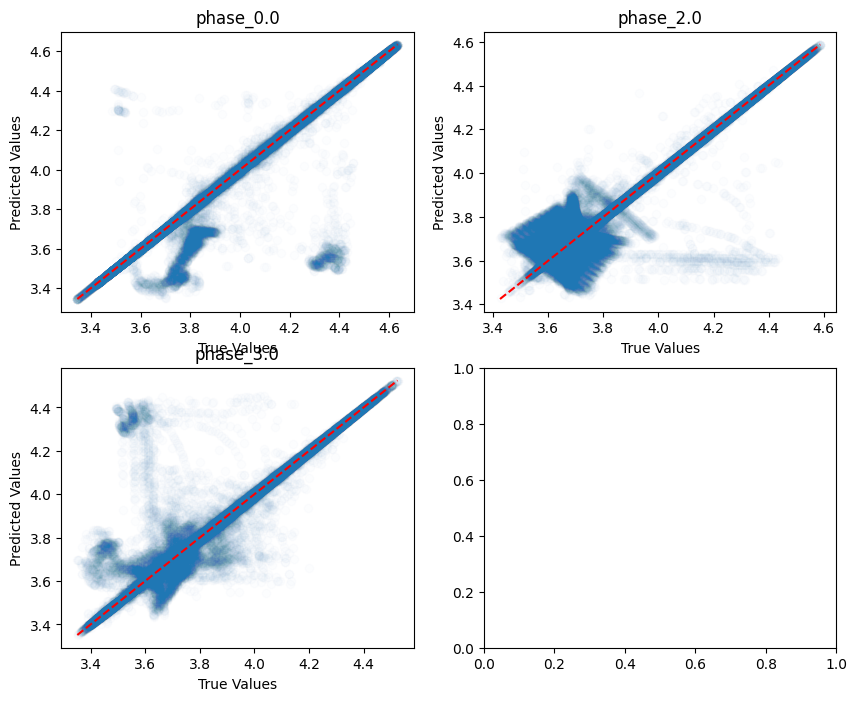

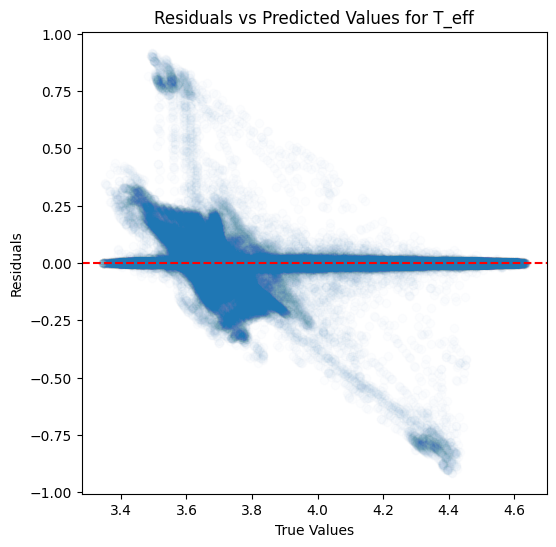

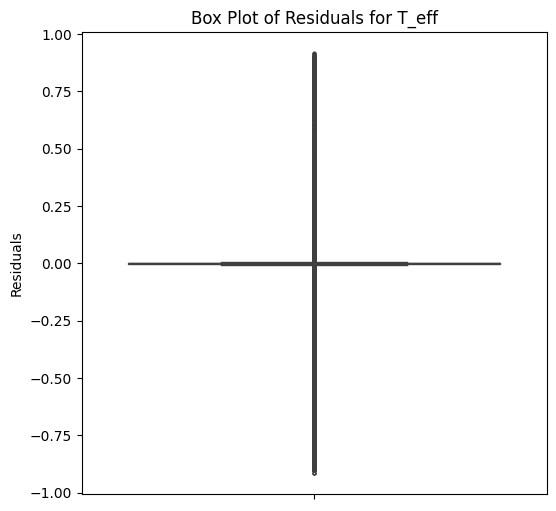

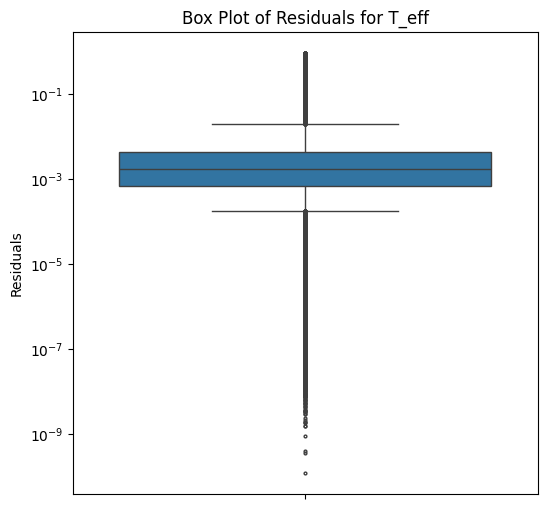

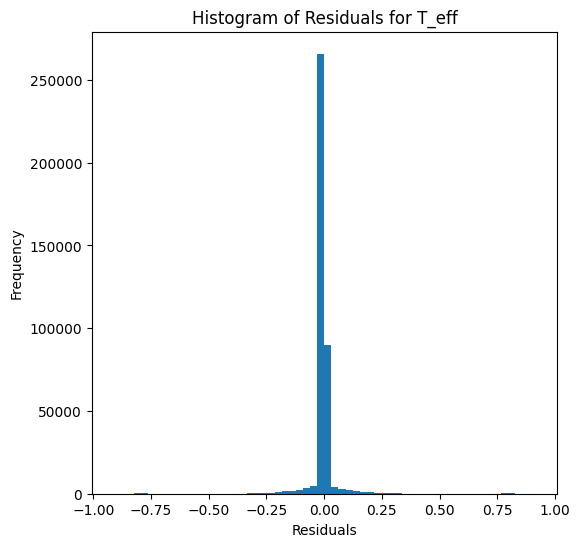

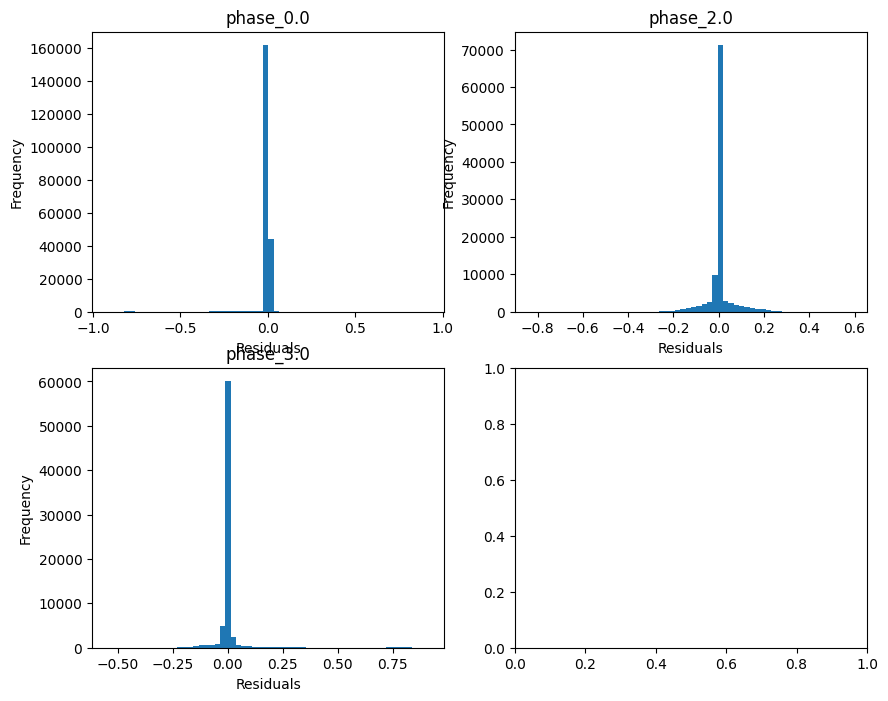

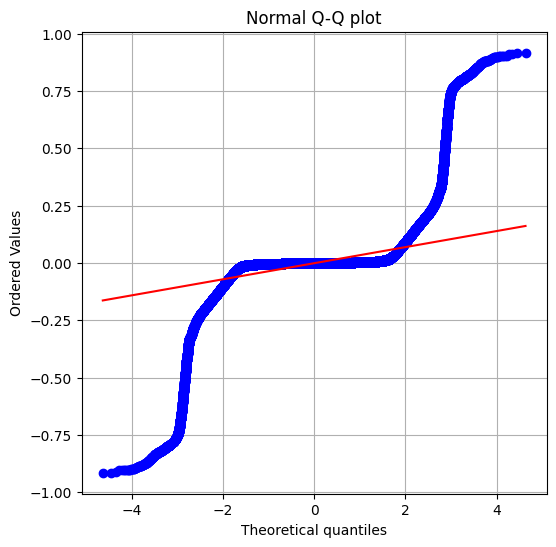

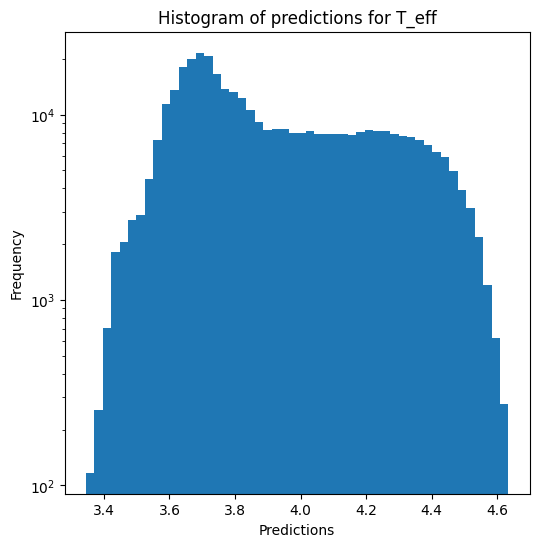

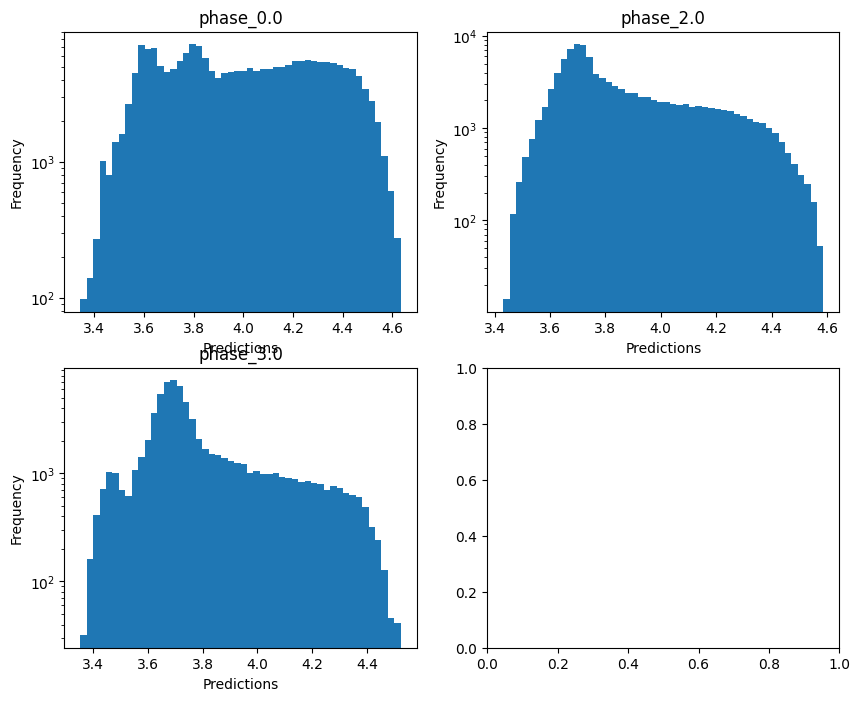


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.05701950107399145
  RMSE :  0.44562165261076275
  MAE :  0.05976761887243708
  MedAE :  0.0036214348294798526
  CORR :  0.7393021475013991
  MAX_ER :  5.693303843114662
  Percentiles : 
    75th percentile :  0.0072121252551333725
    90th percentile :  0.012584296353035825
    95th percentile :  0.021322920104138353
    99th percentile :  3.1796524520646927

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  -0.03513855644318564
  RMSE :  0.9440560771465998
  MAE :  0.41928930728422104
  MedAE :  0.018277350198006248
  CORR :  0.47974864175030285
  MAX_ER :  4.637418133429539
  Percentiles : 
    75th percentile :  0.24622736730403416
    90th percentile :  1.7546520826805794
    95th percentile :  2.5259281392258046
    99th percentile :  3.541556862920444

log_g results for the phase cat

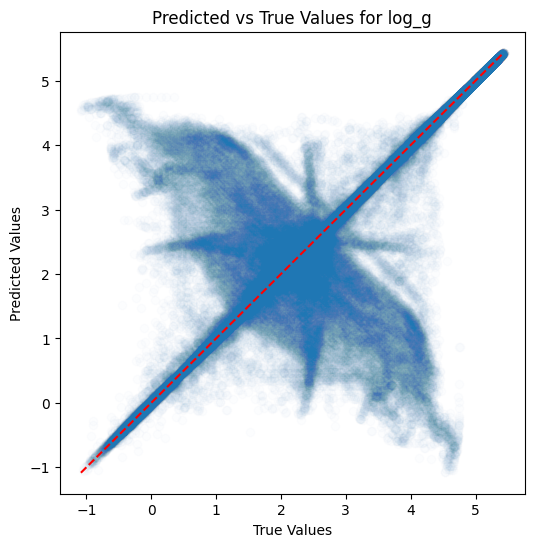

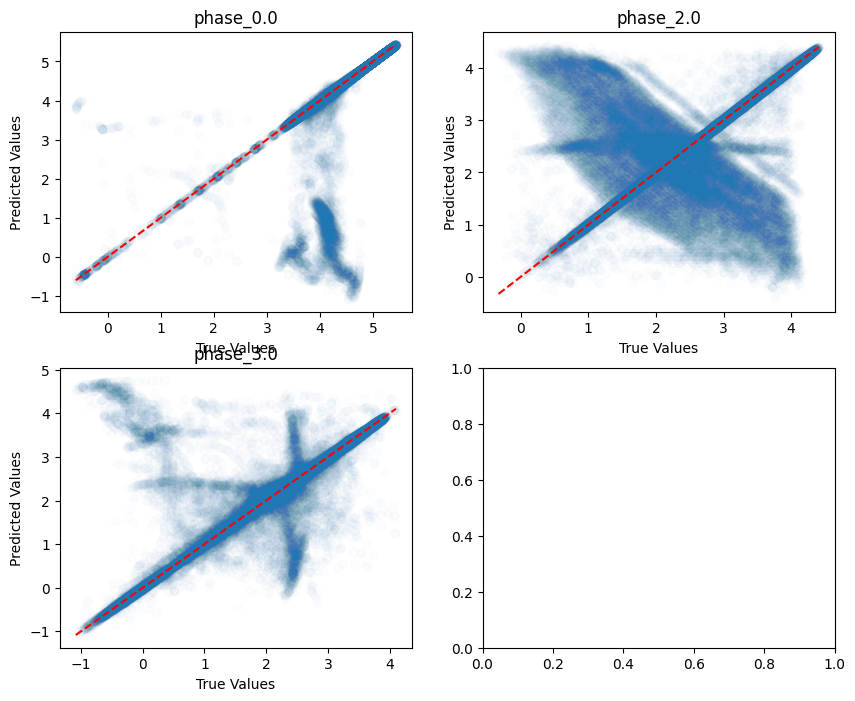

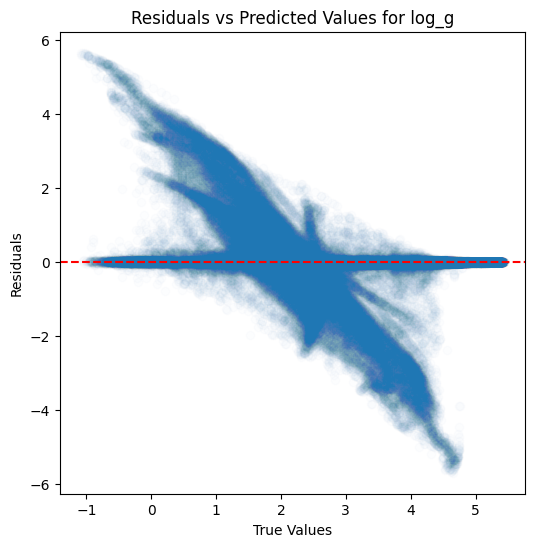

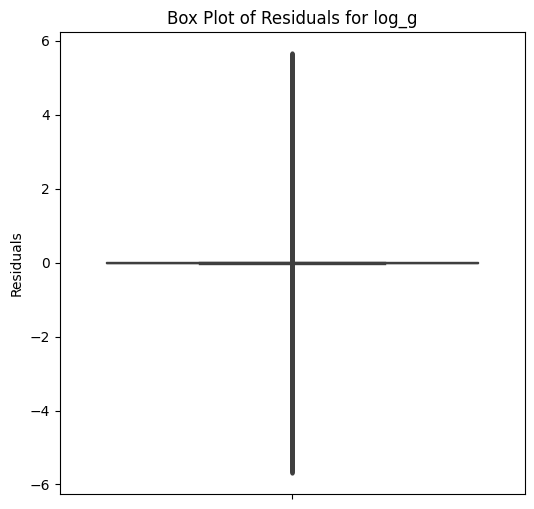

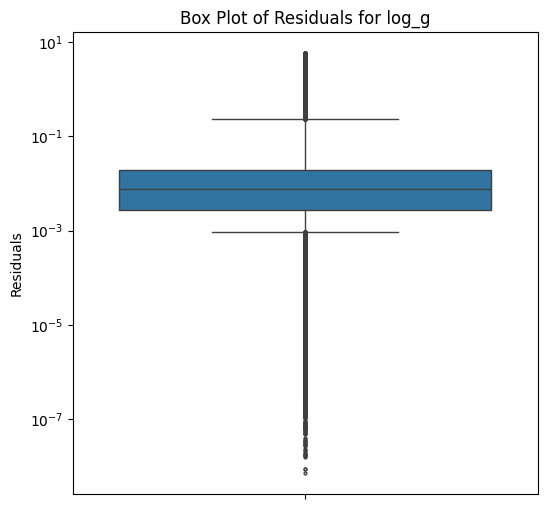

...

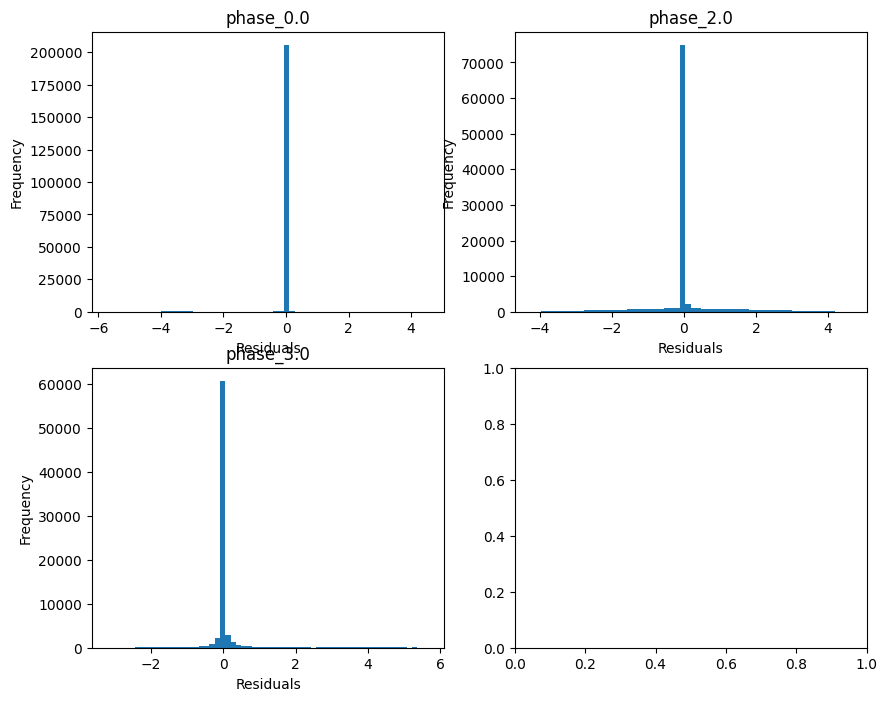

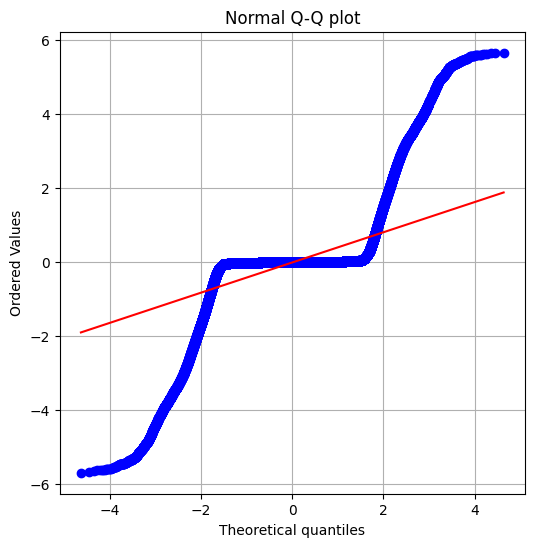

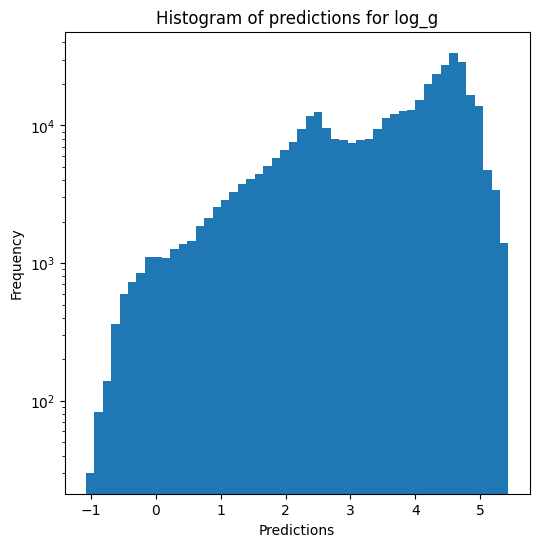

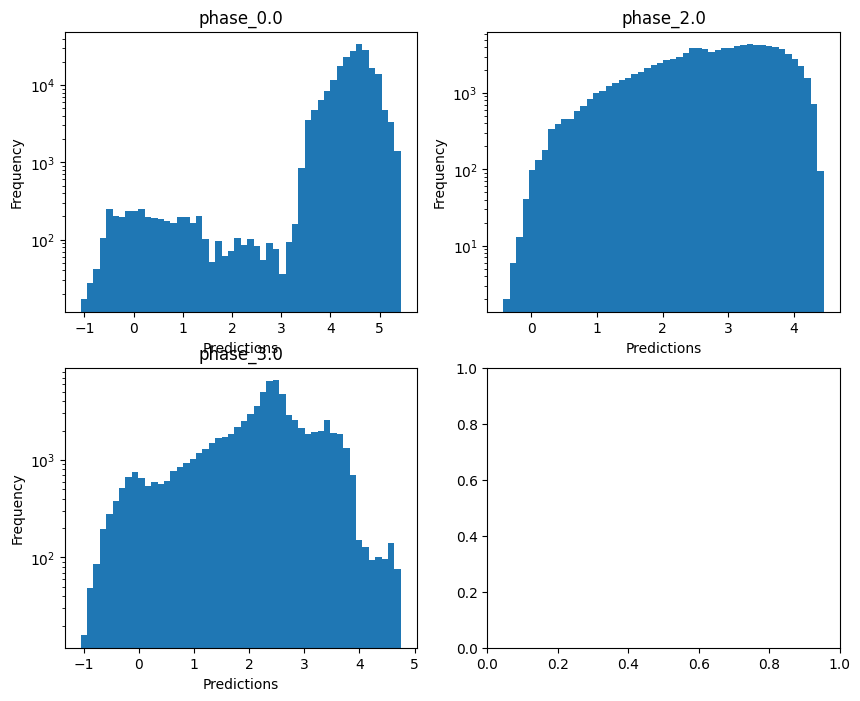

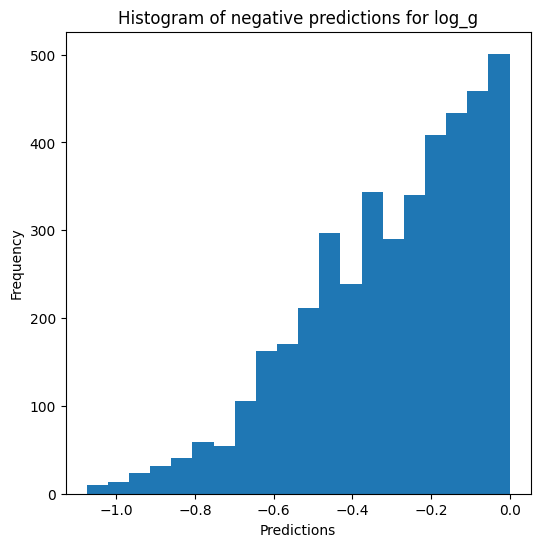


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.7239370774639855
  RMSE :  0.22283905380501354
  MAE :  0.030590809422708542
  MedAE :  0.002486269488446907
  CORR :  0.887290831162512
  MAX_ER :  2.84673517851732
  Percentiles : 
    75th percentile :  0.004660489512854027
    90th percentile :  0.007996331342267416
    95th percentile :  0.012283428773171833
    99th percentile :  1.5896411876166865

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  -0.028543113399956743
  RMSE :  0.4720179436930682
  MAE :  0.2096514509045529
  MedAE :  0.009153126821982327
  CORR :  0.4980870599144762
  MAX_ER :  2.3190299467163435
  Percentiles : 
    75th percentile :  0.1231278861870444
    90th percentile :  0.8772524007065419
    95th percentile :  1.2628760031505442
    99th percentile :  1.770740373407309

radius results for the phase catego

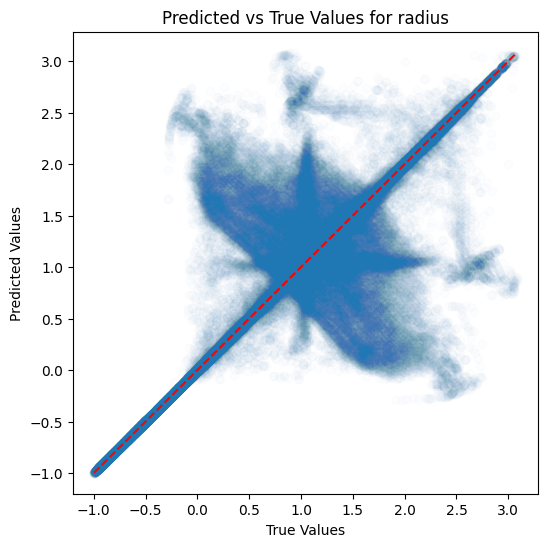

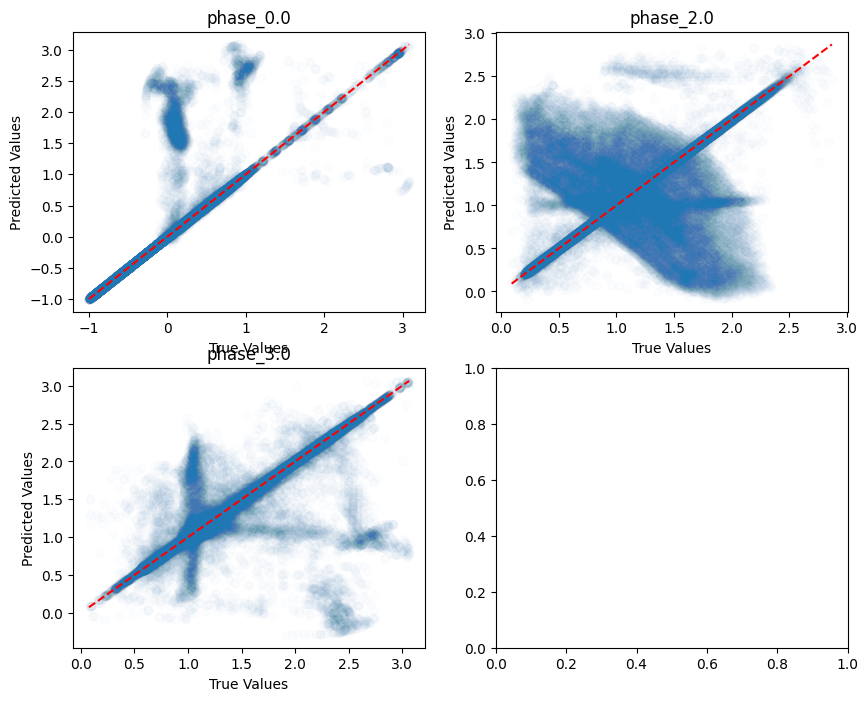

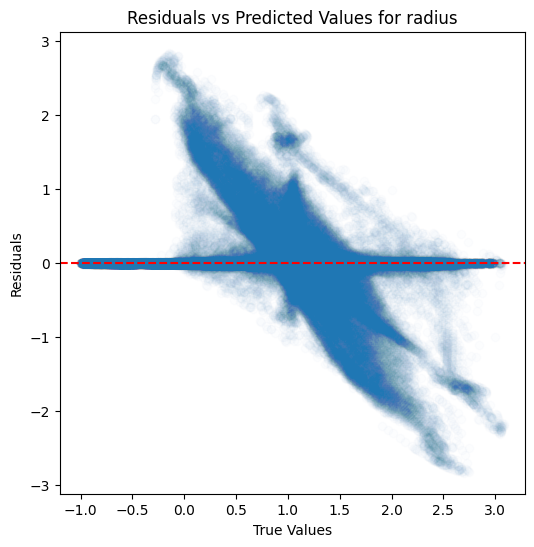

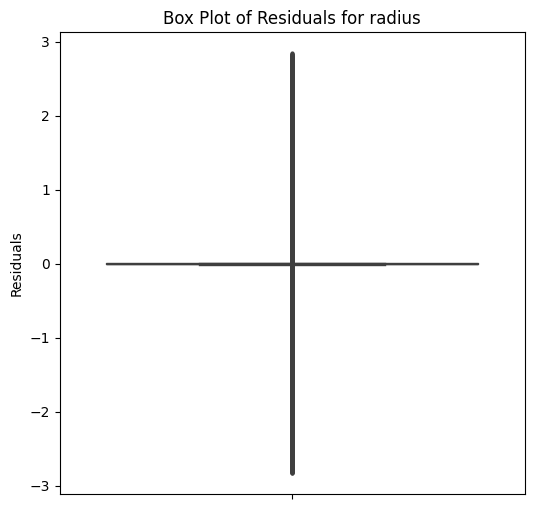

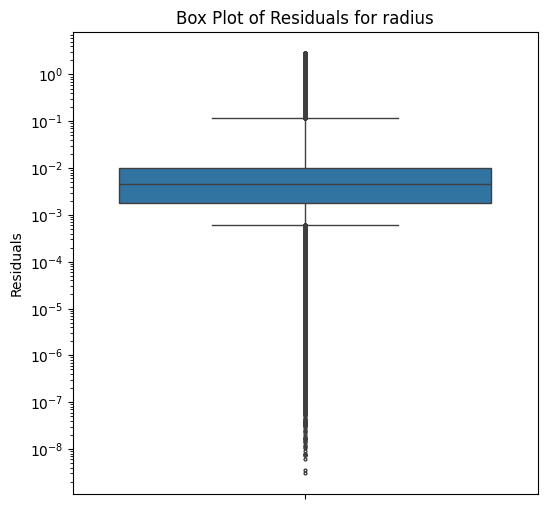

...

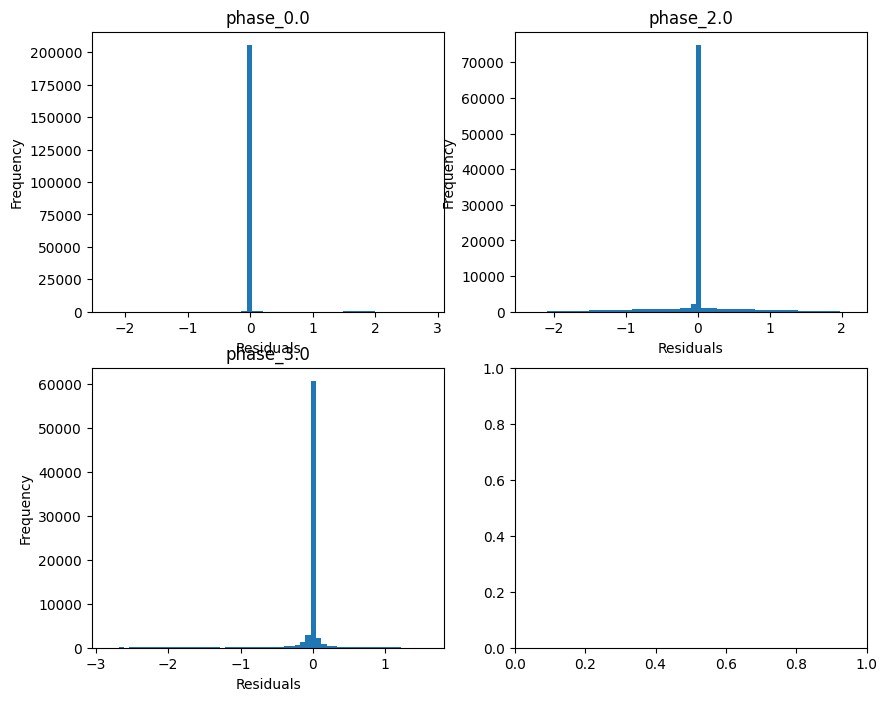

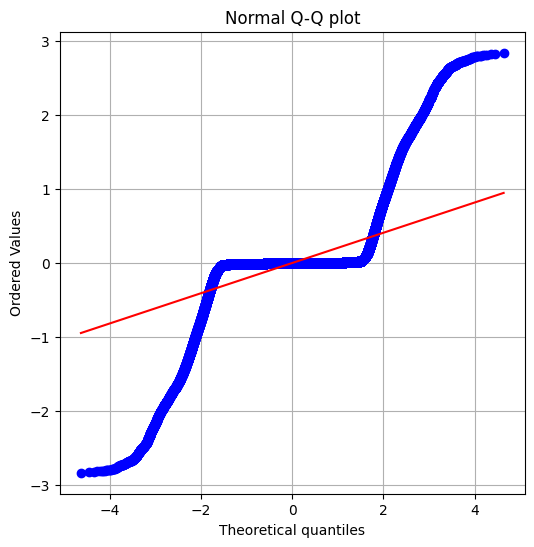

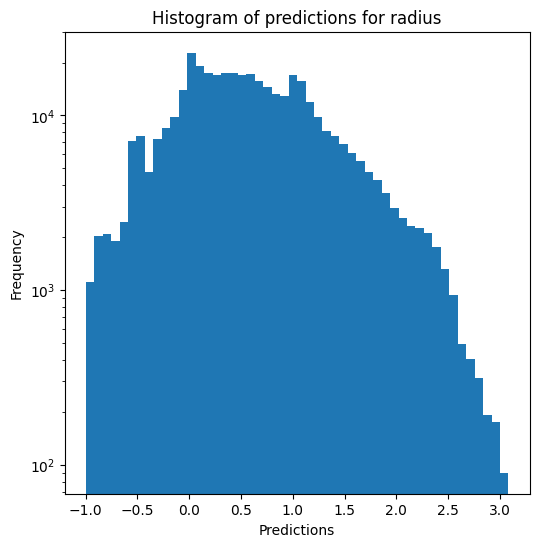

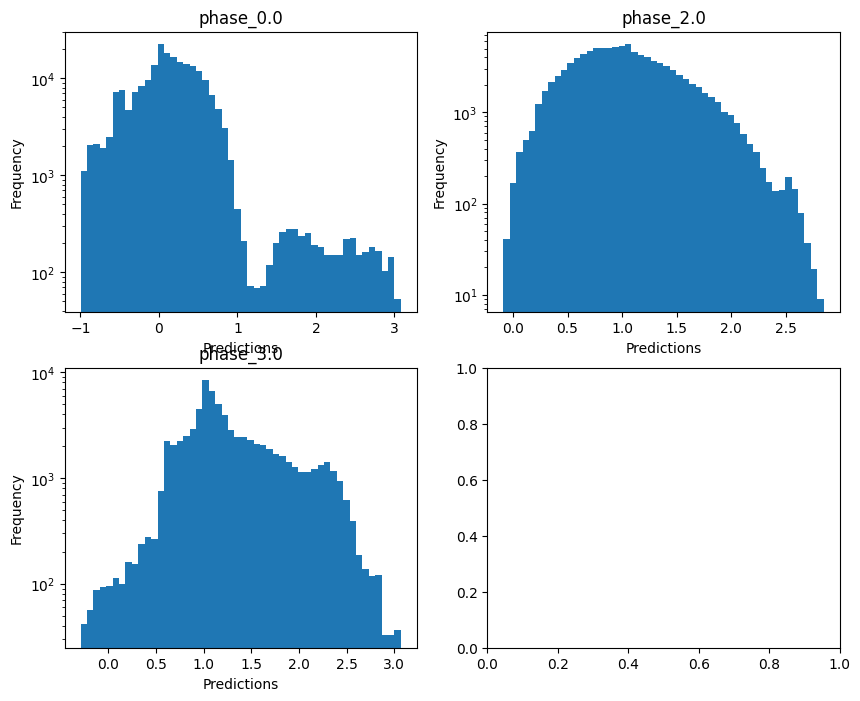

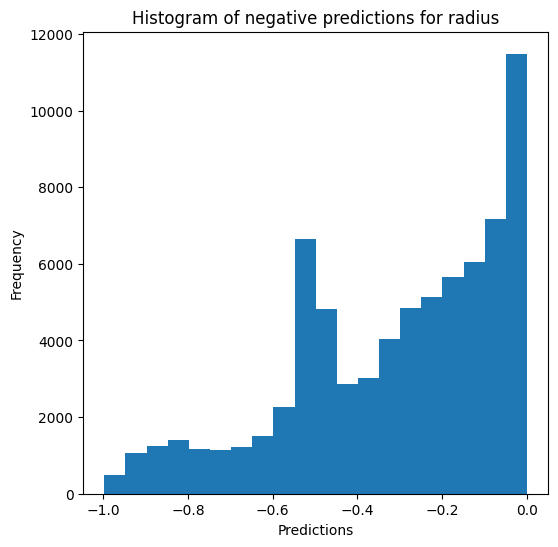

Saving predictions and results...


In [15]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### K-nearest neighbours

In [16]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9813451600588748
  RMSE :  0.040990946236110756
  MAE :  0.00714522269113986
  MedAE :  0.000981213927034652
  CORR :  0.99066302973902
  MAX_ER :  0.8858168570492055
  Percentiles : 
    75th percentile :  0.002326222920627785
    90th percentile :  0.005309557262662068
    95th percentile :  0.010504864583828238
    99th percentile :  0.15691844839826094

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9724161793517285
  RMSE :  0.040805846938456077
  MAE :  0.01829742957066378
  MedAE :  0.0026645875083213255
  CORR :  0.9861270504699984
  MAX_ER :  0.6260565282565982
  Percentiles : 
    75th percentile :  0.015498387502951183
    90th percentile :  0.062080064842

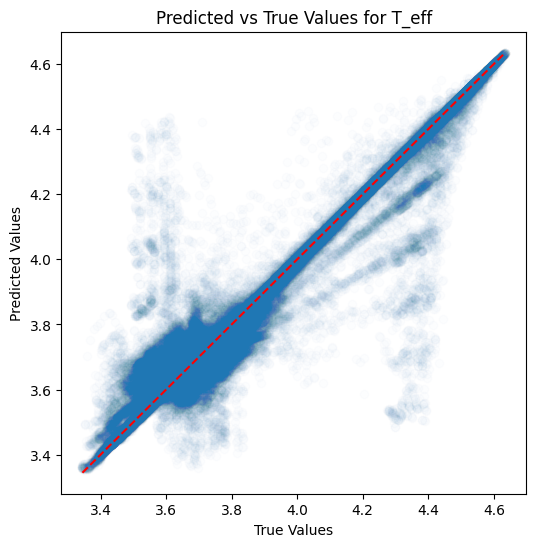

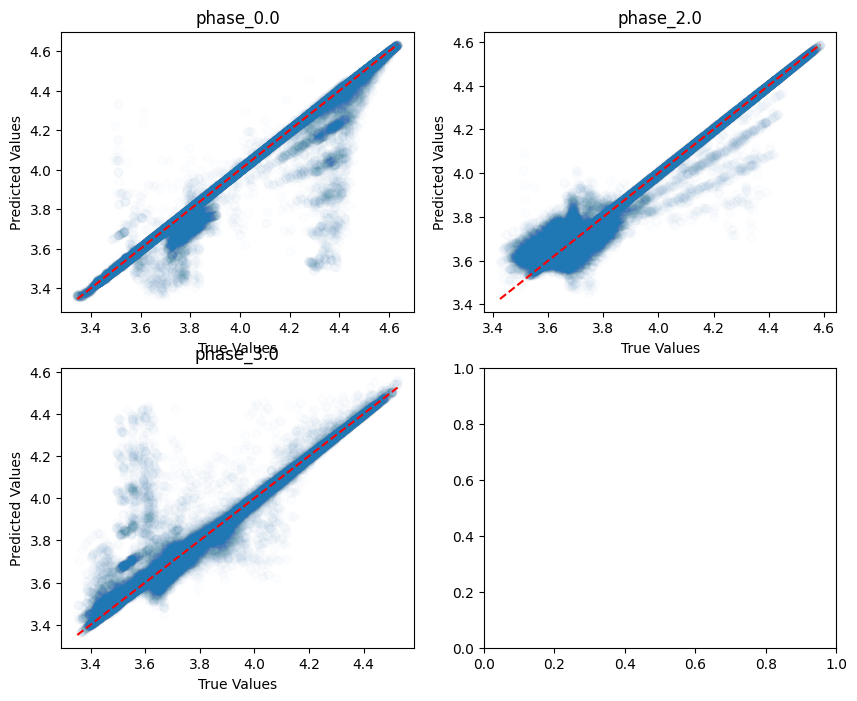

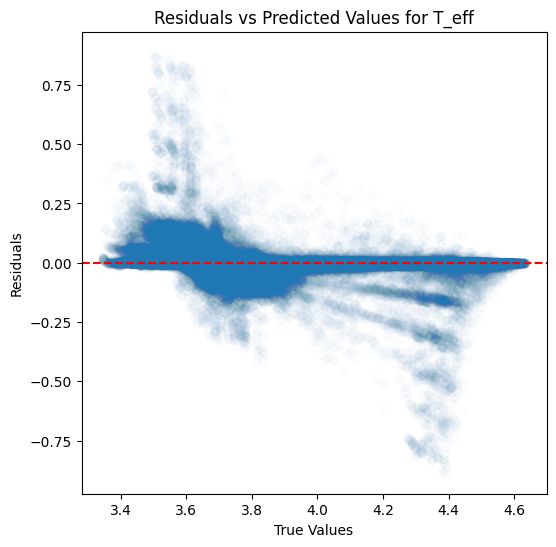

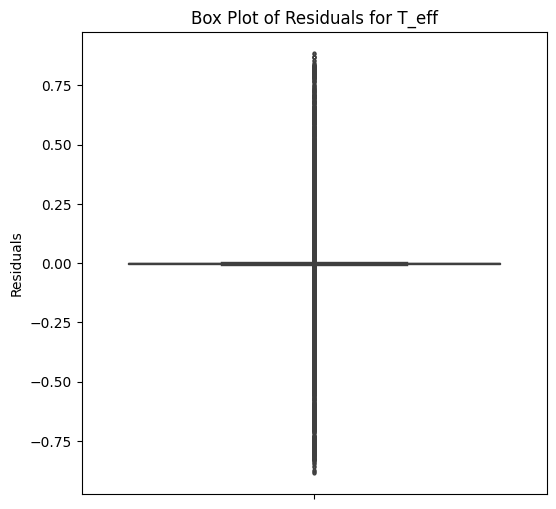

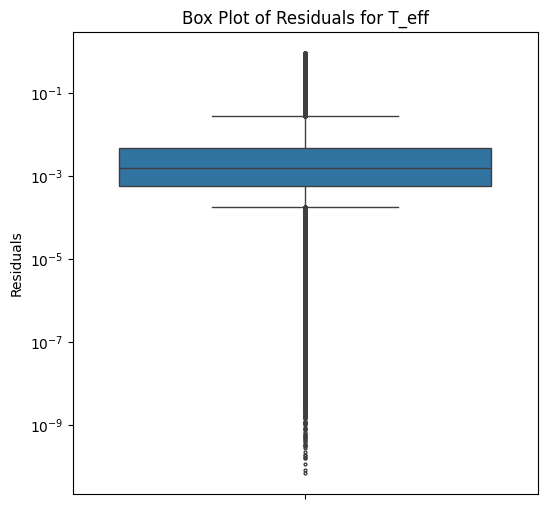

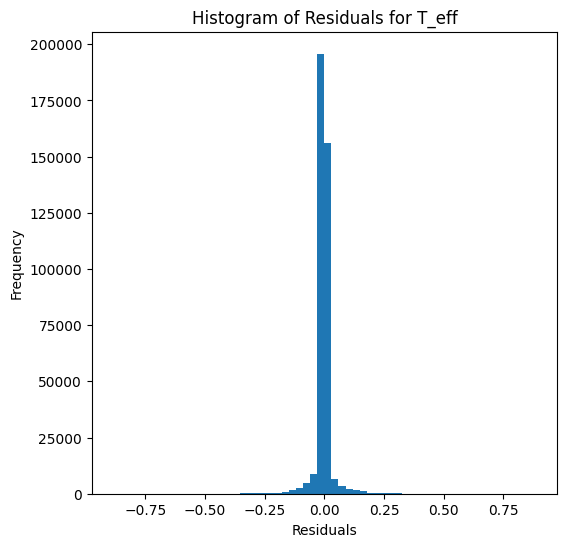

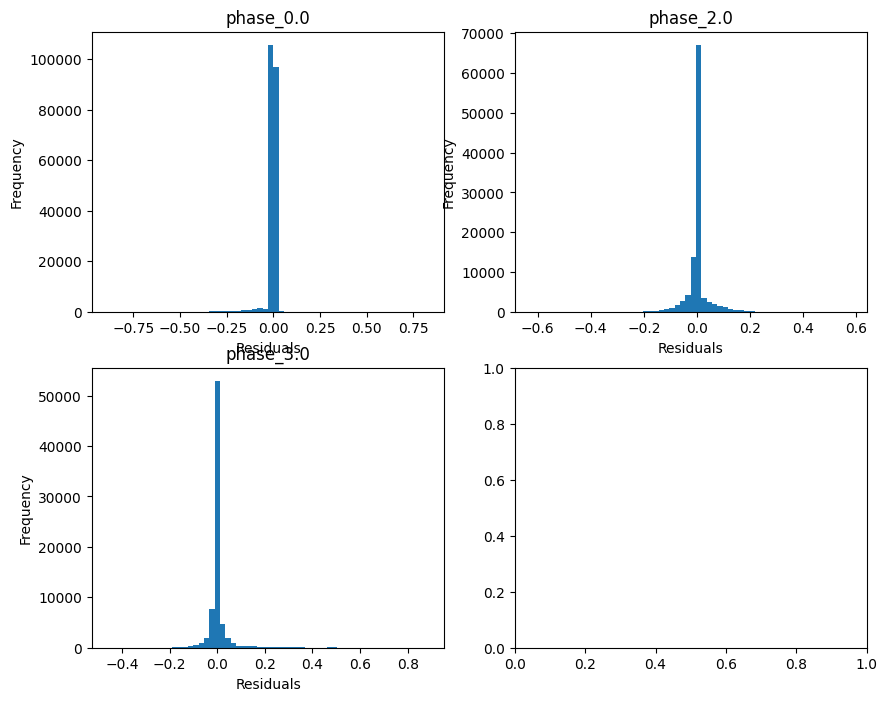

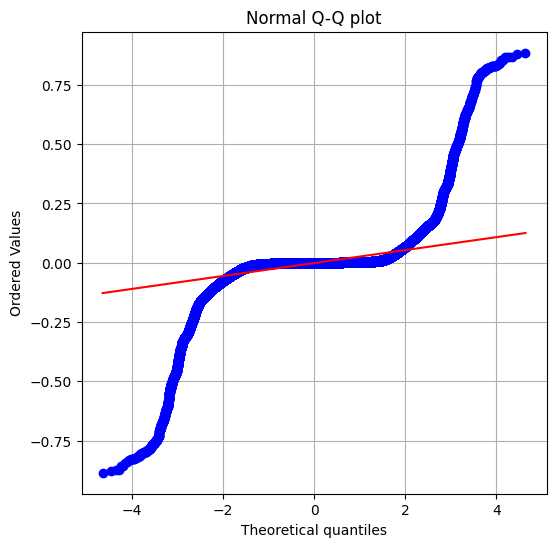

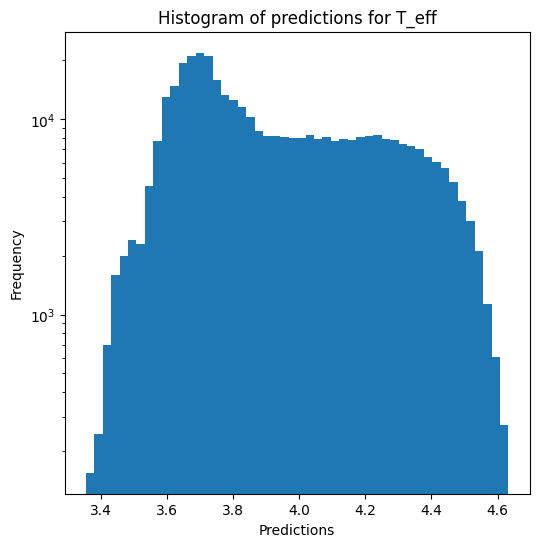

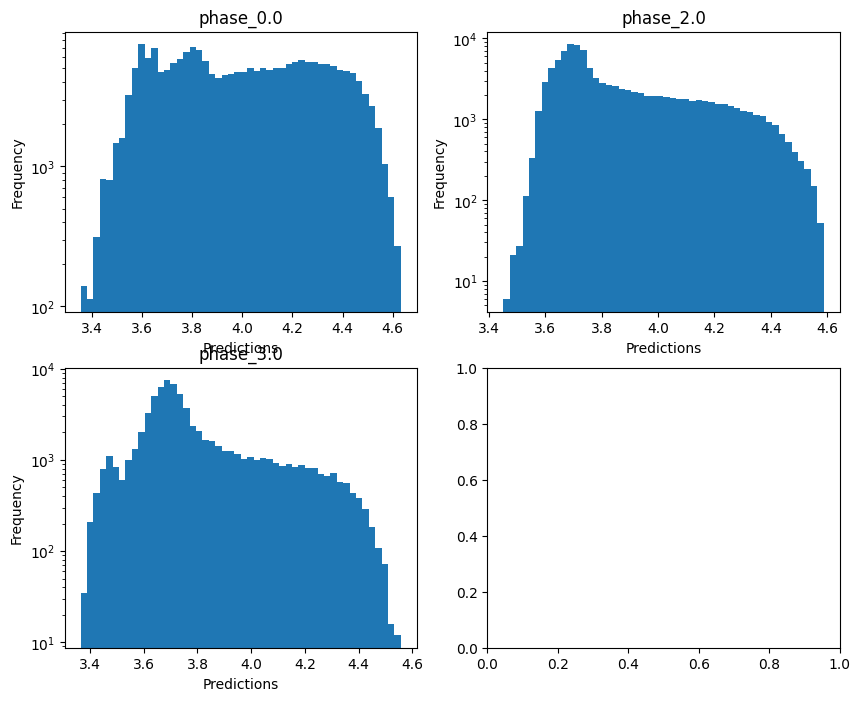


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.48608619995224744
  RMSE :  0.3305642585173287
  MAE :  0.055842974398197034
  MedAE :  0.0025364091594557436
  CORR :  0.8323450479359569
  MAX_ER :  5.545795164845766
  Percentiles : 
    75th percentile :  0.006465165495495917
    90th percentile :  0.01849958738310403
    95th percentile :  0.06079812439916964
    99th percentile :  1.7805271282809847

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.5303123075394265
  RMSE :  0.6362343410520687
  MAE :  0.2939358566022489
  MedAE :  0.013088125859807676
  CORR :  0.7349547949015152
  MAX_ER :  4.330710890208363
  Percentiles : 
    75th percentile :  0.3127716402235827
    90th percentile :  1.126167359044974
    95th percentile :  1.5957279774559137
    99th percentile :  2.4083538429144684

log_g results for the phase category wi

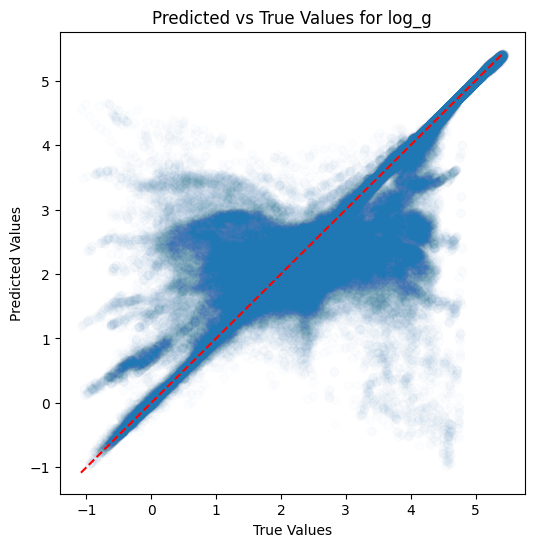

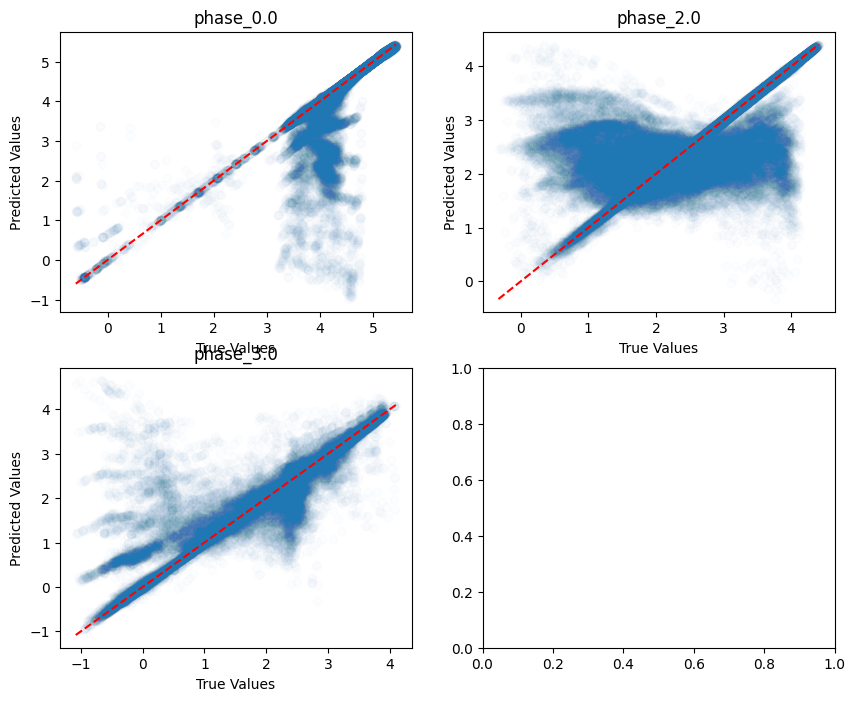

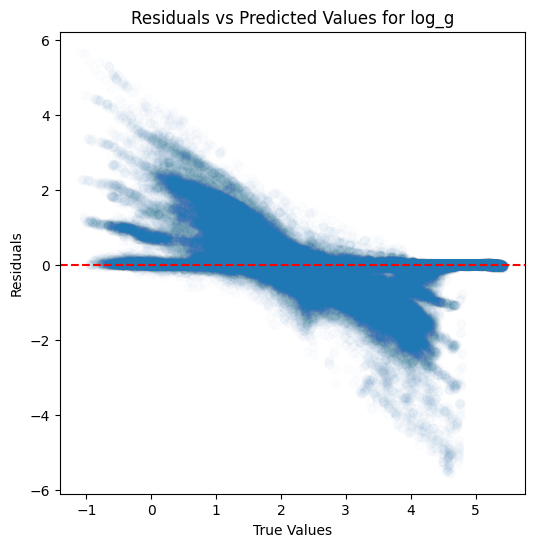

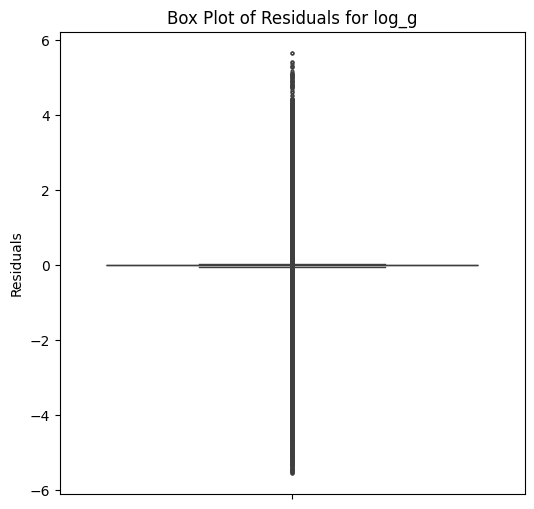

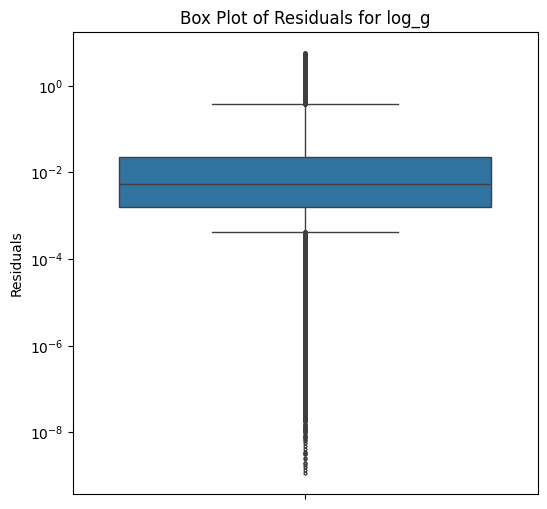

...

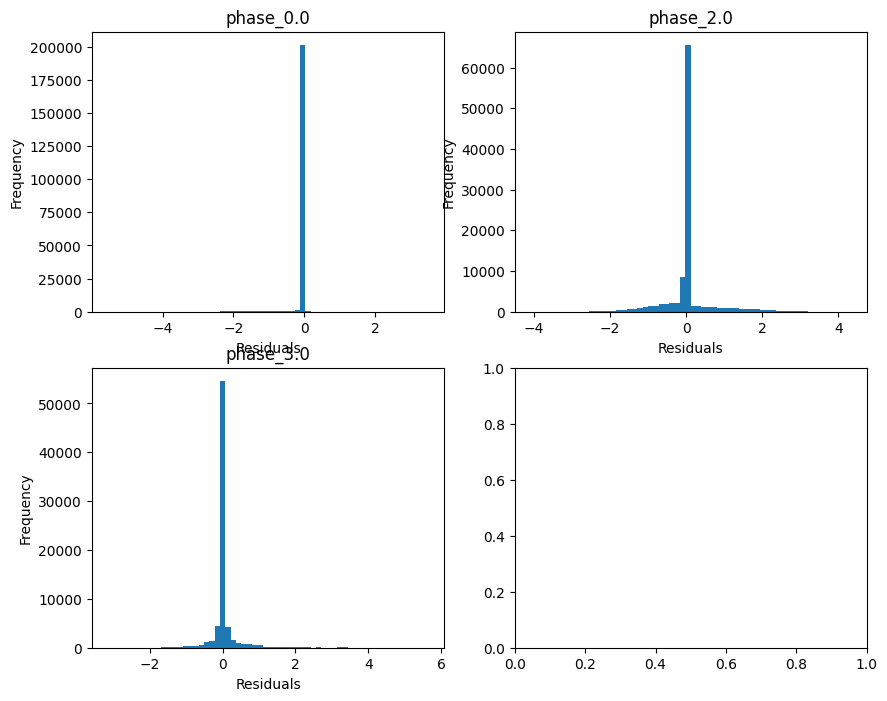

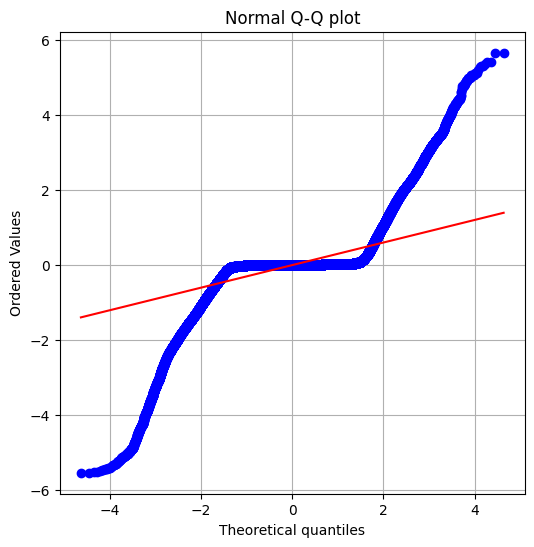

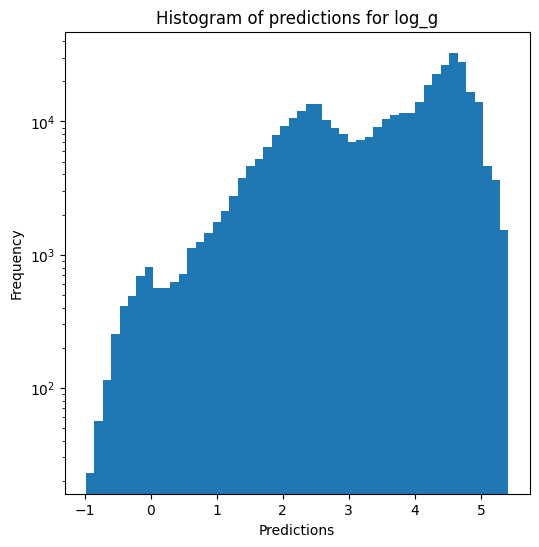

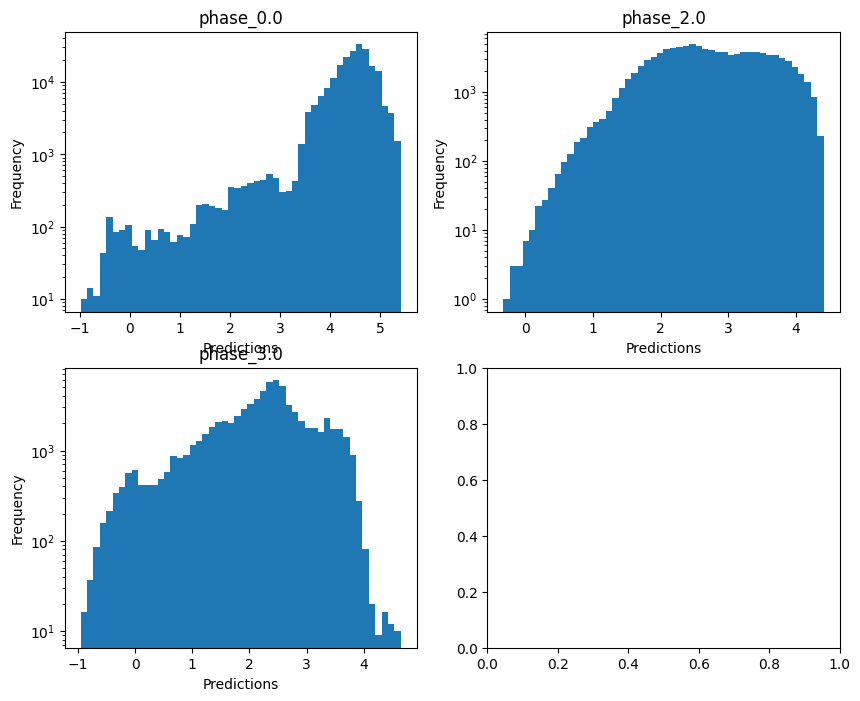

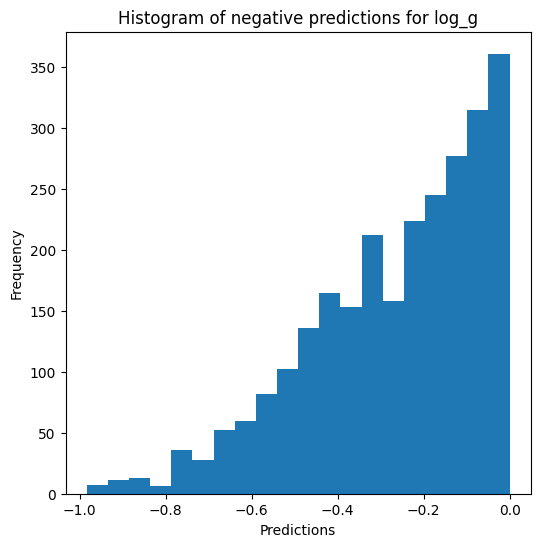


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.849444000345548
  RMSE :  0.16535880582706572
  MAE :  0.029012358123864233
  MedAE :  0.0019278176565965532
  CORR :  0.9351653848778183
  MAX_ER :  2.774405485576776
  Percentiles : 
    75th percentile :  0.0048141427134077985
    90th percentile :  0.013558971663187694
    95th percentile :  0.03512865590977154
    99th percentile :  0.8900403709831819

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.5333019304174877
  RMSE :  0.3181112925136617
  MAE :  0.14697227306789126
  MedAE :  0.006558192996225398
  CORR :  0.7405883337799539
  MAX_ER :  2.16546836611197
  Percentiles : 
    75th percentile :  0.15639653669980128
    90th percentile :  0.5631670973370123
    95th percentile :  0.7979243566625472
    99th percentile :  1.204295821027935

radius results for the phase categor

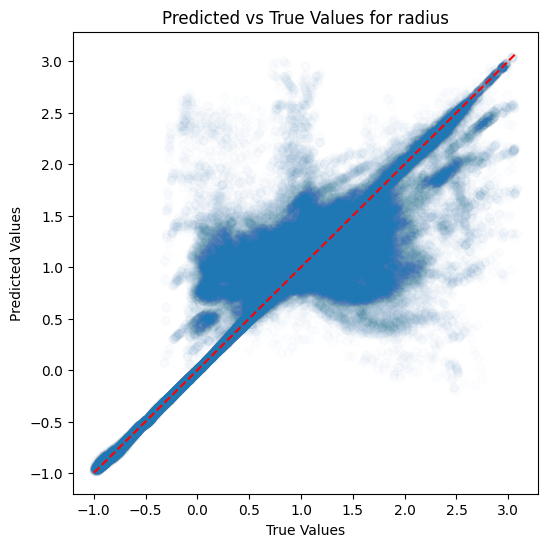

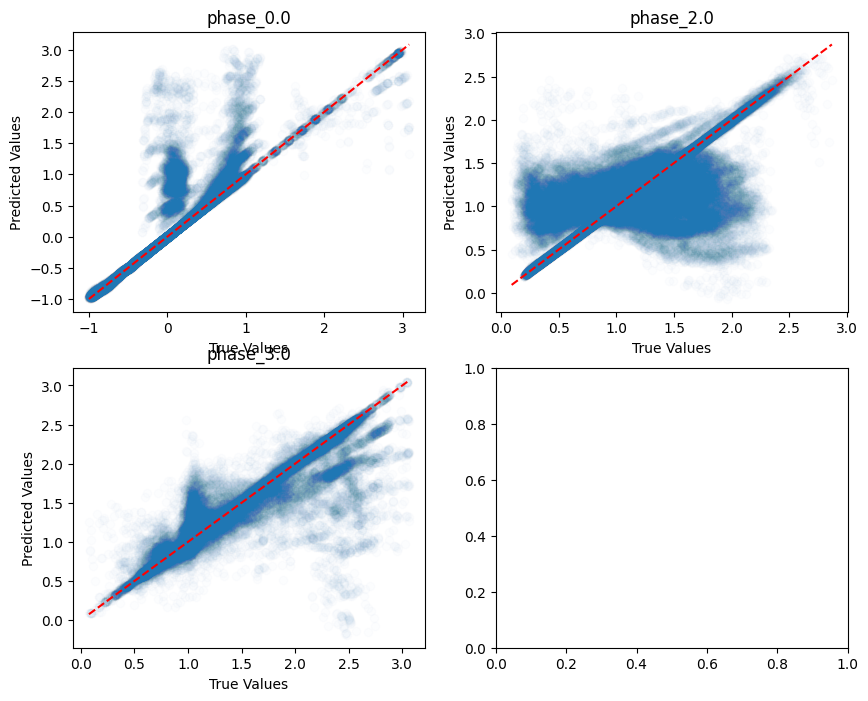

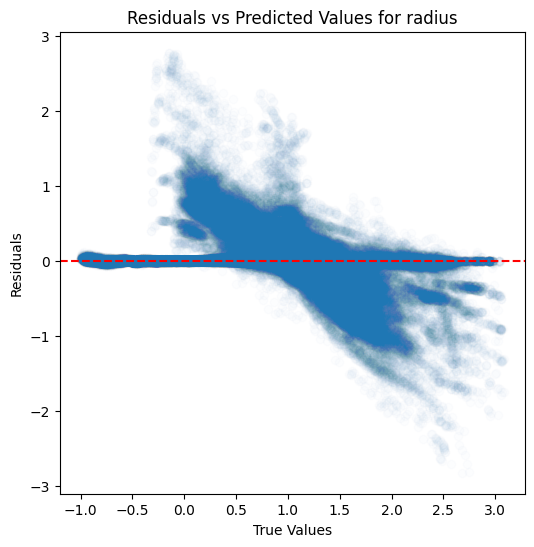

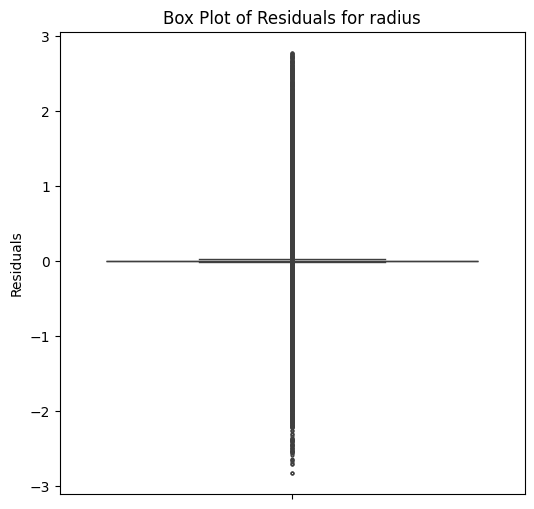

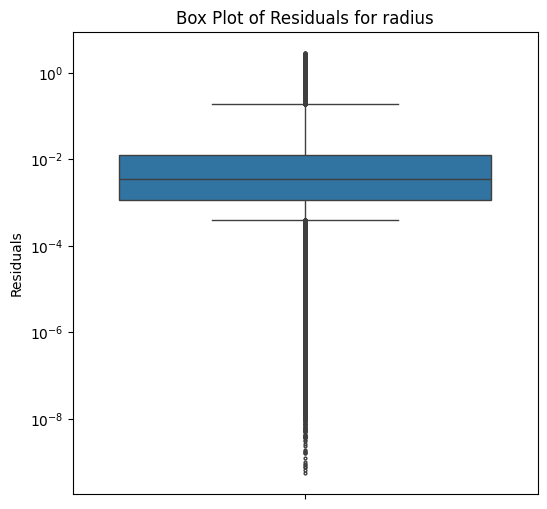

...

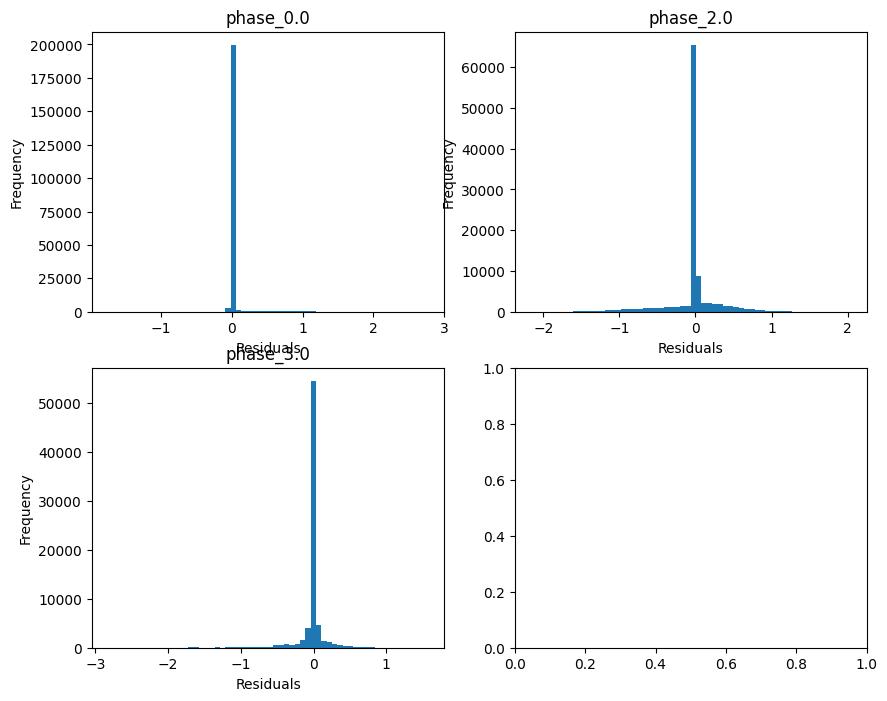

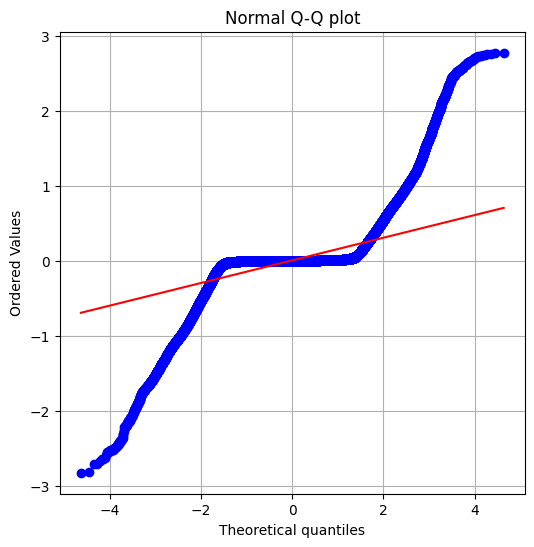

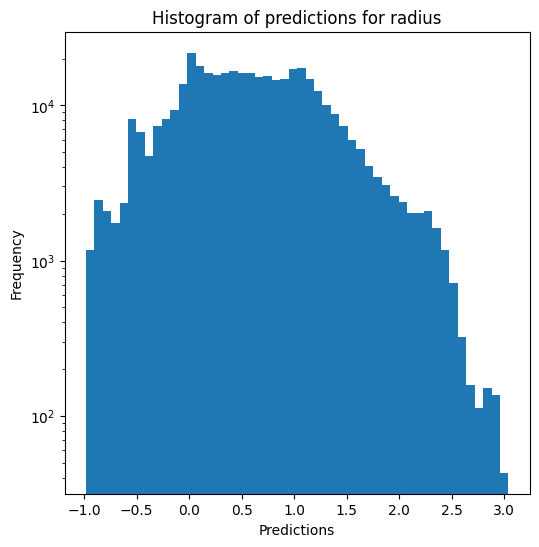

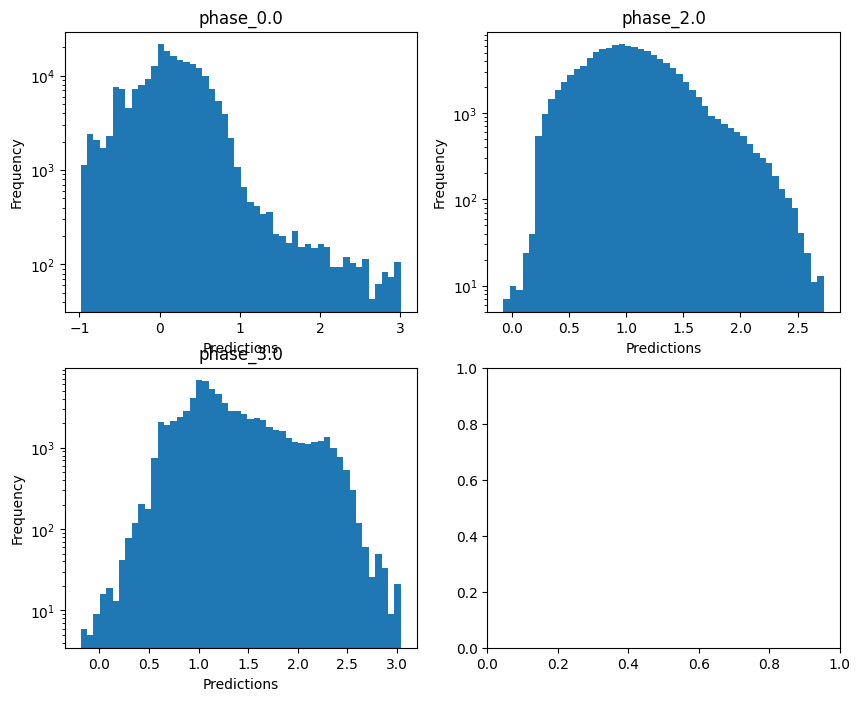

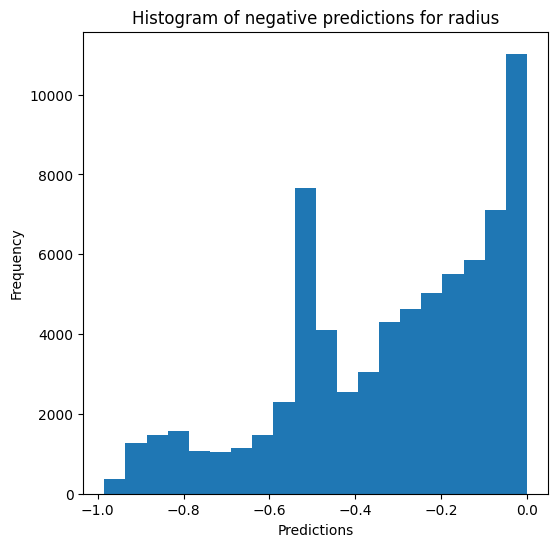

Saving predictions and results...


In [17]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### Random forests

In [18]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9812515901778895
  RMSE :  0.041002446262591585
  MAE :  0.005972181049158456
  MedAE :  0.0005301897925718002
  CORR :  0.9906925498637511
  MAX_ER :  0.888833043091386
  Percentiles : 
    75th percentile :  0.001296187980207808
    90th percentile :  0.003544915343995928
    95th percentile :  0.008667634895952852
    99th percentile :  0.14170900802762565

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9555322555443011
  RMSE :  0.0518063357684301
  MAE :  0.02226033514472106
  MedAE :  0.0026492087970906297
  CORR :  0.9775229738232163
  MAX_ER :  0.7231697705035973
  Percentiles : 
    75th percentile :  0.017809746336626908
    90th percentile :  0.07692006075

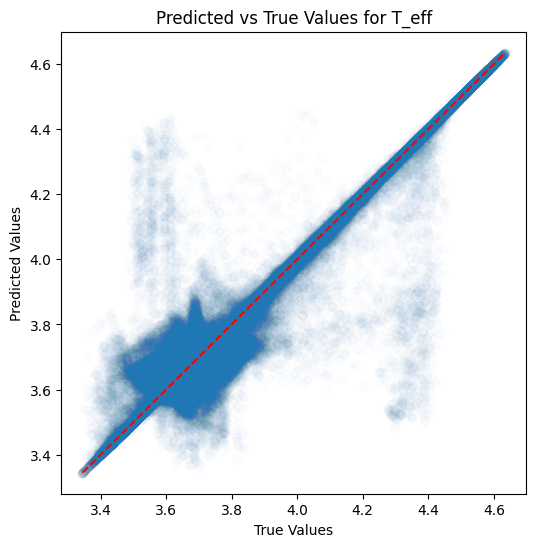

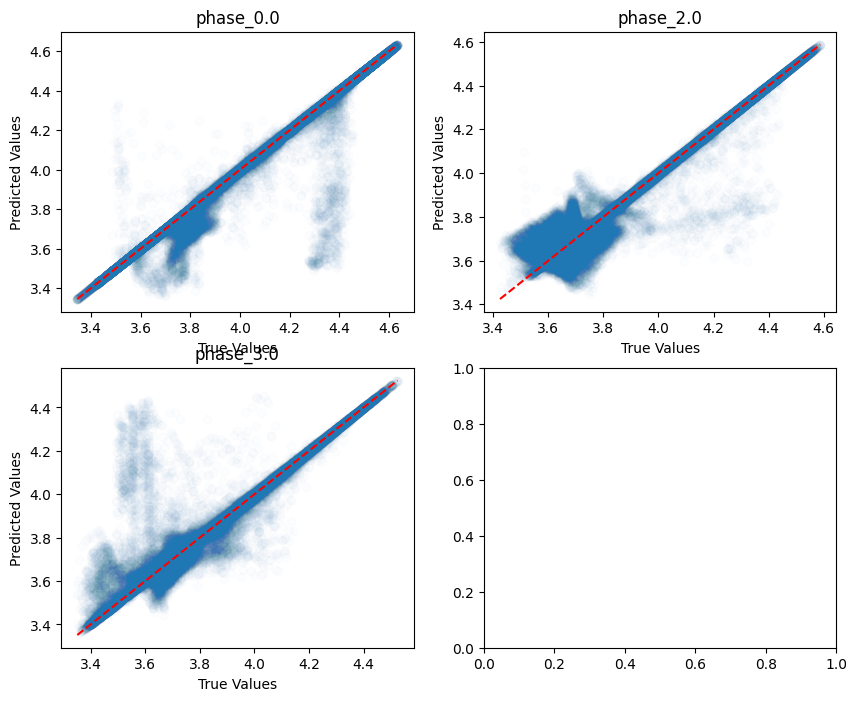

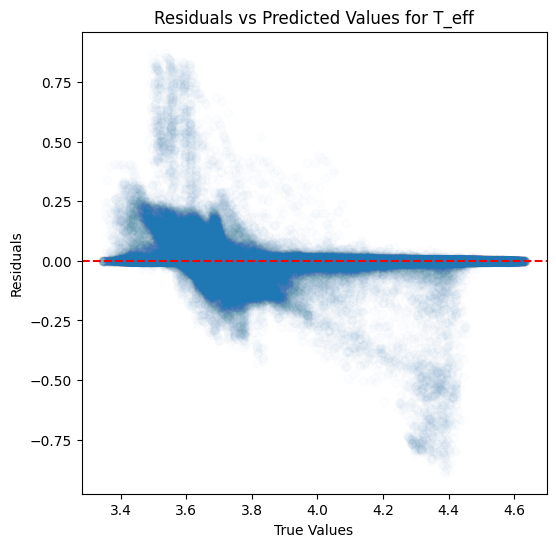

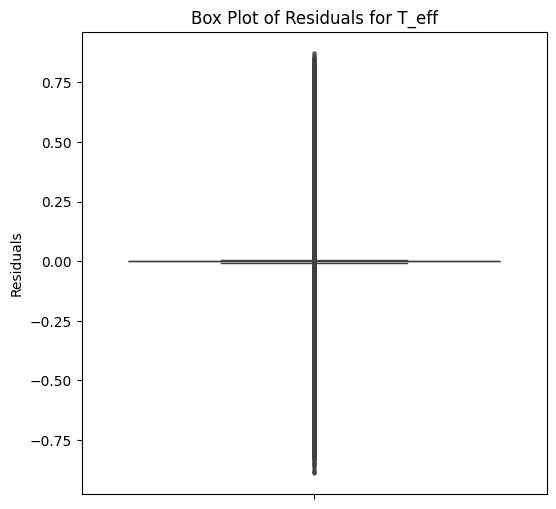

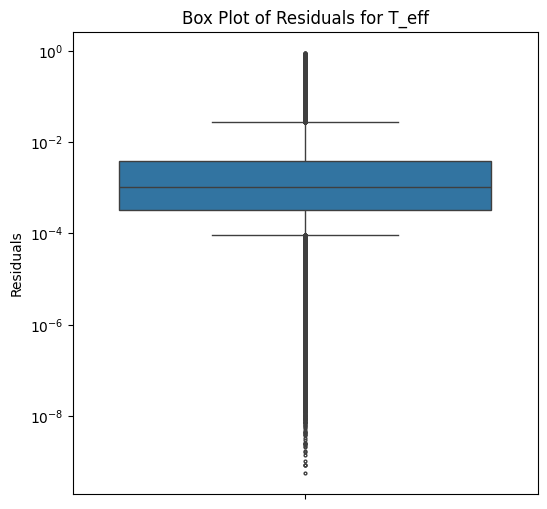

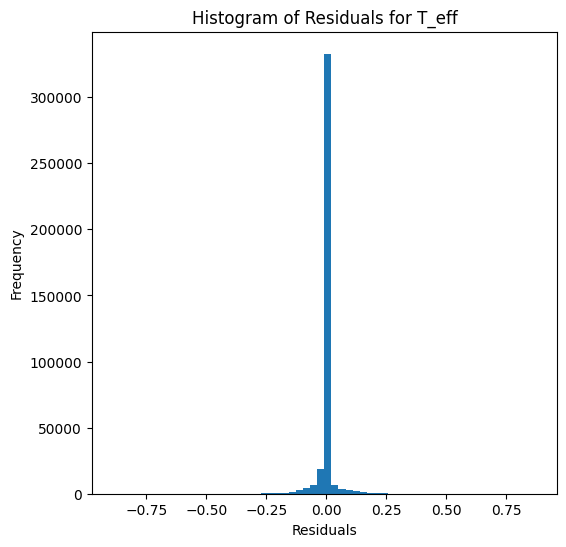

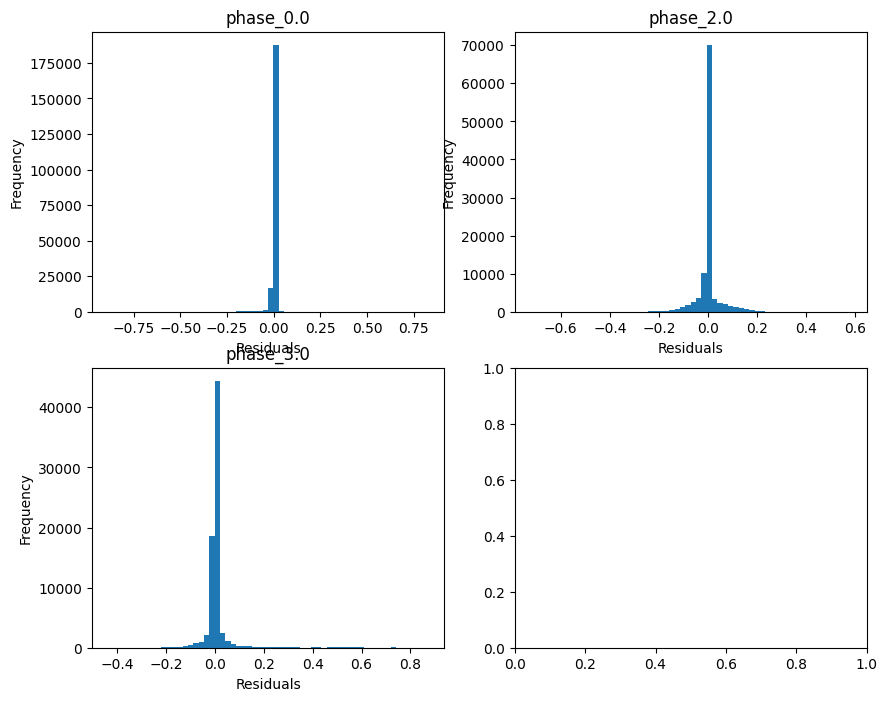

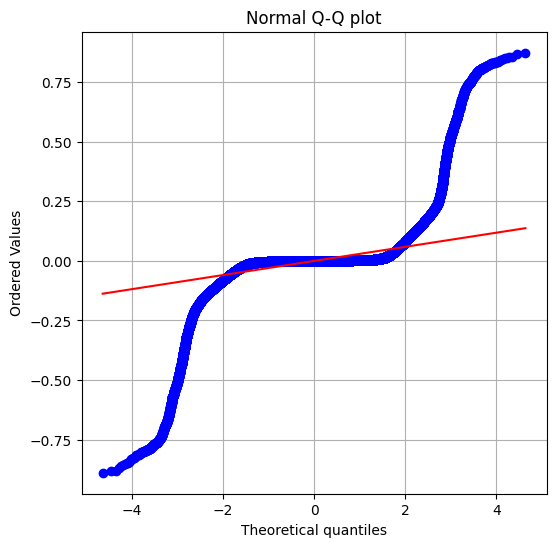

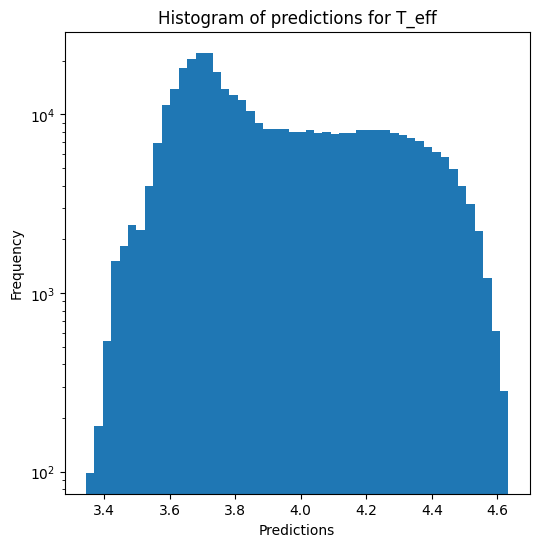

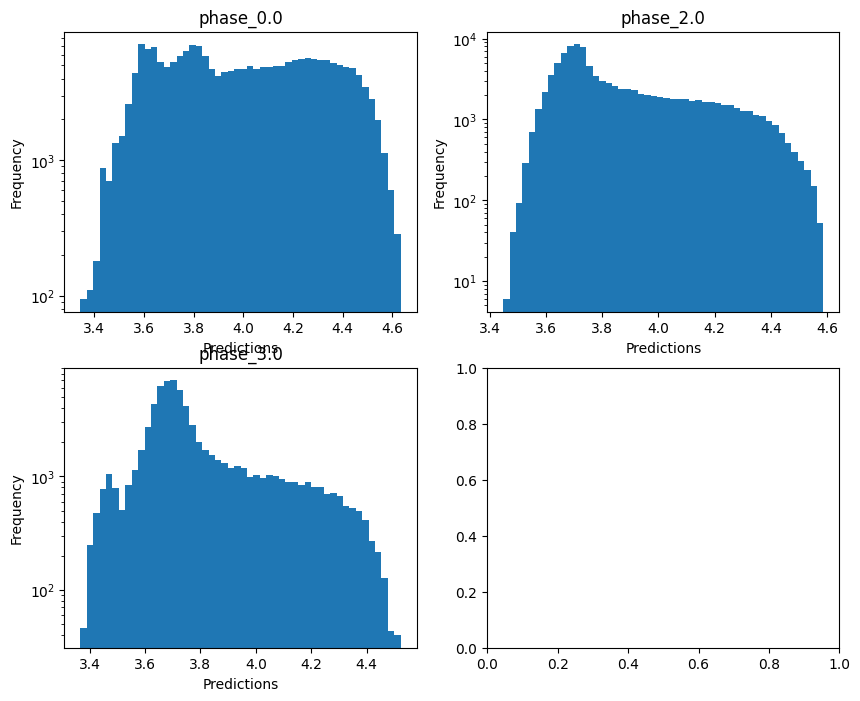


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.41070435949489426
  RMSE :  0.3534745731250887
  MAE :  0.0550002297808177
  MedAE :  0.0015220343044255458
  CORR :  0.8119698543700286
  MAX_ER :  5.575104008706985
  Percentiles : 
    75th percentile :  0.004195883255025734
    90th percentile :  0.012275670492866738
    95th percentile :  0.046080579796866646
    99th percentile :  2.1607507826179297

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.2860576263244211
  RMSE :  0.7843210220458192
  MAE :  0.35970713286700357
  MedAE :  0.013515293174781284
  CORR :  0.6029009914629886
  MAX_ER :  4.4632396307173625
  Percentiles : 
    75th percentile :  0.33468491853723703
    90th percentile :  1.4364488668746402
    95th percentile :  2.01578332439514
    99th percentile :  2.973174044637222

log_g results for the phase category w

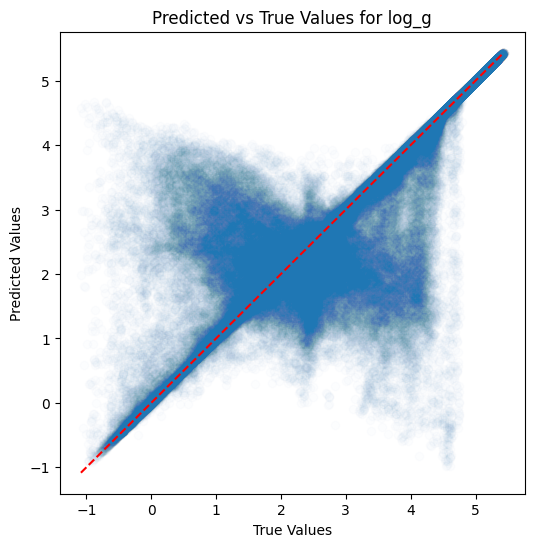

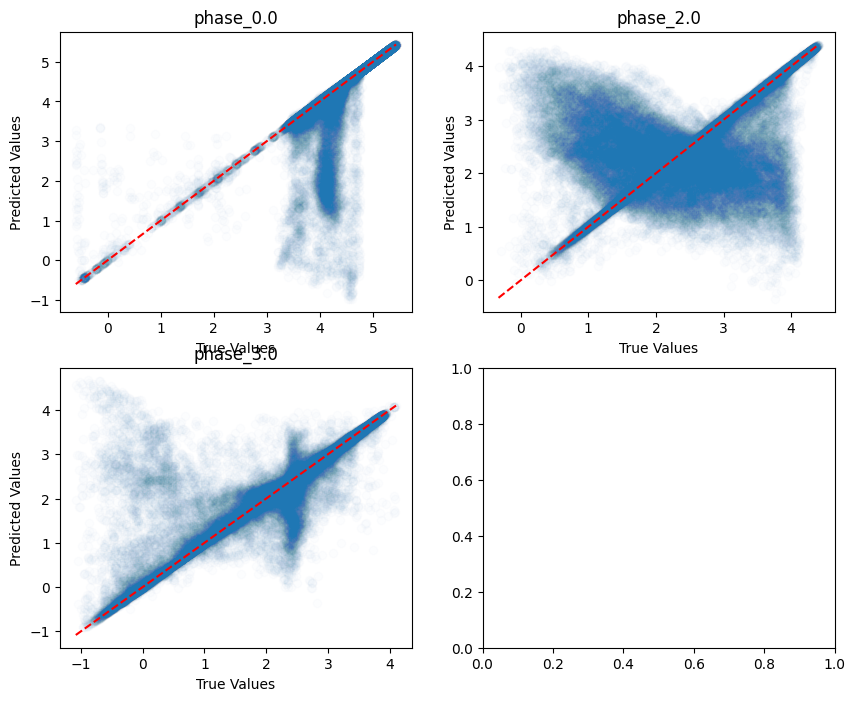

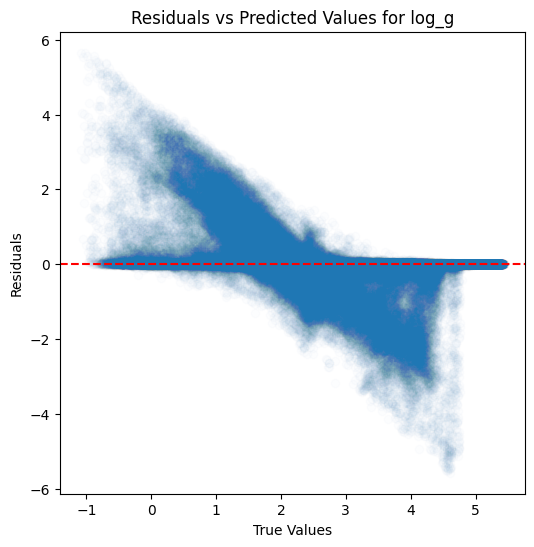

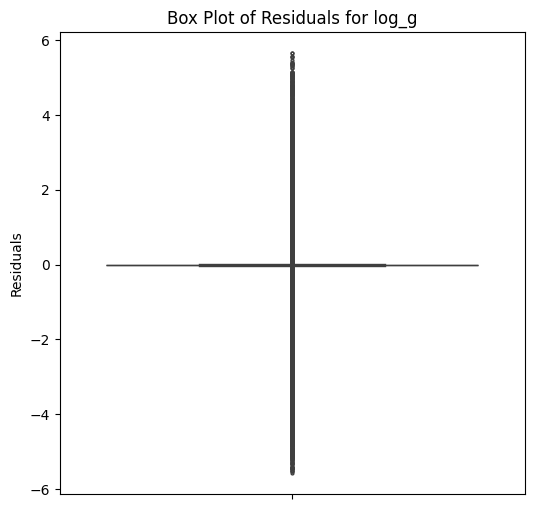

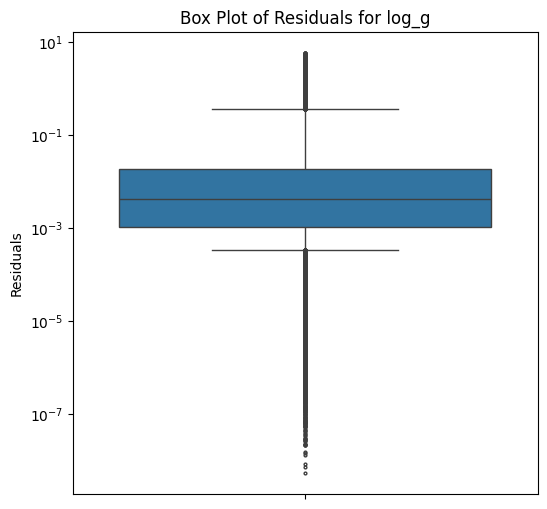

...

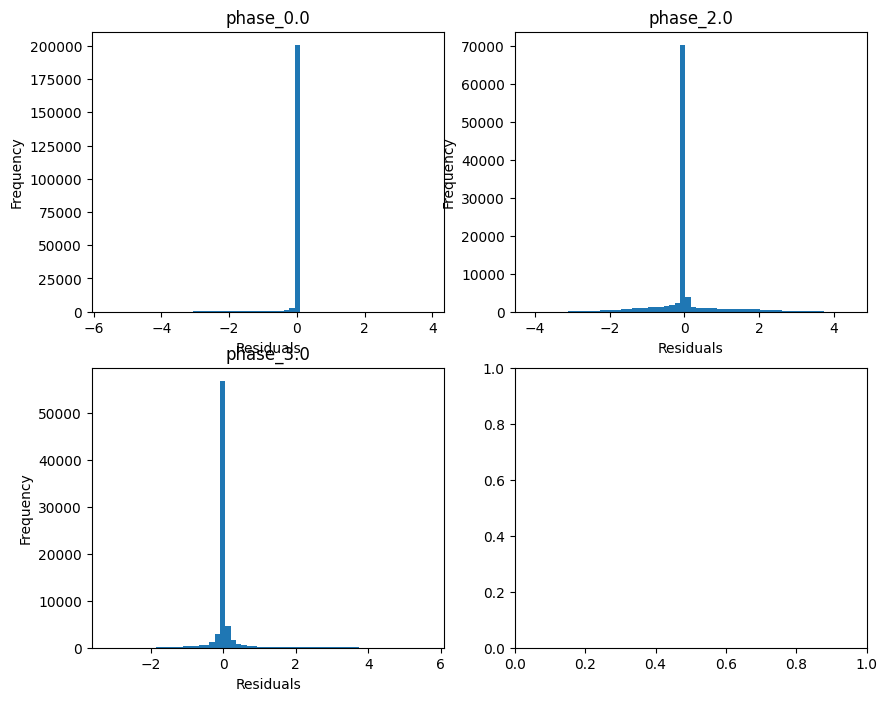

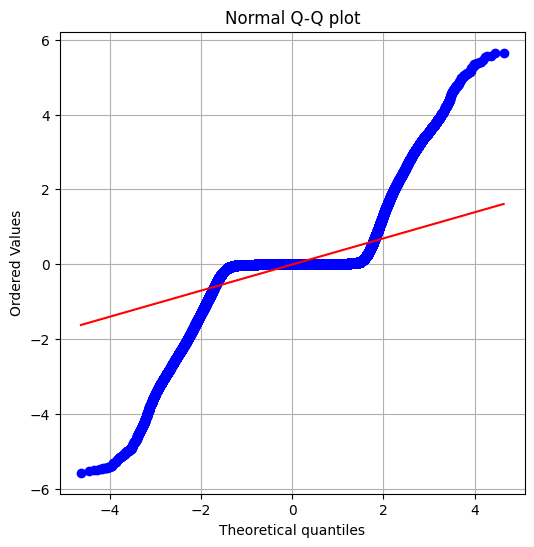

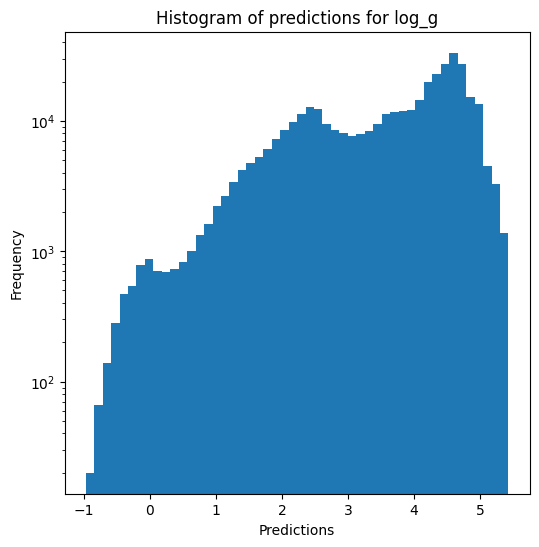

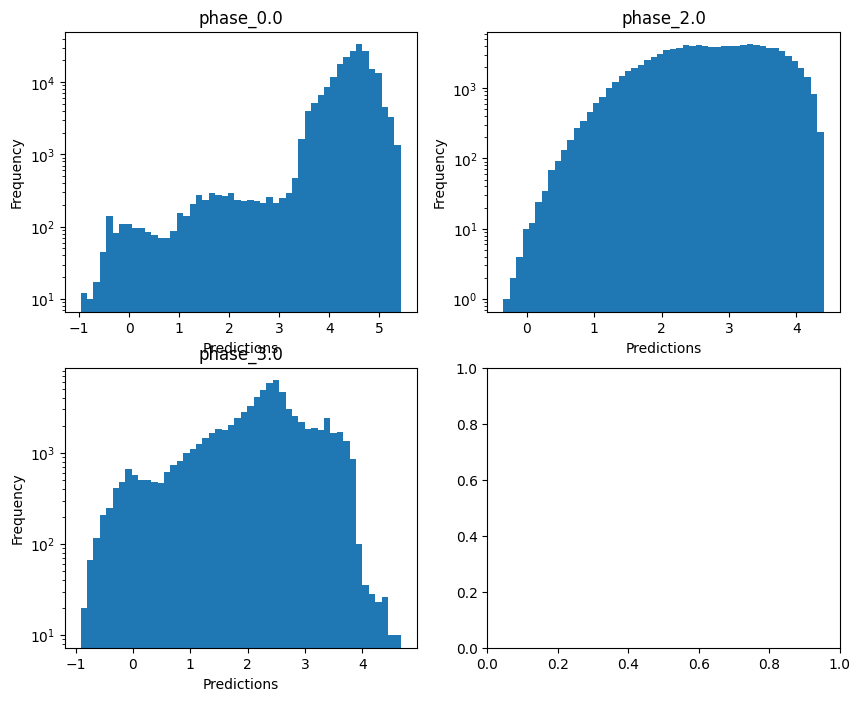

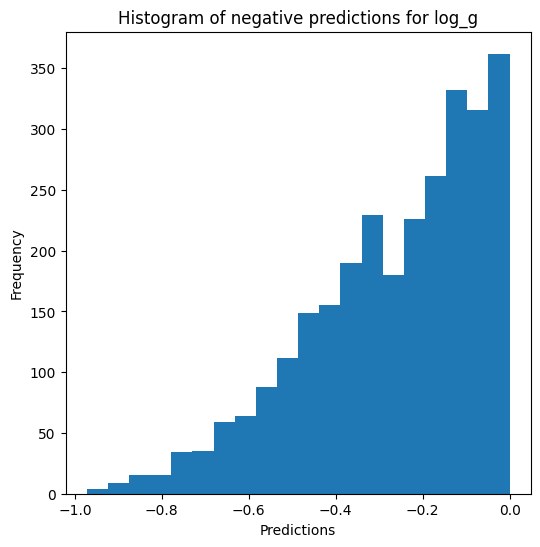


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.8274921577145724
  RMSE :  0.17675582109176471
  MAE :  0.02772798228688615
  MedAE :  0.0009716574749427109
  CORR :  0.9250715450137749
  MAX_ER :  2.7892184184603277
  Percentiles : 
    75th percentile :  0.0024884373917235247
    90th percentile :  0.006720278241645801
    95th percentile :  0.02321611886248108
    99th percentile :  1.0803322814504206

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.29061011162827377
  RMSE :  0.392151170686595
  MAE :  0.17985392221274582
  MedAE :  0.006767762108108921
  CORR :  0.6159875321344142
  MAX_ER :  2.23153453877046
  Percentiles : 
    75th percentile :  0.16736491816010401
    90th percentile :  0.7180594545430354
    95th percentile :  1.0078399811214611
    99th percentile :  1.4865737108582677

radius results for the phase categ

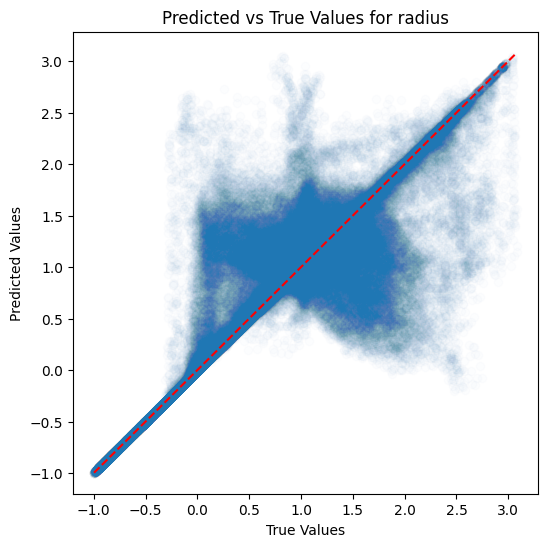

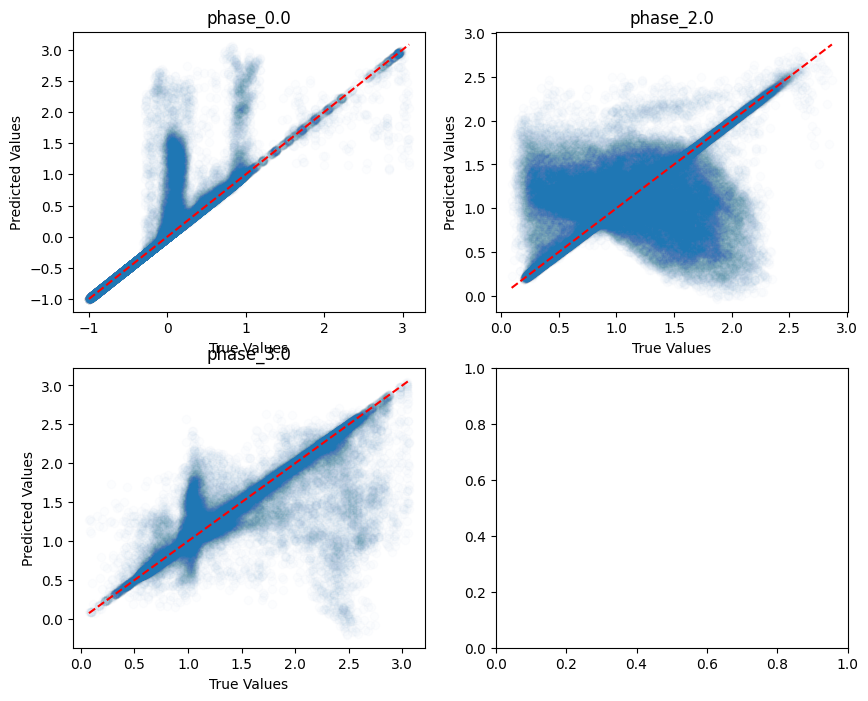

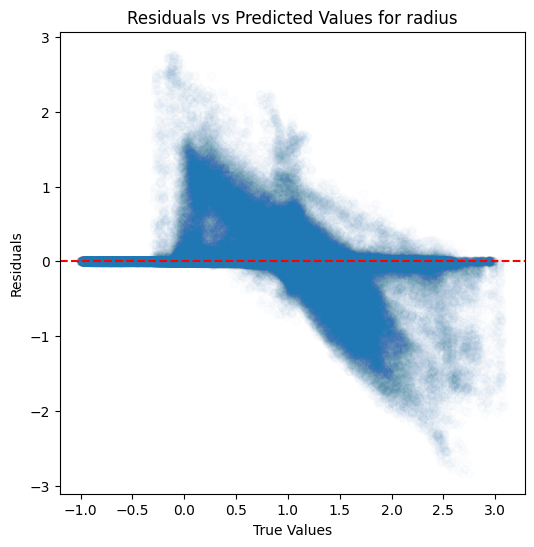

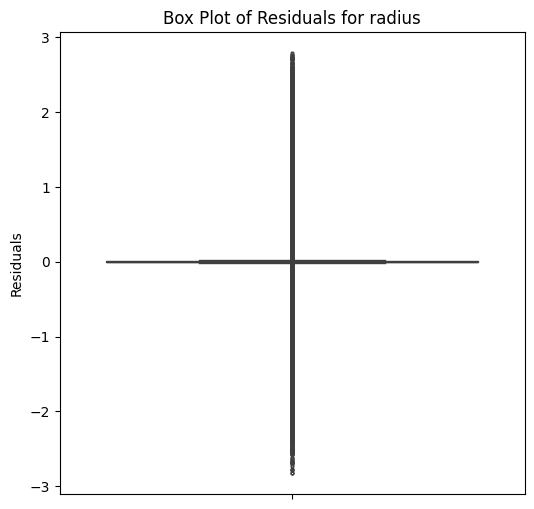

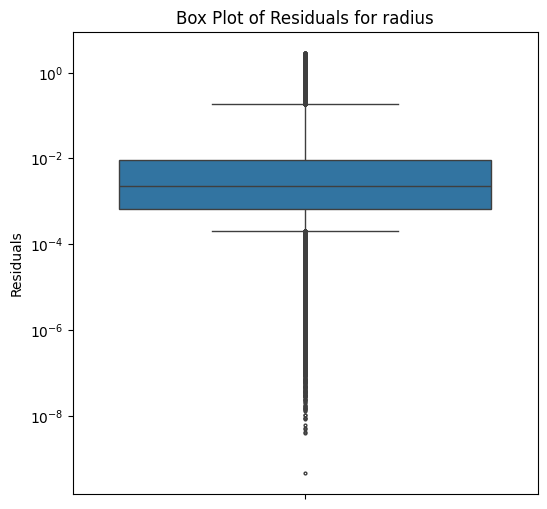

...

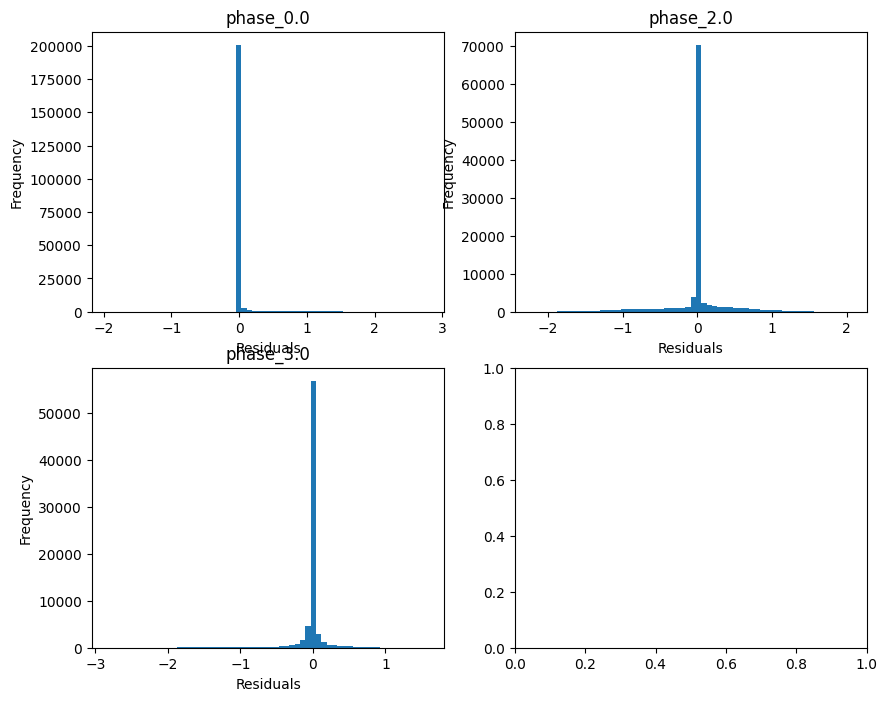

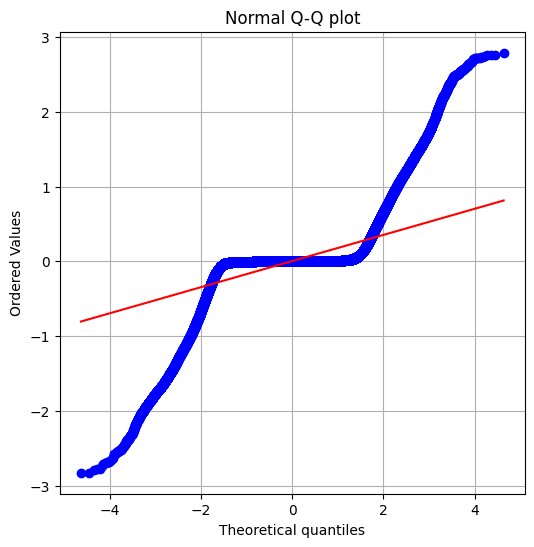

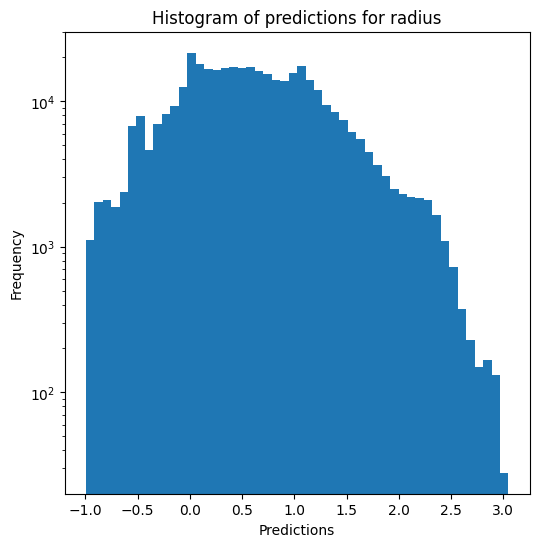

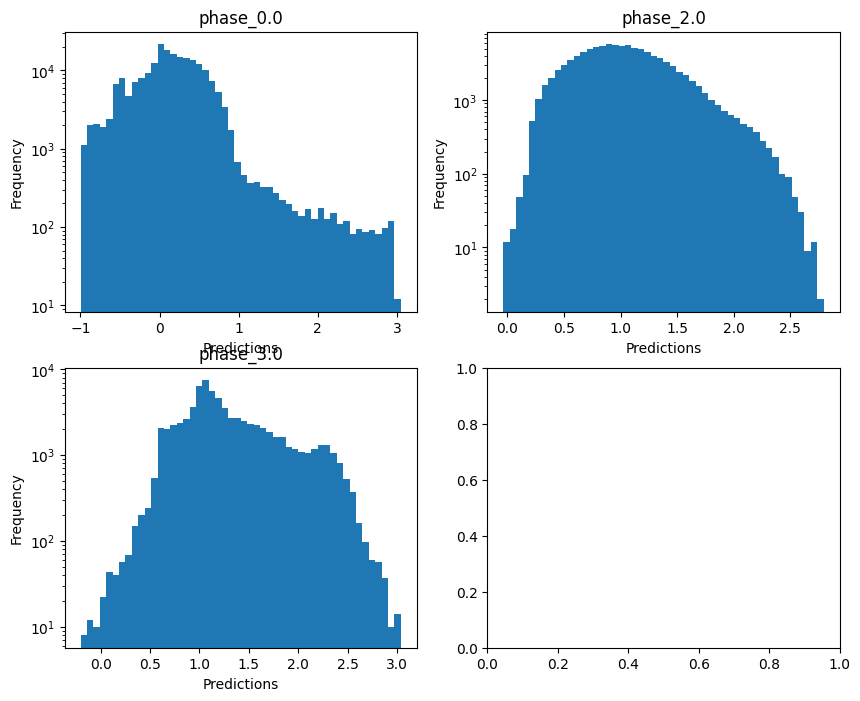

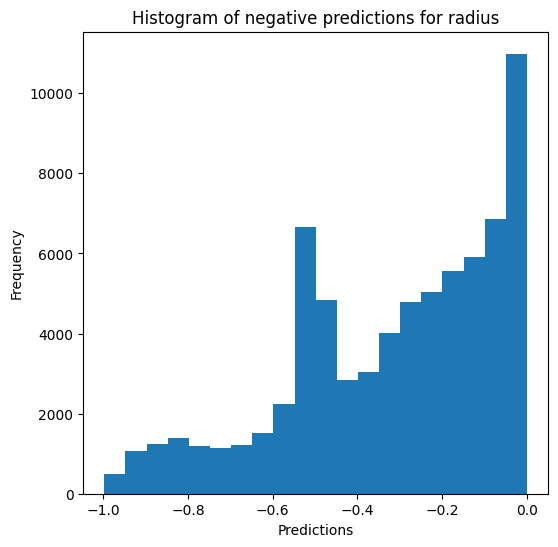

Saving predictions and results...


In [19]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### XGBoost

In [20]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9329993858416573
  RMSE :  0.08433051040527387
  MAE :  0.044367065572717274
  MedAE :  0.012696993271479329
  CORR :  0.9659831366286723
  MAX_ER :  0.7527775358057482
  Percentiles : 
    75th percentile :  0.04967174560038767
    90th percentile :  0.13734386009255692
    95th percentile :  0.20064444143690474
    99th percentile :  0.3363927312881953

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.7787640849585825
  RMSE :  0.11845257950561956
  MAE :  0.08985585491555405
  MedAE :  0.07013852863494918
  CORR :  0.8825424453518154
  MAX_ER :  0.5216525014314932
  Percentiles : 
    75th percentile :  0.12351239604838515
    90th percentile :  0.19578151126905427


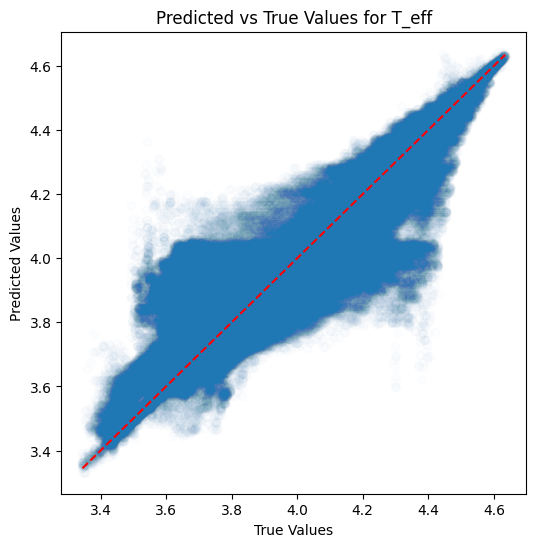

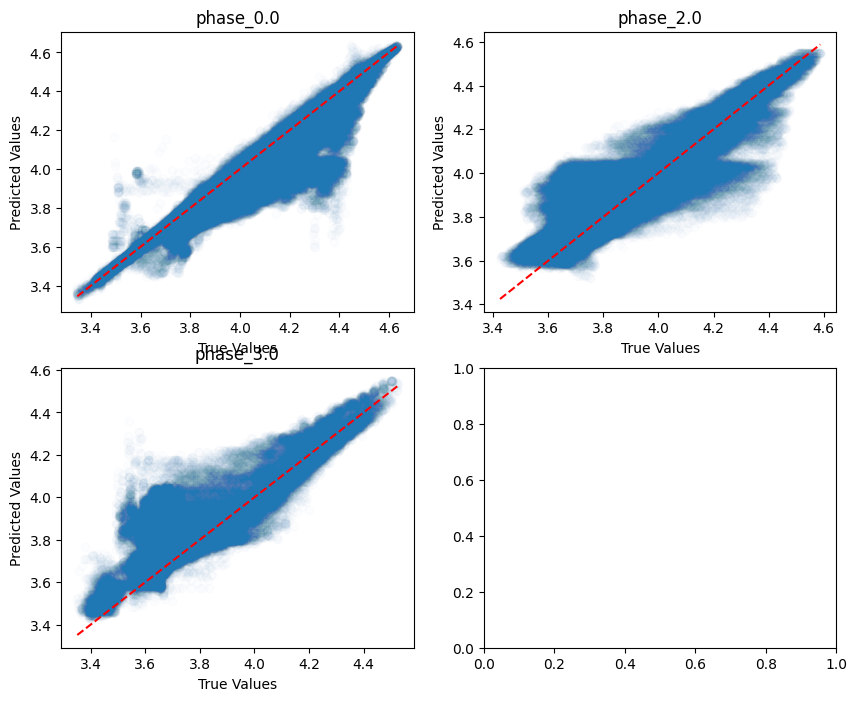

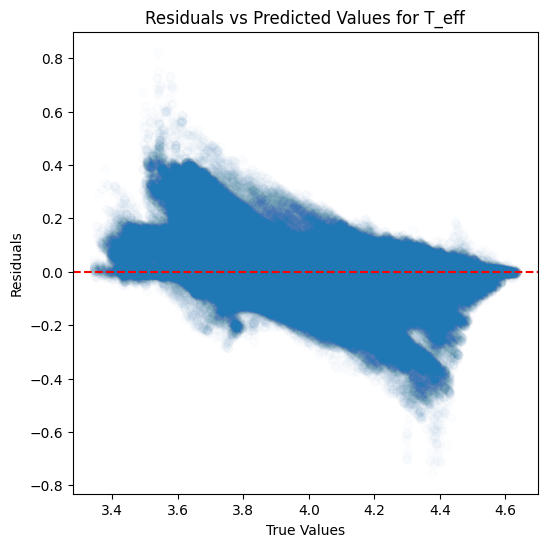

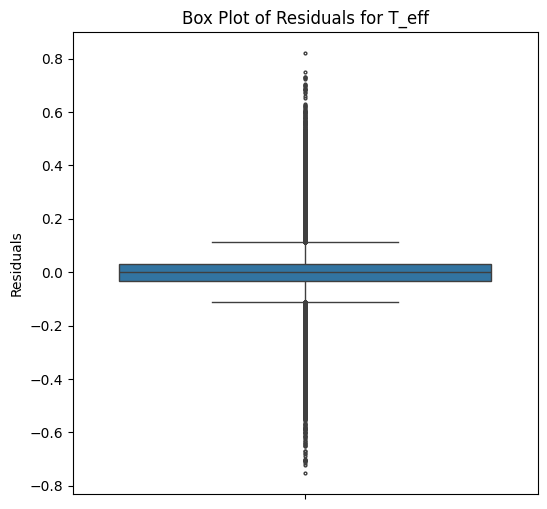

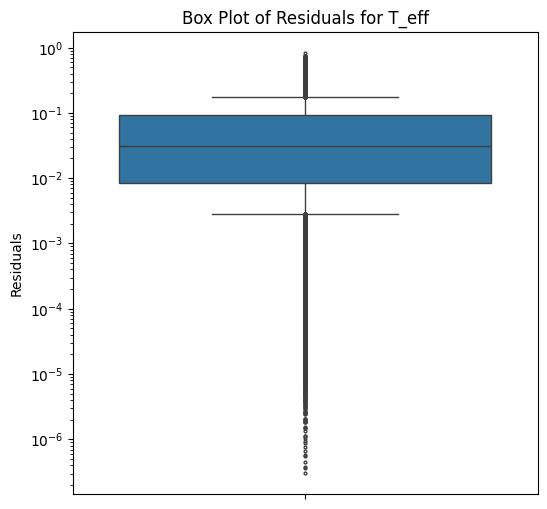

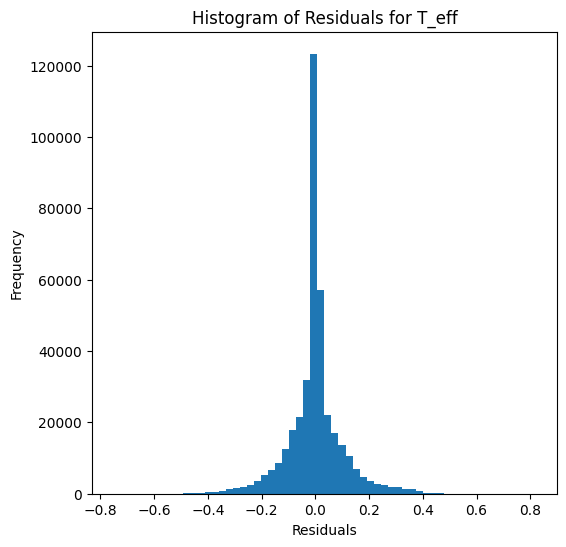

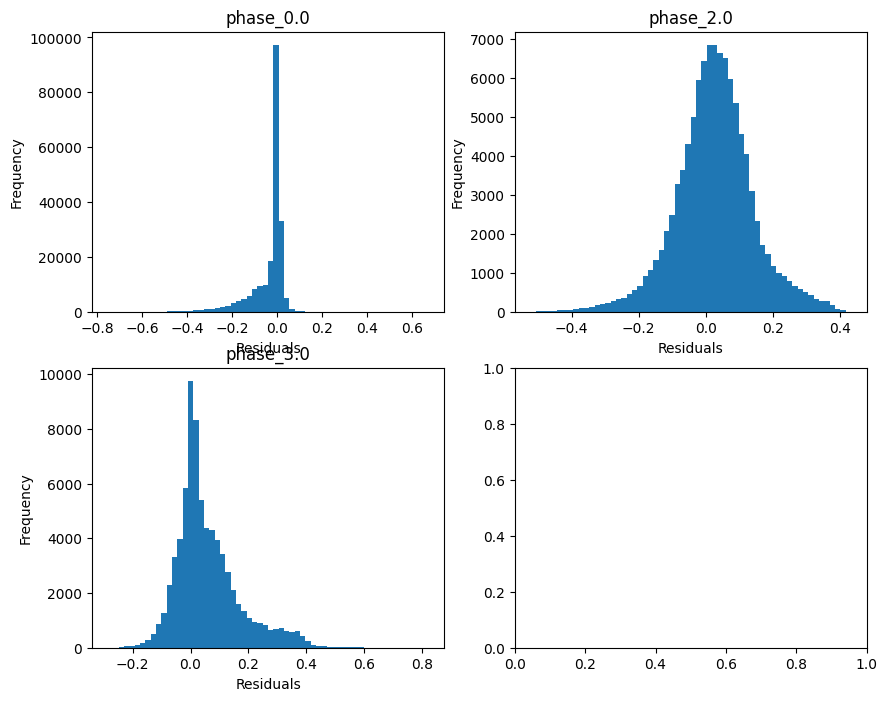

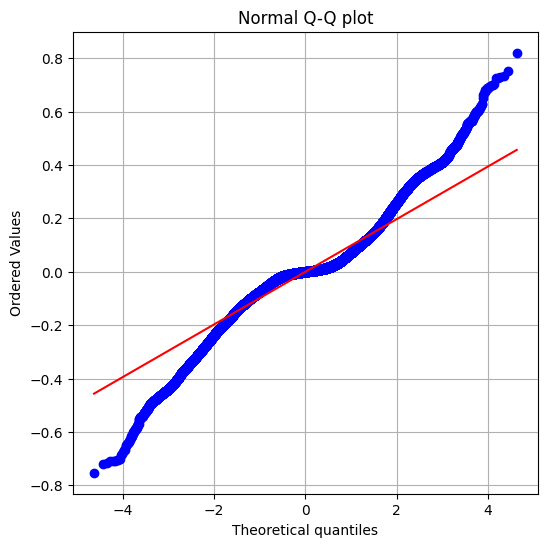

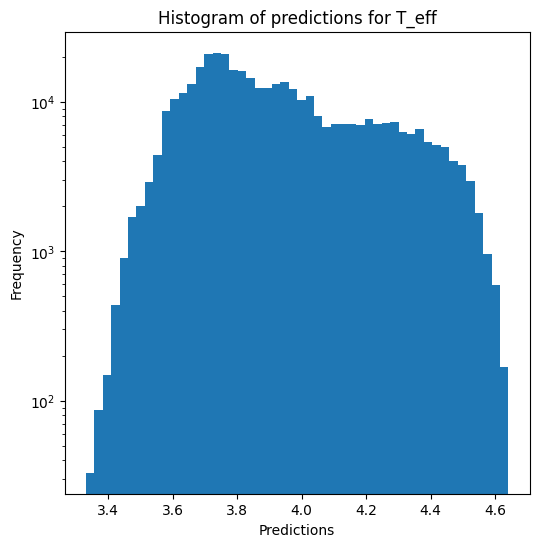

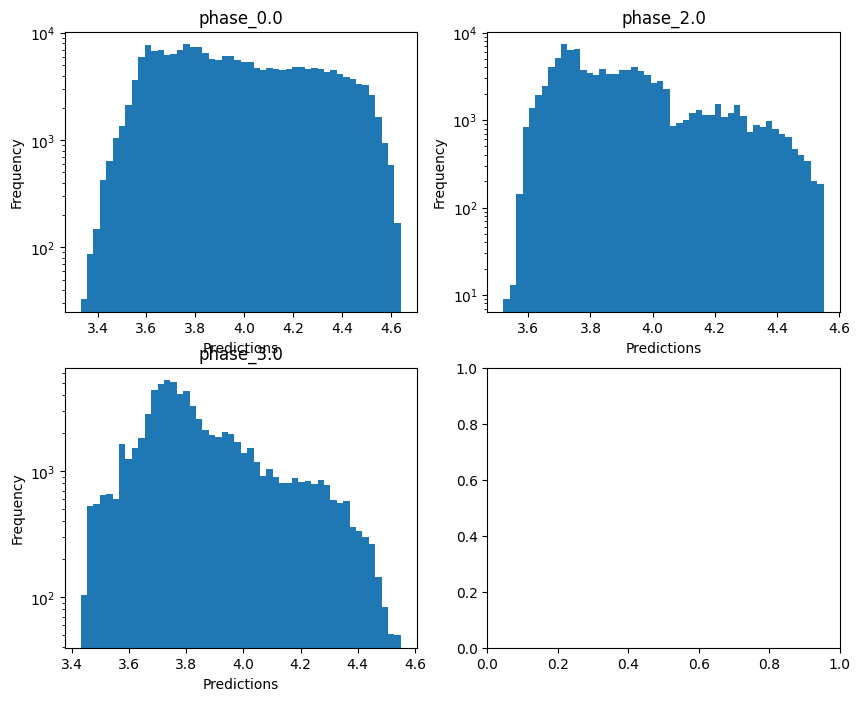


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.022218103719078286
  RMSE :  0.49525057575646697
  MAE :  0.26190654388023915
  MedAE :  0.06372814259918957
  CORR :  0.8401454856816758
  MAX_ER :  4.81819374291191
  Percentiles : 
    75th percentile :  0.3164909619176921
    90th percentile :  0.8453978330503984
    95th percentile :  1.160760388314656
    99th percentile :  1.729002763386747

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.3627631788126231
  RMSE :  0.7499162640450757
  MAE :  0.5823159307376538
  MedAE :  0.46817376999770577
  CORR :  0.6022982771634144
  MAX_ER :  3.668341751024429
  Percentiles : 
    75th percentile :  0.8350980366146572
    90th percentile :  1.240708939630545
    95th percentile :  1.5063785070693088
    99th percentile :  2.082031817412269

log_g results for the phase category with a value

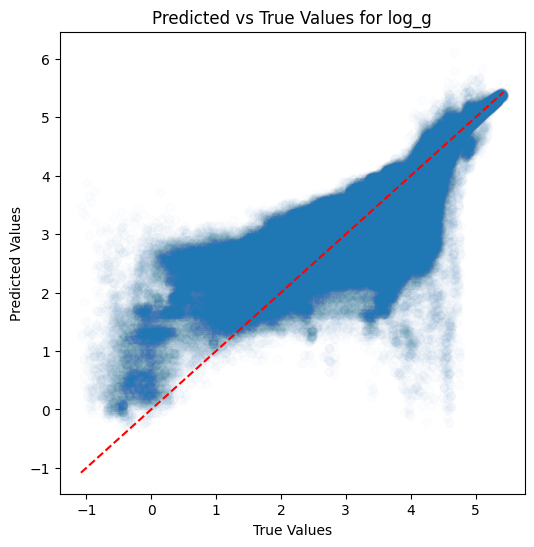

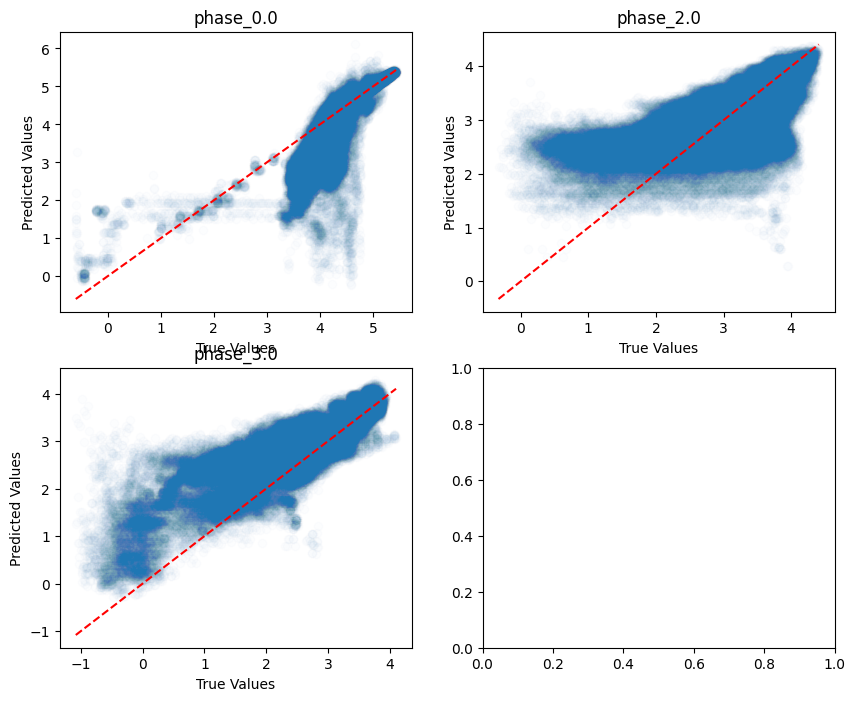

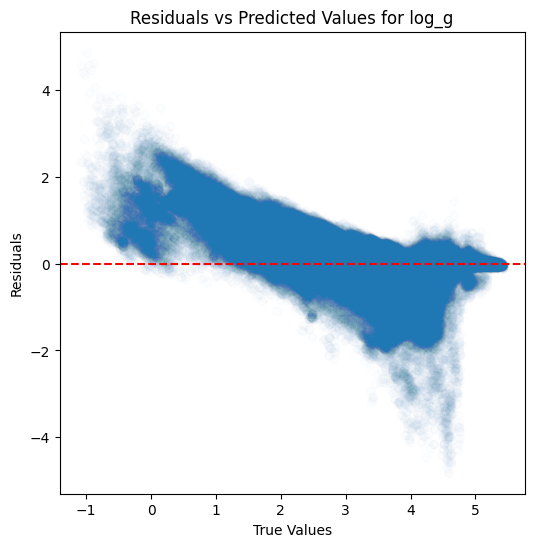

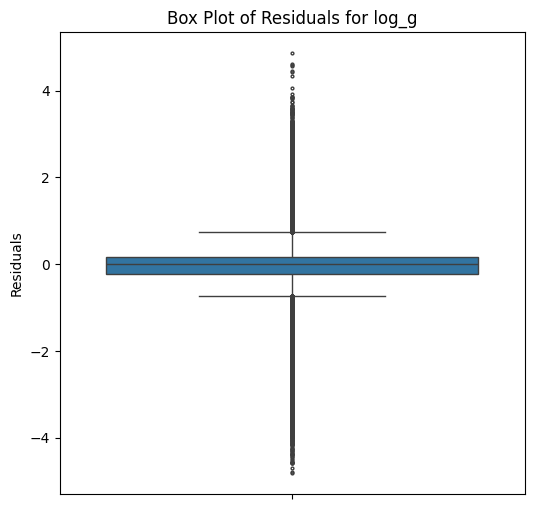

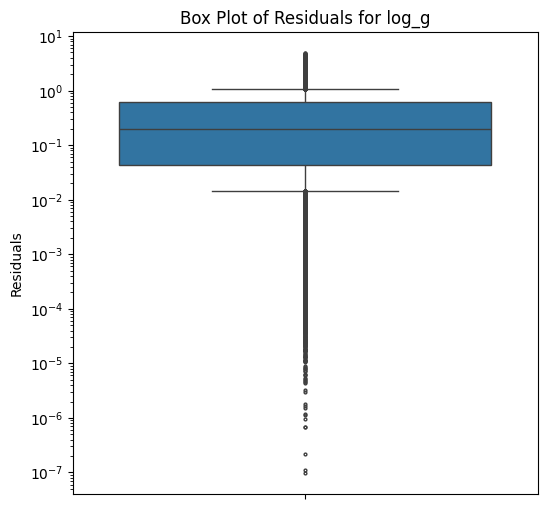

...

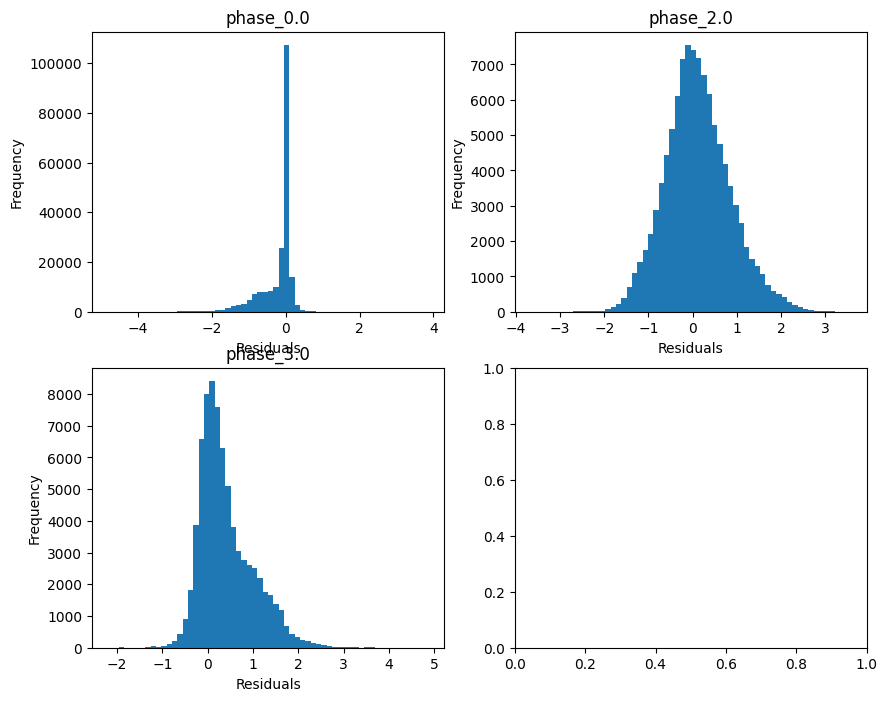

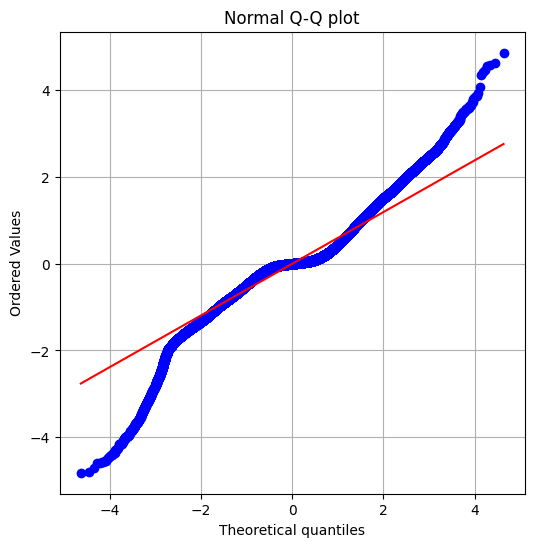

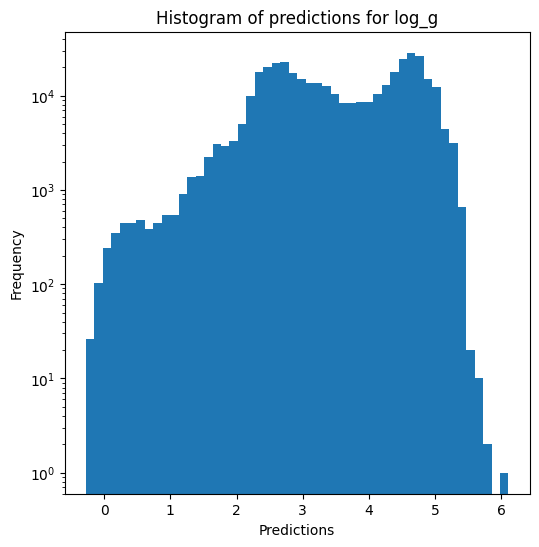

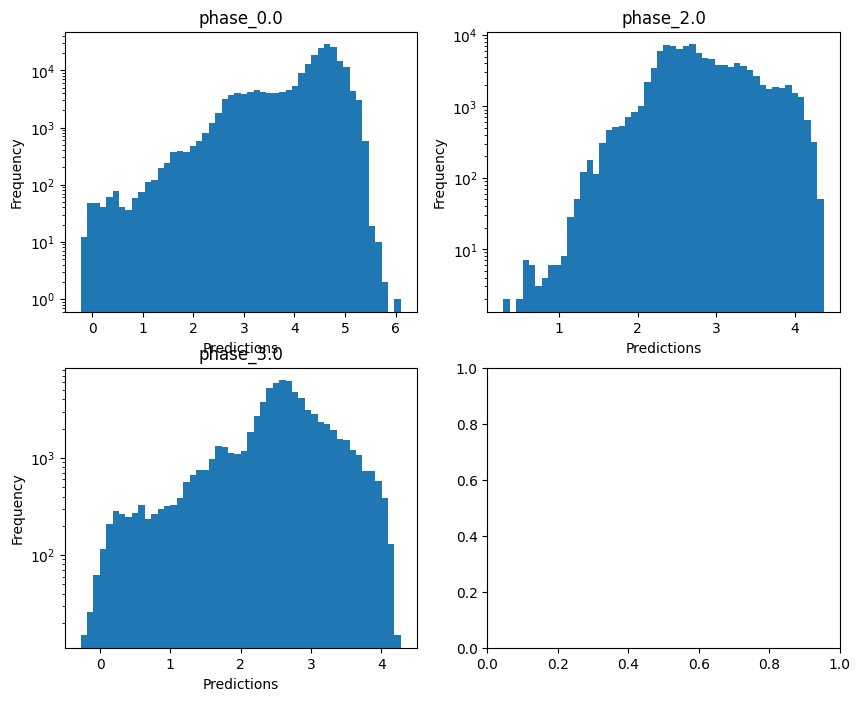

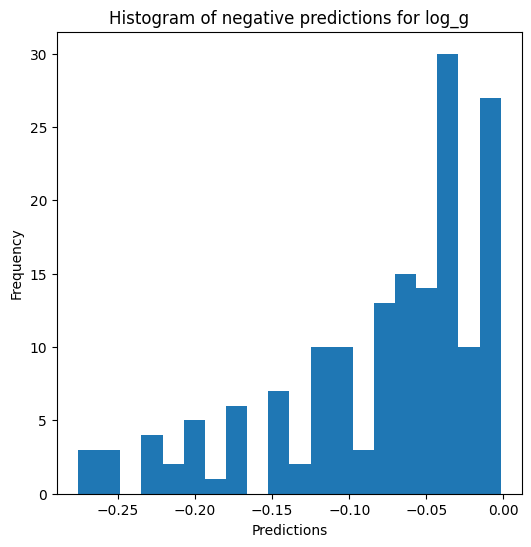


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.7102589478863934
  RMSE :  0.24917218677292835
  MAE :  0.13280070428559304
  MedAE :  0.03418553868899801
  CORR :  0.9153577170512818
  MAX_ER :  2.487977248970757
  Percentiles : 
    75th percentile :  0.15998398263332075
    90th percentile :  0.42689467515846147
    95th percentile :  0.5853090495164767
    99th percentile :  0.8617978126032445

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.36641121794787357
  RMSE :  0.3750089655256366
  MAE :  0.29133210966783607
  MedAE :  0.2338861683896632
  CORR :  0.6060964235878444
  MAX_ER :  1.8187564700970495
  Percentiles : 
    75th percentile :  0.41814805841617486
    90th percentile :  0.6194735385775714
    95th percentile :  0.7534897595872693
    99th percentile :  1.0426598636528577

radius results for the phase category wi

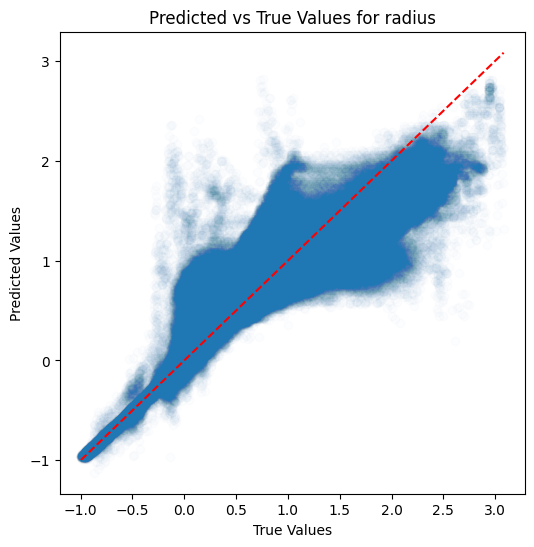

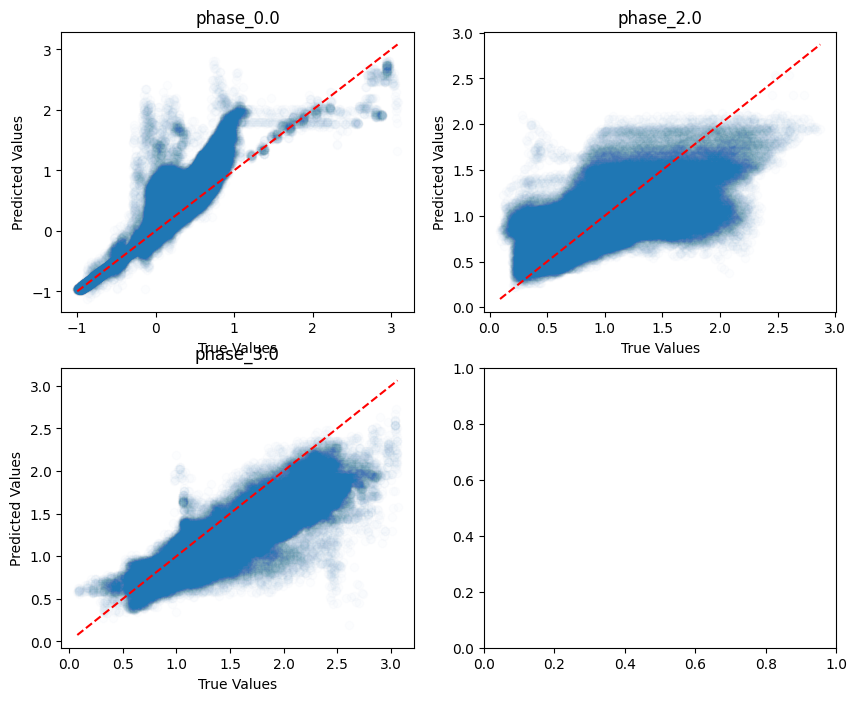

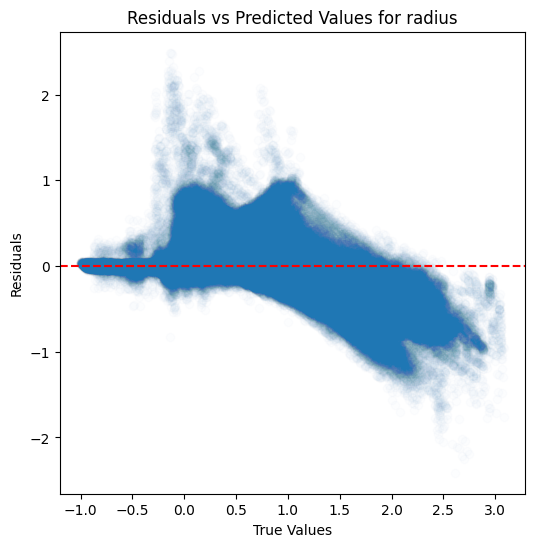

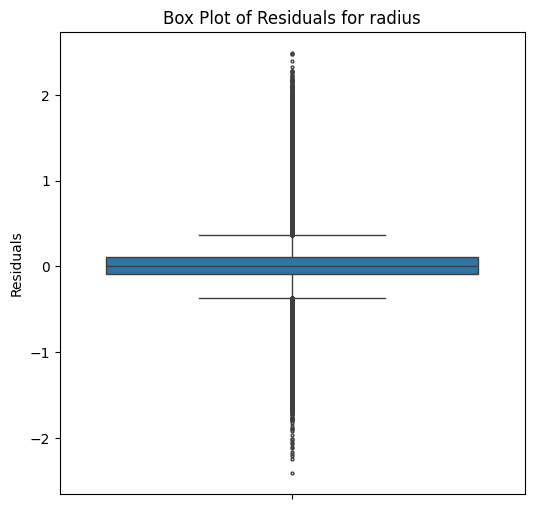

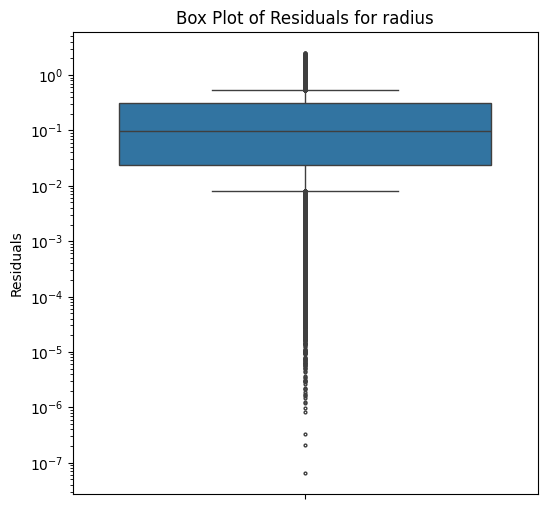

...

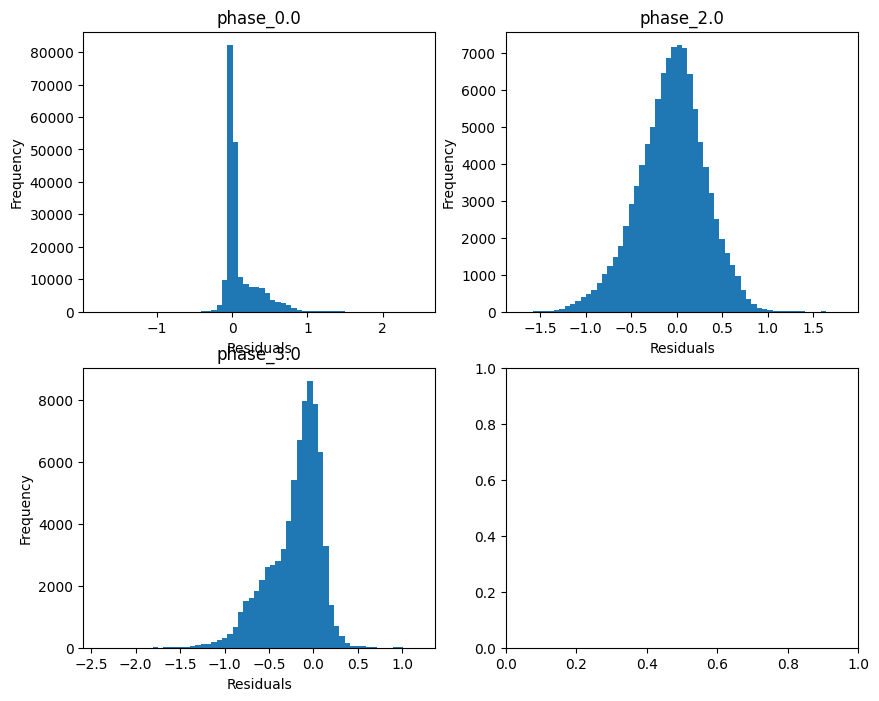

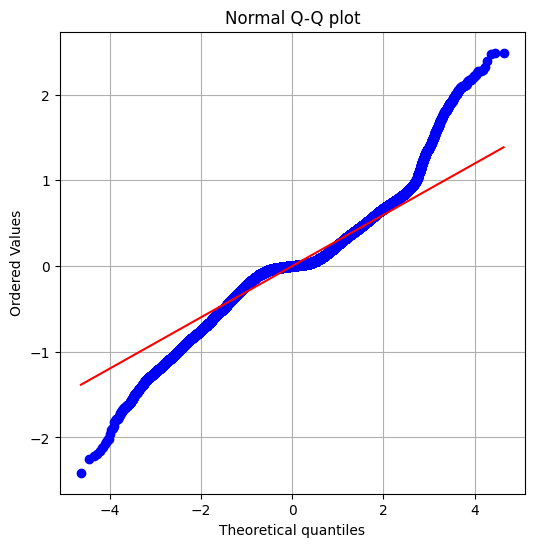

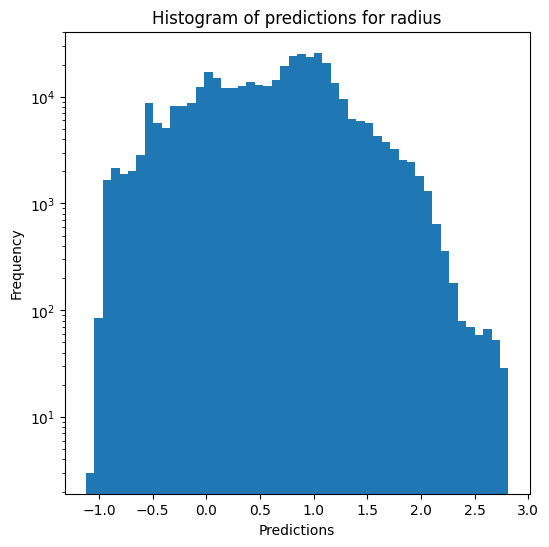

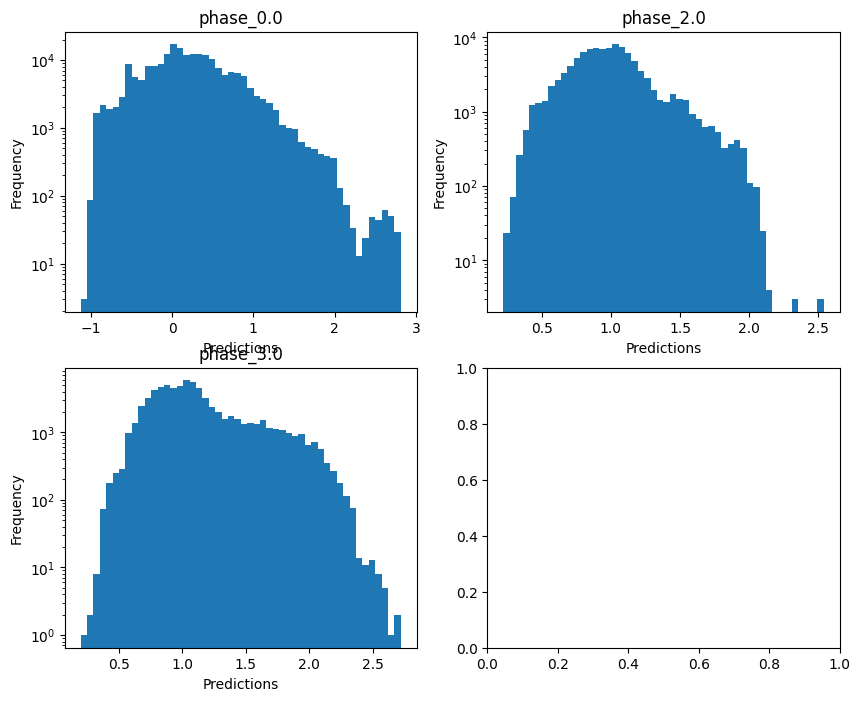

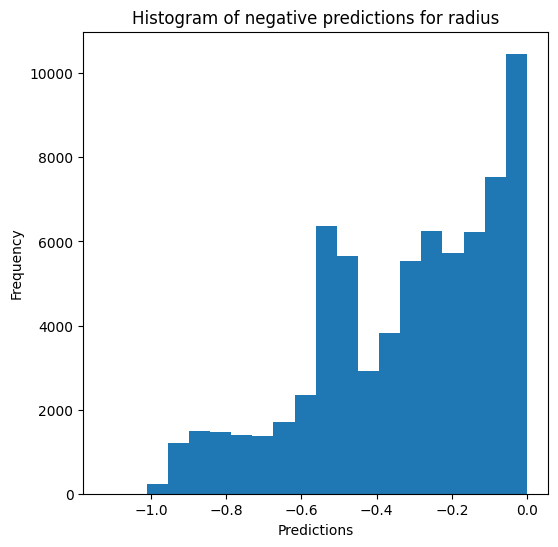

Saving predictions and results...


In [21]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### Multi-layer perceptron

In [22]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.11984989857587913
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.11912561913291503
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.11998532200372554
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.11767042929783865
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.11731287870970718

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.8532758327265313
  RMSE :  0.13012822655651377
  MAE :  0.08670797832116624
  MedAE :  0.04772096592315833
  CORR :  0.9240098789468704
  MAX_ER :  0.5958496395771831
  Percentiles : 
    75th percentile :  0.11090851703137883
    90th percentile :  0.23915848725258992
    95th percentile :  0.3074250031643433
    99th percentile :  0.4134399741474175

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.7352381529870623
  RMSE :  0.12642530707111477
  MAE :  0.09732275242357463
  MedAE :  0.07778714164383582
  CORR :  0.8576444094389253
  MAX_ER :  0.5480198055167982
  Percentiles : 
    75th percentile :  0.1362264751840796
    90th percentile :  0.21043316117258656
    95th percentile :  0.26145009374130035
    99th percentile

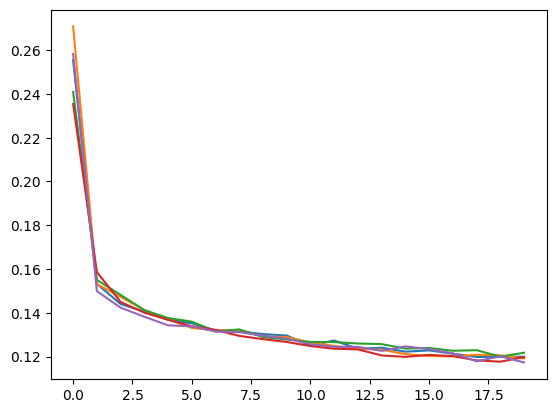

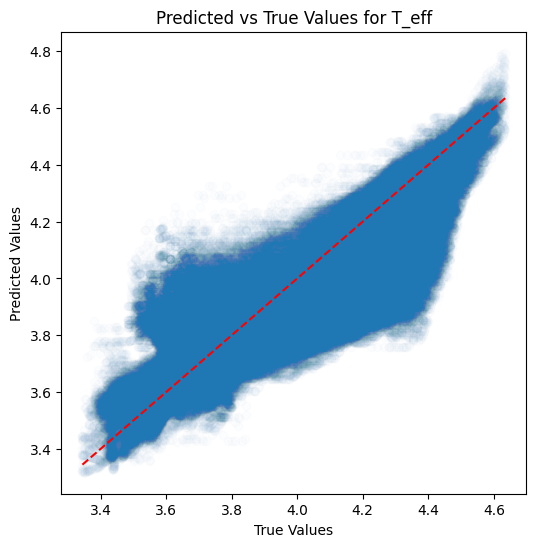

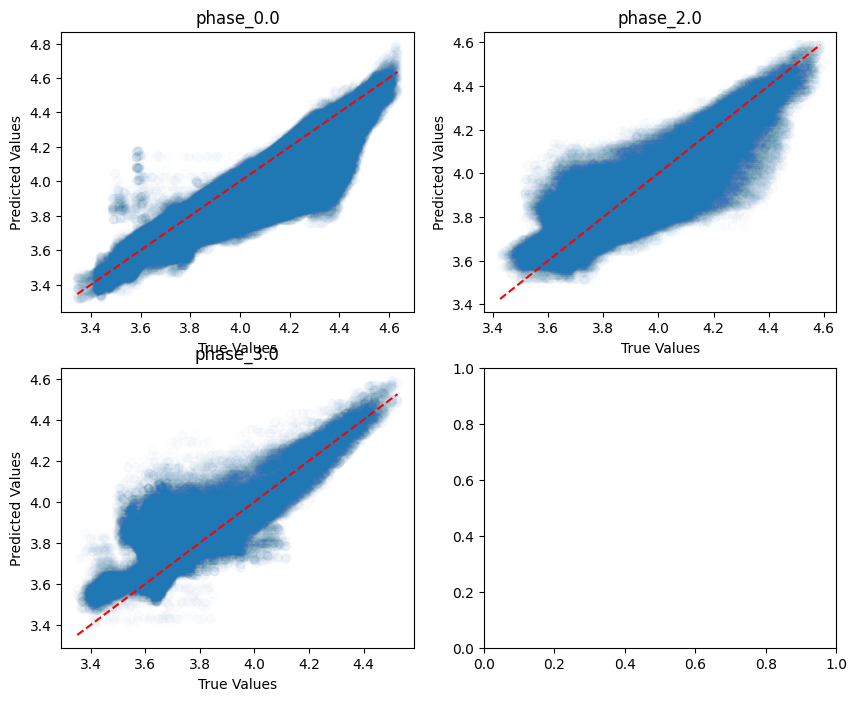

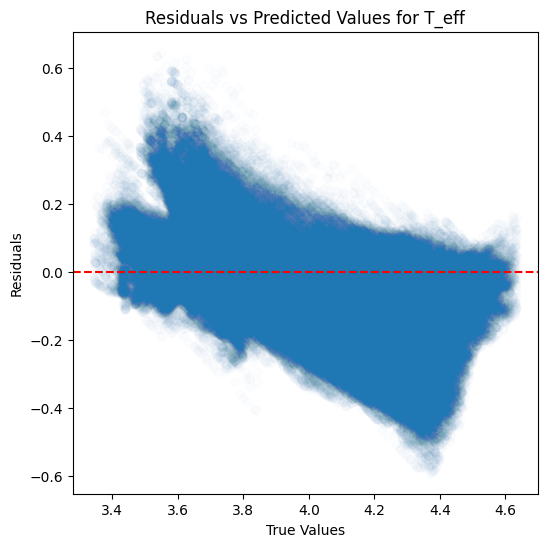

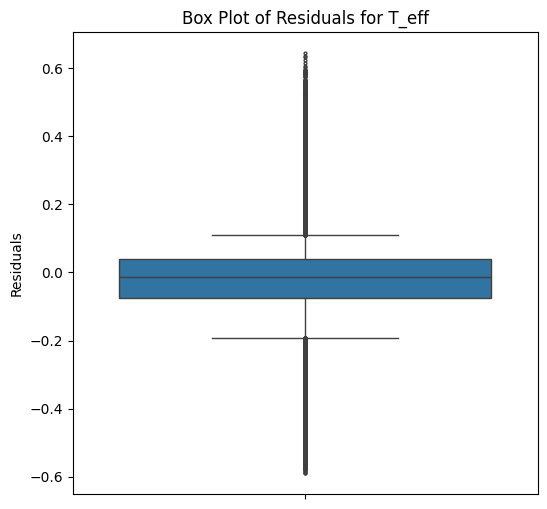

...

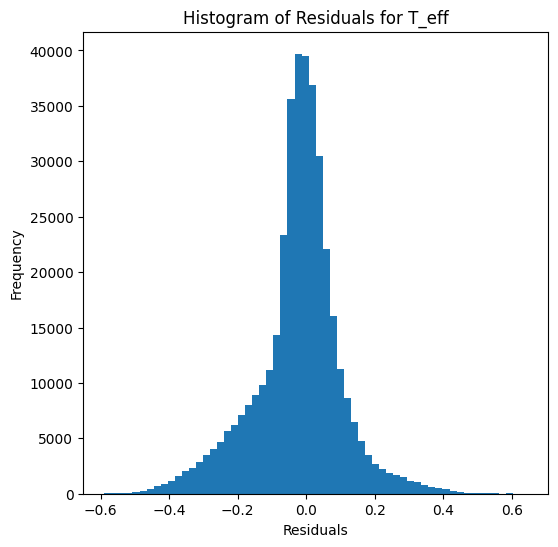

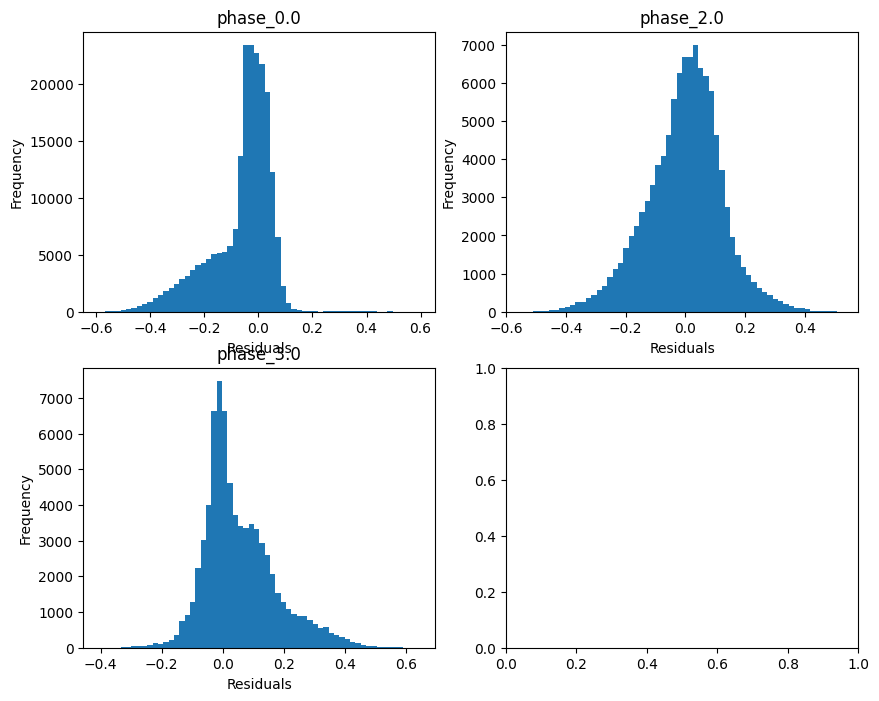

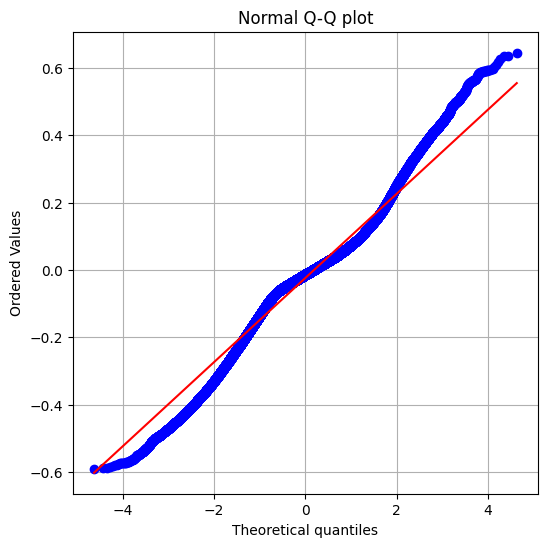

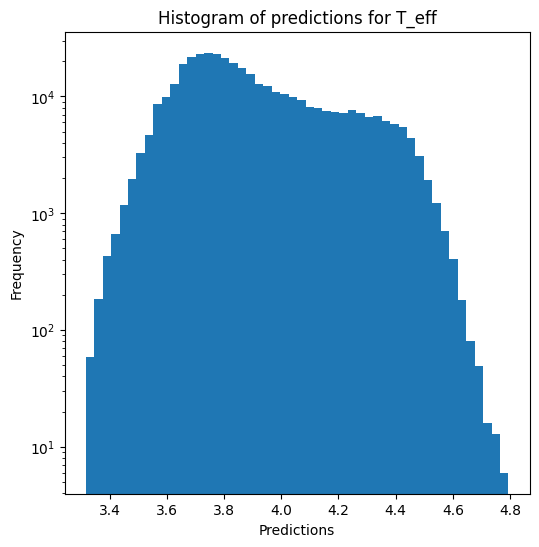

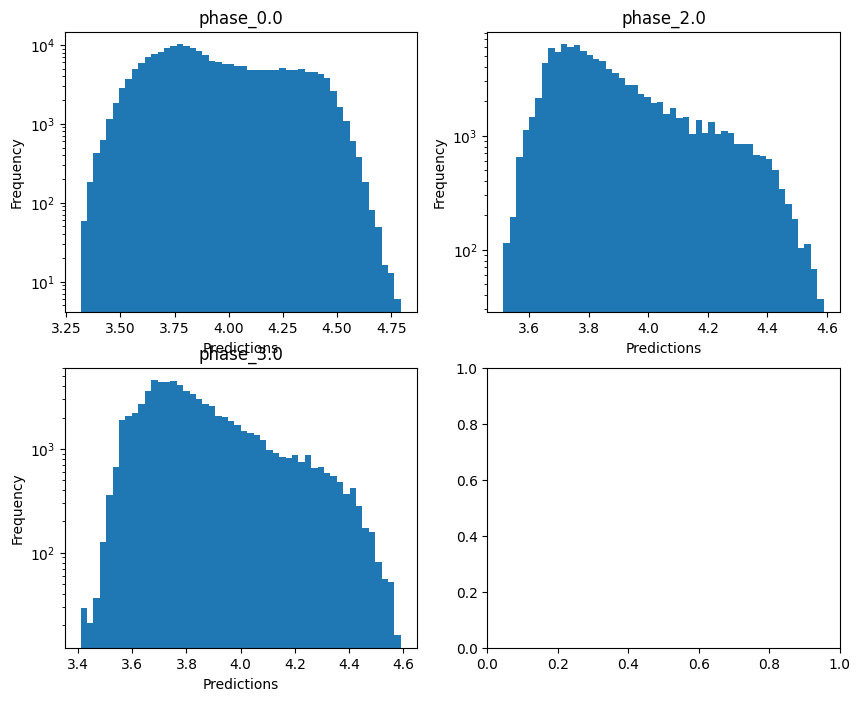

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -0.7756869751909656
  RMSE :  0.7325674501537983
  MAE :  0.4385296930541782
  MedAE :  0.08928165981908709
  CORR :  0.7872523910284589
  MAX_ER :  3.3564025185651434
  Percentiles : 
    75th percentile :  0.8484371026381394
    90th percentile :  1.418907476183336
    95th percentile :  1.627344705097951
    99th percentile :  2.0433559192415878

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.266375411165814
  RMSE :  0.7949163727890817
  MAE :  0.636724706594518
  MedAE :  0.5398943967550383
  CORR :  0.518007149747776
  MAX_ER :  3.3583116727810585
  Percentiles : 
    75th percentile :  0.9297089645383464
    90th percentile :  1.3217103224394335
    95th percentile :  1.5407324201992558
    99th percentile :  1.9769292332978305

log_g results for the phase cate

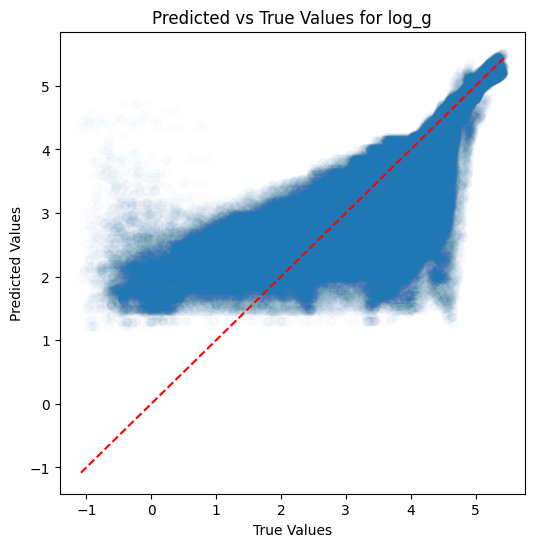

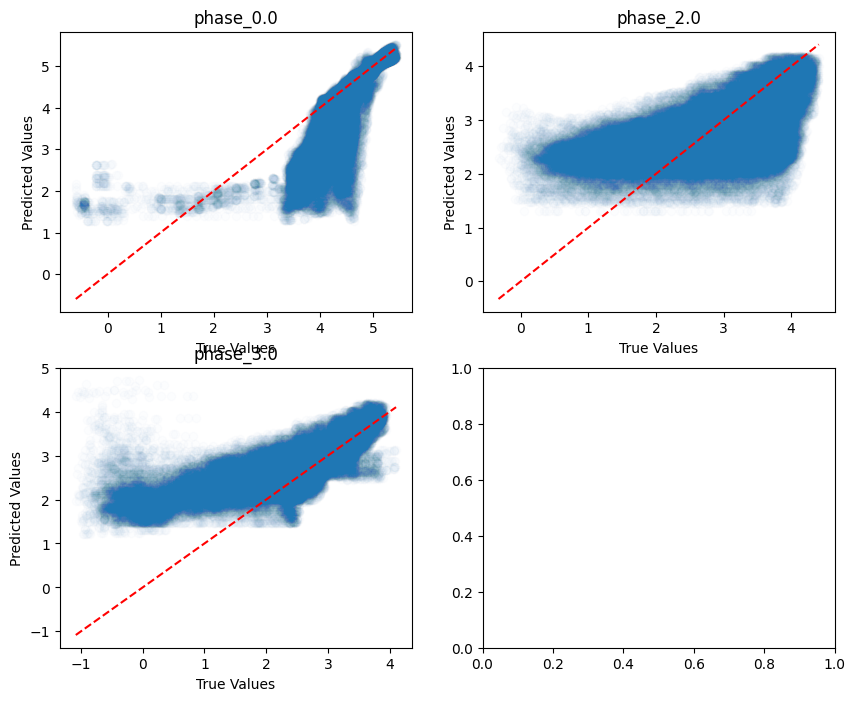

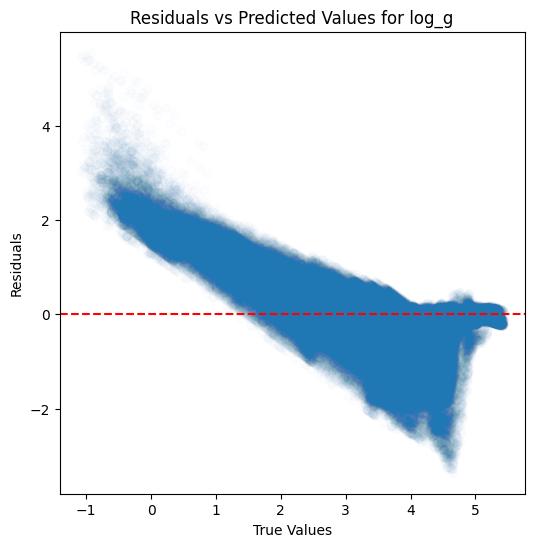

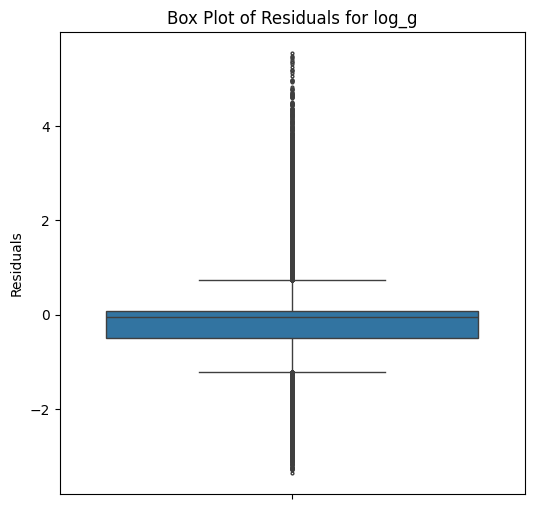

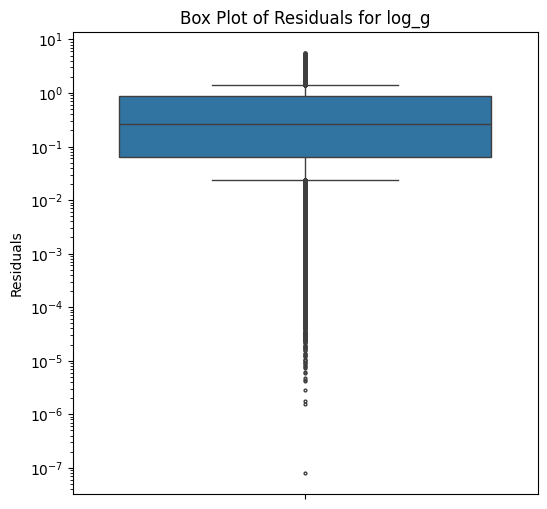

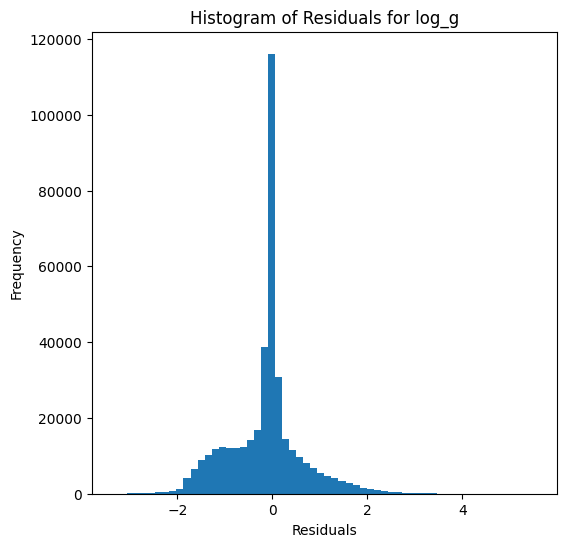

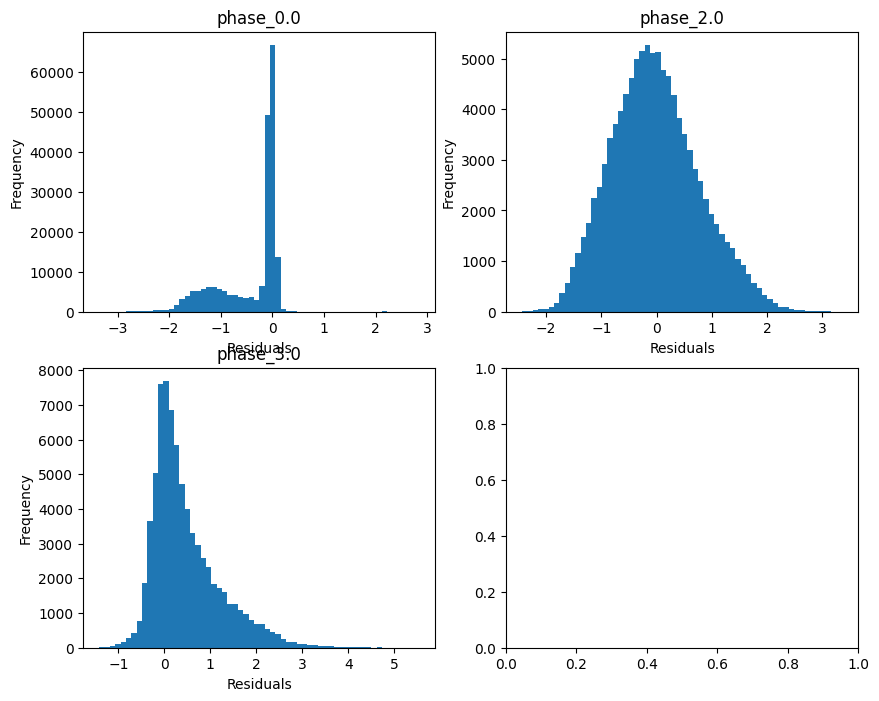

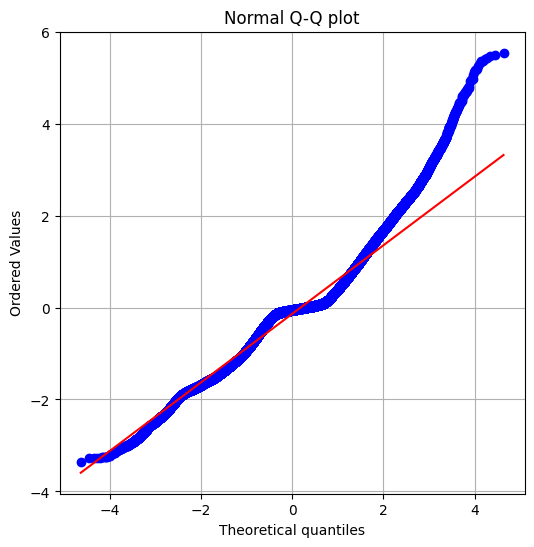

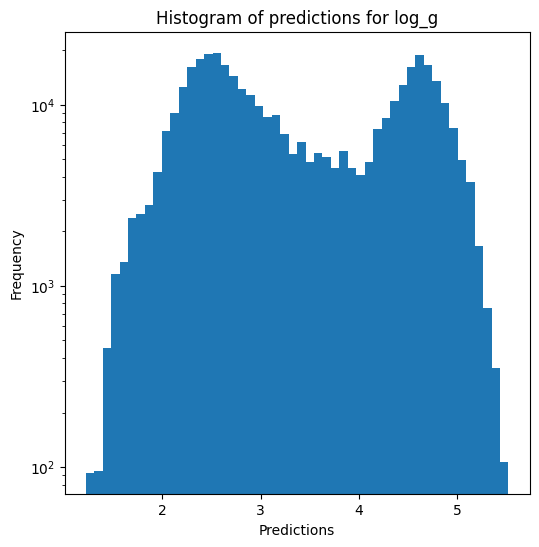

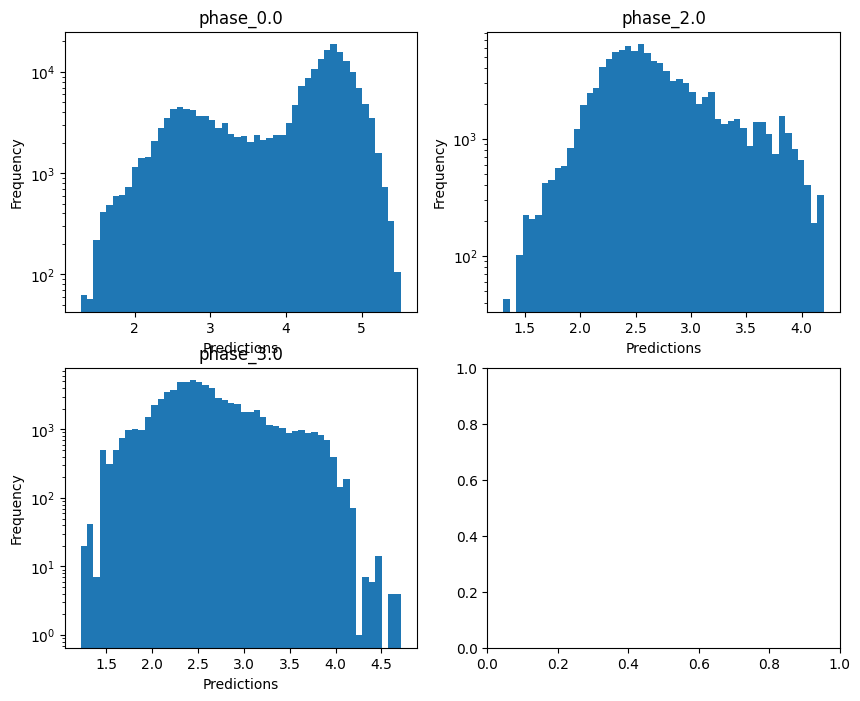


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.48473145728270606
  RMSE :  0.36529398289519416
  MAE :  0.22023675106758916
  MedAE :  0.0494023136379943
  CORR :  0.8677287985184537
  MAX_ER :  1.7461947961255302
  Percentiles : 
    75th percentile :  0.41820869919249715
    90th percentile :  0.7088093317159292
    95th percentile :  0.8135158809712871
    99th percentile :  1.002048563340769

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.275176267606035
  RMSE :  0.3962297348347993
  MAE :  0.31726629774077814
  MedAE :  0.26876177650331246
  CORR :  0.529277646993492
  MAX_ER :  1.669066895956939
  Percentiles : 
    75th percentile :  0.46362942208310975
    90th percentile :  0.6580486900533984
    95th percentile :  0.7687184619208778
    99th percentile :  0.982637554470375

radius results for the phase category with a 

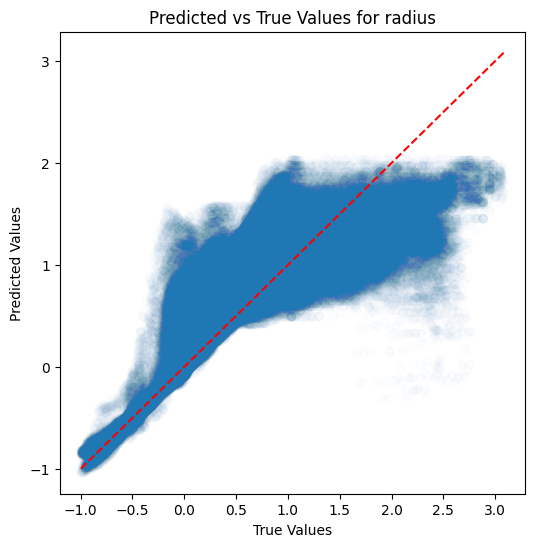

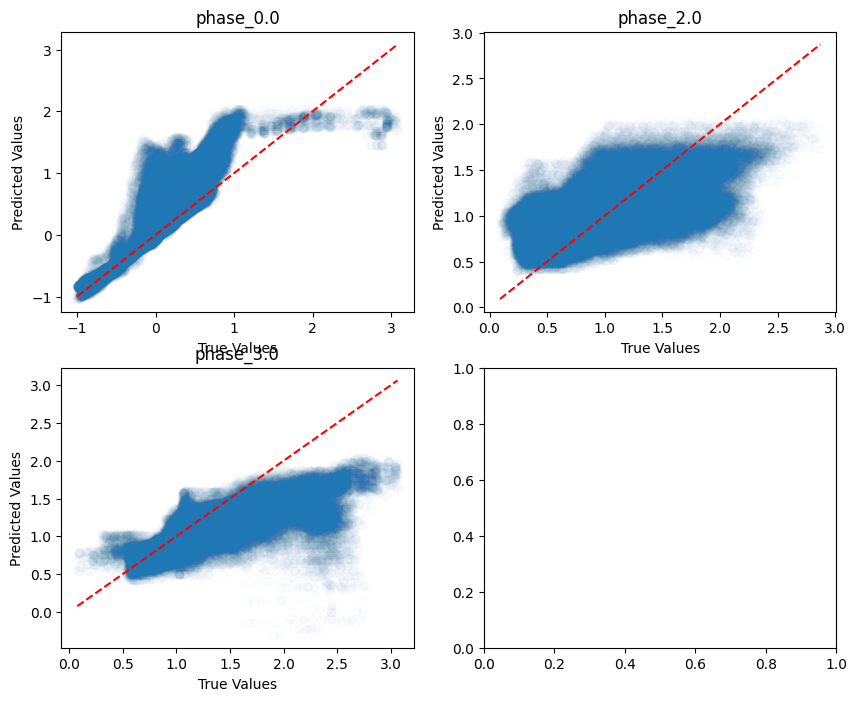

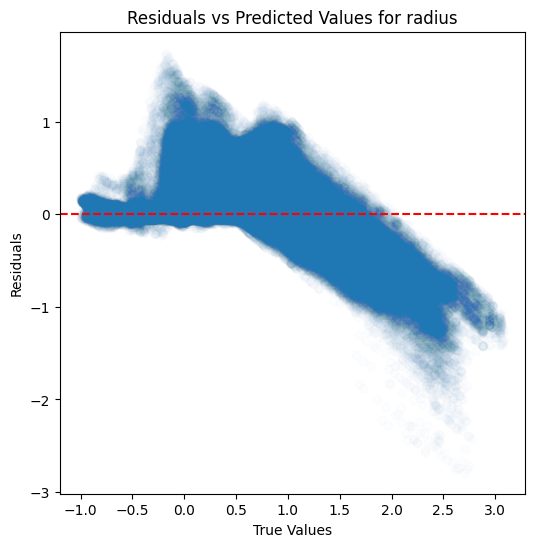

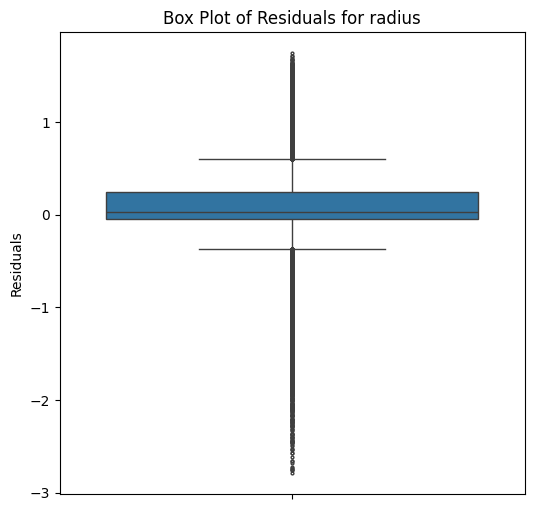

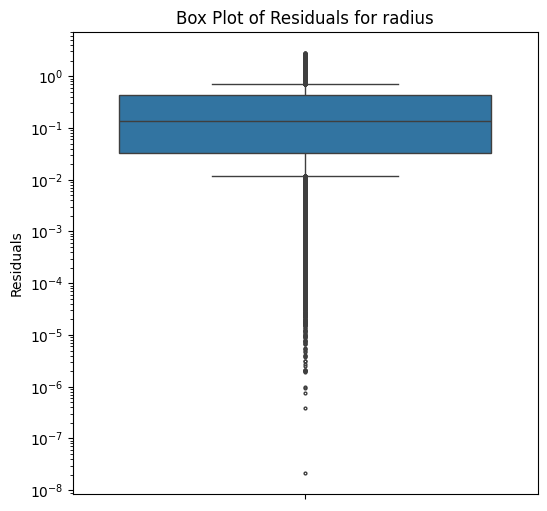

...

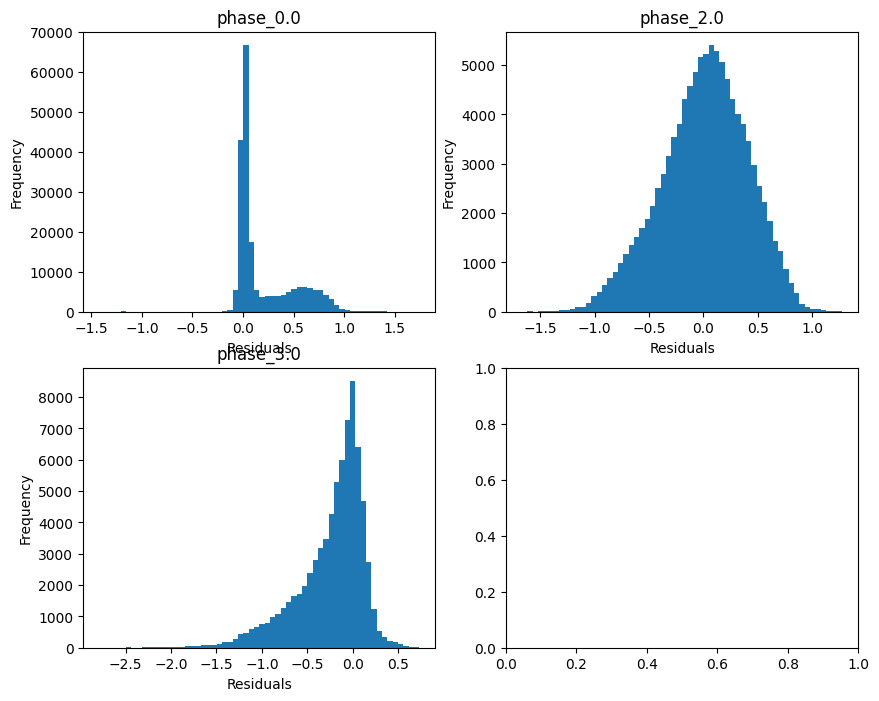

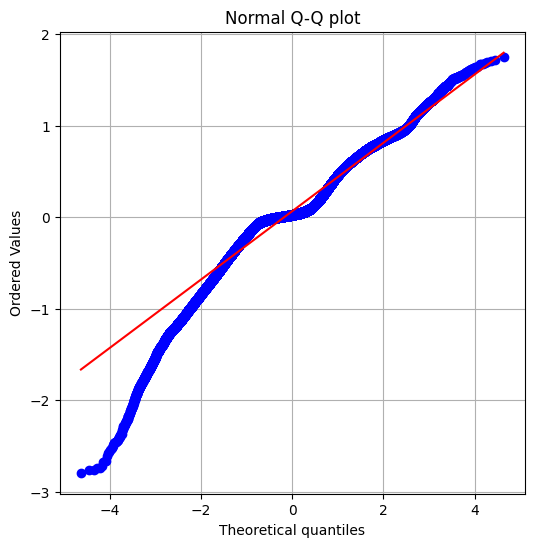

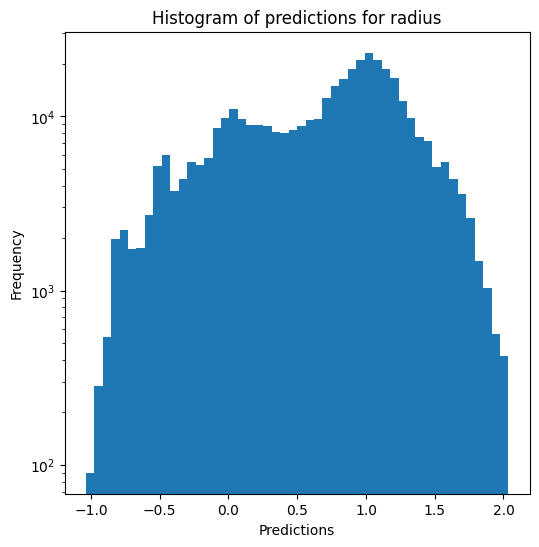

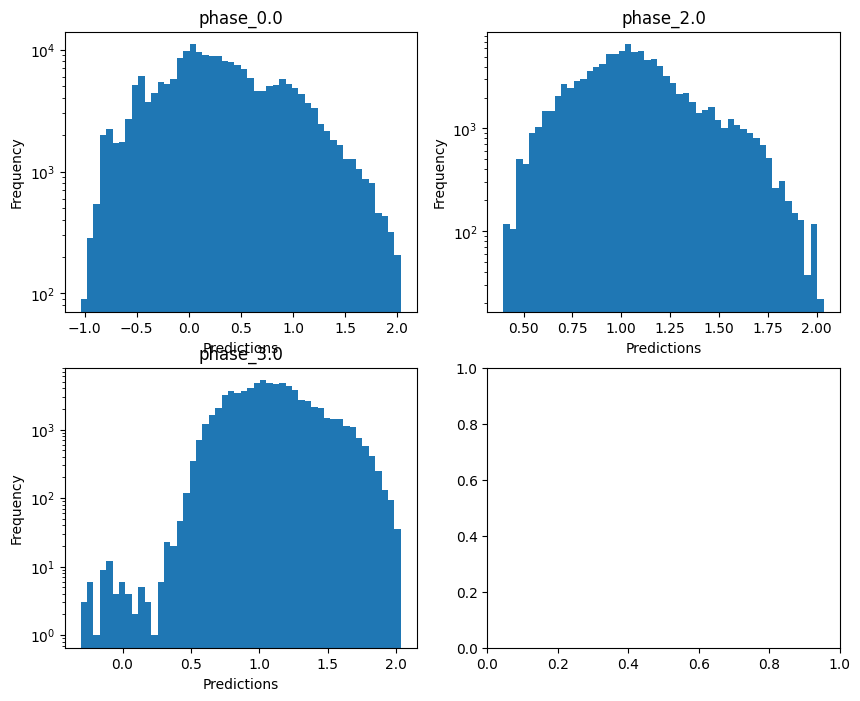

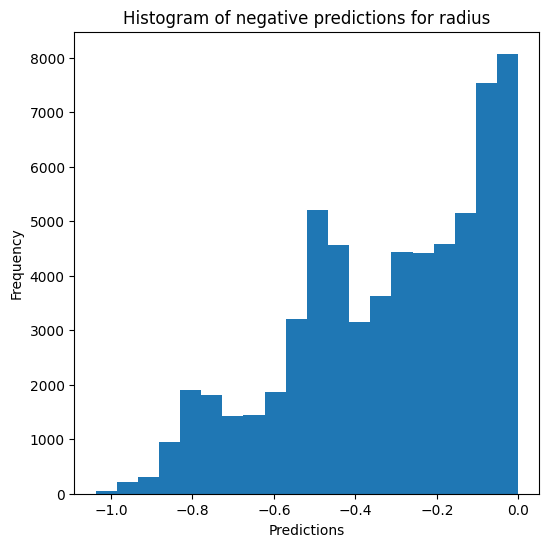

Saving predictions and results...


In [23]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, 
                                     hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)